### Problem Statement:
 - ElecKart is an e-commerce firm based out of Ontario, Canada specialising in electronic products. Over the last year, they had spent a significant amount of money on marketing. Occasionally, they had also offered big-ticket promotions (similar to the Big Billion Day). They are about to create a marketing budget for the next year, which includes spending on commercials, online campaigns, and pricing & promotion strategies. The CFO feels that the money spent over the last 12 months on marketing was not sufficiently impactful, and, that they can either cut on the budget or reallocate it optimally across marketing levers to improve the revenue response.
 - Imagine that you are a part of the marketing team working on budget optimisation. You need to develop a market mix model to observe the actual impact of different marketing variables over the last year. Using your understanding of the model, you have to recommend the optimal budget allocation for different marketing levers for the next year.

In [203]:
# Importing Necessary Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import warnings
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
warnings.filterwarnings('ignore')

In [2]:
# Reading data
data = pd.read_csv('ConsumerElectronics.csv',encoding = "ISO-8859-1")

In [3]:
# Checking the top 5 rows of data
data.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3.419301e+15,3.419301e+15,6400,1,\N,\N,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1.420831e+15,1.420831e+15,6900,1,\N,\N,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2.421913e+15,2.421913e+15,1990,1,\N,\N,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4.416592e+15,4.416592e+15,1690,1,\N,\N,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.419525e+15,4.419525e+15,1618,1,\N,\N,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3


In [4]:
# Checking the basic stats of the data
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
fsn_id,1648824,21219,ACCE6VGHYKYFX4WB,37622,NaN,NaN,NaN,NaN,NaN,NaN,NaN
order_date,1648824,1155192,2016-04-27 00:19:27,294,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Year,1.64882e+06,NaN,NaN,NaN,2015.52,0.499656,2015,2015,2016,2016,2016
Month,1.64882e+06,NaN,NaN,NaN,6.58565,3.62335,1,3,6,10,12
order_id,1.64882e+06,NaN,NaN,NaN,2.84244e+15,1.26913e+15,7.63315e+07,1.60259e+15,2.61182e+15,3.61061e+15,5.39508e+15
order_item_id,1.64882e+06,NaN,NaN,NaN,1.37563e+16,5.5946e+16,1.08016e+08,1.60673e+15,2.61919e+15,4.39771e+15,3.00037e+17
gmv,1.64882e+06,18086,999,23738,NaN,NaN,NaN,NaN,NaN,NaN,NaN
units,1.64882e+06,NaN,NaN,NaN,1.02209,0.253532,1,1,1,1,50
deliverybdays,1648824,143,\N,1312972,NaN,NaN,NaN,NaN,NaN,NaN,NaN
deliverycdays,1648824,171,\N,1312971,NaN,NaN,NaN,NaN,NaN,NaN,NaN


- From the above stats, there are totally more than 16 lakhs records in our data. 
- Few columns datatypes are not correct, so we need to tag them under appropriate datatype

In [5]:
data.shape

(1648824, 20)

In [6]:
# Checking null values from the data
data.isnull().sum()

fsn_id                             0
order_date                         0
Year                               0
Month                              0
order_id                           0
order_item_id                      0
gmv                                0
units                              0
deliverybdays                      0
deliverycdays                      0
s1_fact.order_payment_type         0
sla                                0
cust_id                            0
pincode                            0
product_analytic_super_category    0
product_analytic_category          0
product_analytic_sub_category      0
product_analytic_vertical          0
product_mrp                        0
product_procurement_sla            0
dtype: int64

- There are no null values from the data

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1648824 entries, 0 to 1648823
Data columns (total 20 columns):
fsn_id                             1648824 non-null object
order_date                         1648824 non-null object
Year                               1648824 non-null int64
Month                              1648824 non-null int64
order_id                           1648824 non-null float64
order_item_id                      1648824 non-null float64
gmv                                1648824 non-null object
units                              1648824 non-null int64
deliverybdays                      1648824 non-null object
deliverycdays                      1648824 non-null object
s1_fact.order_payment_type         1648824 non-null object
sla                                1648824 non-null int64
cust_id                            1648824 non-null object
pincode                            1648824 non-null object
product_analytic_super_category    1648824 non-null object
prod

In [8]:
# Converting order_date to date format
data['order_date'] = pd.to_datetime(data['order_date'])

#Extracting week number
data['week_number'] = data['order_date'].dt.week

#Converting order_id,order_item_id to object type and gmv to float datatype
data['gmv'] = data['gmv'].replace(' ', '0') # There is a white space in gmv column, replacing that with 0
data['deliverybdays'] = data['deliverybdays'].replace('\\N', '0')
data['deliverycdays'] = data['deliverycdays'].replace('\\N', '0')

data = data.astype({"order_id": object, "order_item_id": object,"gmv":float,"deliverybdays":int,"deliverycdays":int})

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1648824 entries, 0 to 1648823
Data columns (total 21 columns):
fsn_id                             1648824 non-null object
order_date                         1648824 non-null datetime64[ns]
Year                               1648824 non-null int64
Month                              1648824 non-null int64
order_id                           1648824 non-null object
order_item_id                      1648824 non-null object
gmv                                1648824 non-null float64
units                              1648824 non-null int64
deliverybdays                      1648824 non-null int32
deliverycdays                      1648824 non-null int32
s1_fact.order_payment_type         1648824 non-null object
sla                                1648824 non-null int64
cust_id                            1648824 non-null object
pincode                            1648824 non-null object
product_analytic_super_category    1648824 non-null object

In [10]:
data.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,...,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,week_number
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3.4193e+15,3.4193e+15,6400.0,1,0,0,...,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0,42
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1.42083e+15,1.42083e+15,6900.0,1,0,0,...,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0,43
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2.42191e+15,2.42191e+15,1990.0,1,0,0,...,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3,43
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4.41659e+15,4.41659e+15,1690.0,1,0,0,...,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3,42
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.41953e+15,4.41953e+15,1618.0,1,0,0,...,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3,42


In [11]:
data['s1_fact.order_payment_type'].value_counts()

COD        1191443
Prepaid     457381
Name: s1_fact.order_payment_type, dtype: int64

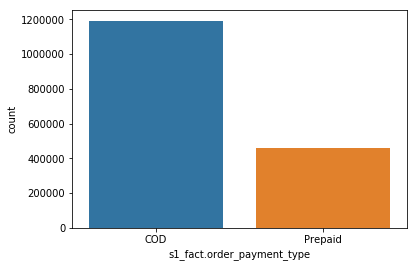

In [12]:
sns.countplot(x='s1_fact.order_payment_type',data=data)

- We have more Cash on Delivery than Prepaid

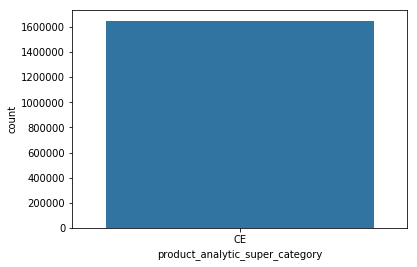

In [13]:
sns.countplot(x='product_analytic_super_category',data=data)

- product_analytic_super_category has only one category which is CE
- So, we have to remove this as it doesn't make any affect to the output

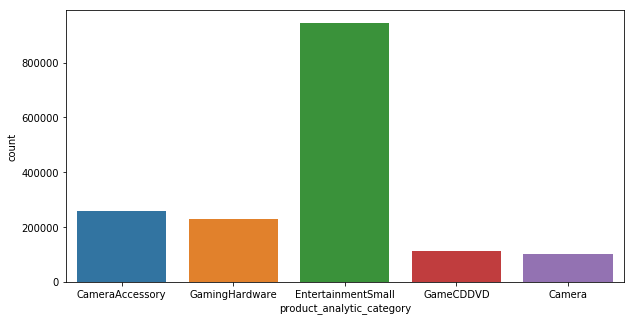

In [14]:
plt.figure(figsize=(10,5))
sns.countplot(x='product_analytic_category',data=data)

- In product_analytic_category column has 5 categories. EntertainmentSmall has more contribution across other categories

(array([     0., 100000., 200000., 300000., 400000., 500000., 600000.]),
 <a list of 7 Text xticklabel objects>)

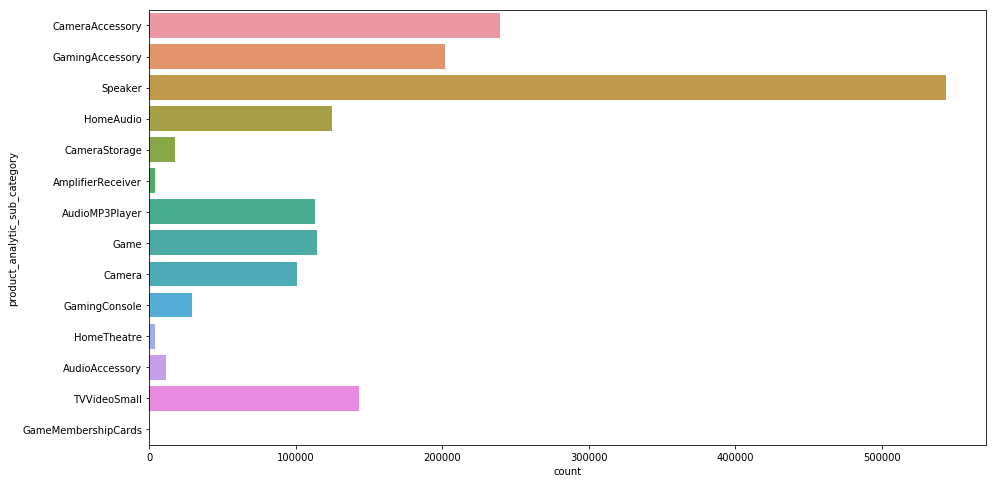

In [15]:
plt.figure(figsize=(15,8))
sns.countplot(y='product_analytic_sub_category',data=data)
plt.xticks(rotation=0)

- In product_analytic_sub_category column, there are totally 14 sub categories and out of which speaker is contributing more in the data

(array([     0.,  50000., 100000., 150000., 200000., 250000., 300000.,
        350000.]), <a list of 8 Text xticklabel objects>)

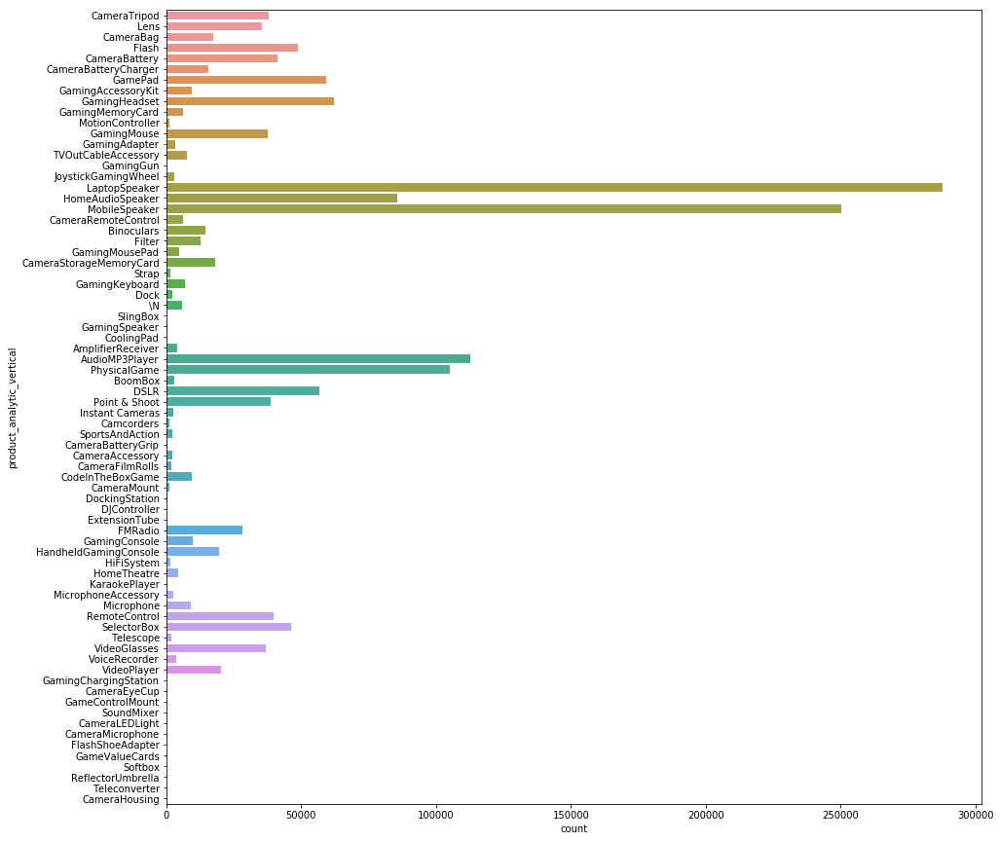

In [16]:
plt.figure(figsize=(15,15))
sns.countplot(y='product_analytic_vertical',data=data)
plt.xticks(rotation=0)

- In the product_analytic_vertical column Laptop Speaker and Mobile Speaker categories are contributing majorly to the data

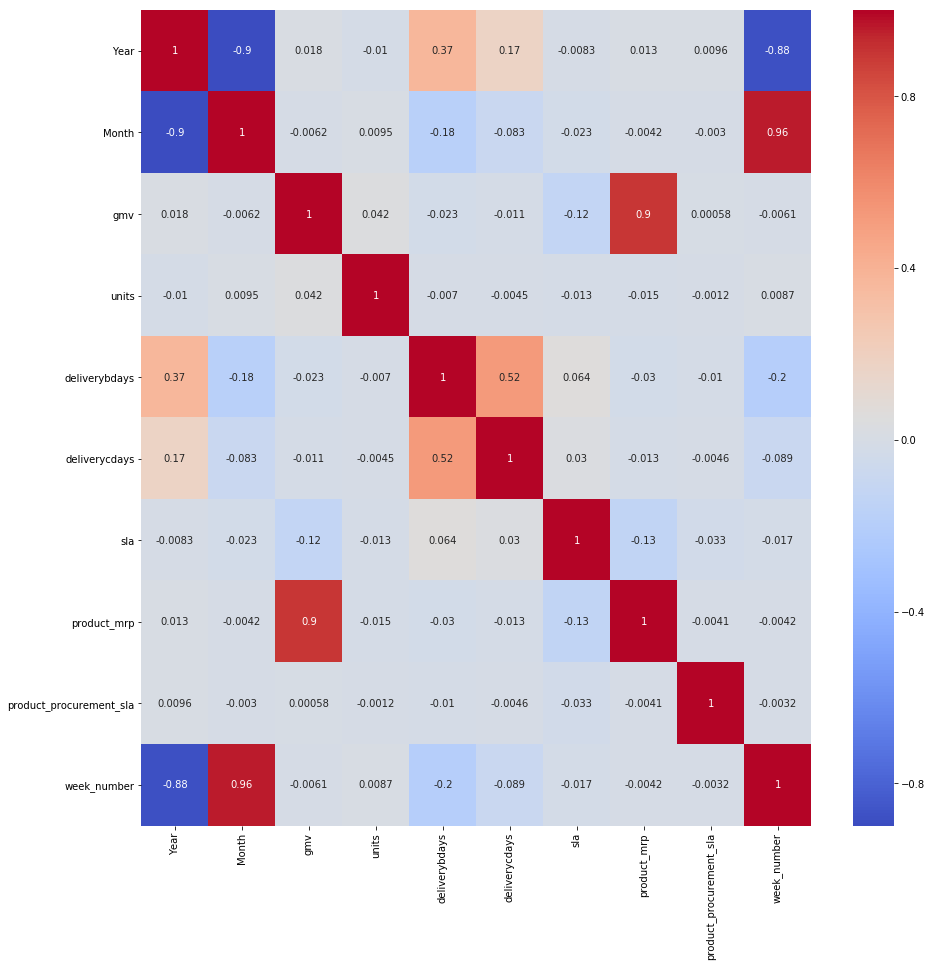

In [17]:
# Correlation among variables
plt.figure(figsize=(15,15))
sns.heatmap(data.corr(),annot=True,cmap='coolwarm')

- From the above correlation plot gmv variable is 90% positively correlated with product_mrp

In [18]:
data.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,...,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,week_number
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3.4193e+15,3.4193e+15,6400.0,1,0,0,...,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0,42
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1.42083e+15,1.42083e+15,6900.0,1,0,0,...,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0,43
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2.42191e+15,2.42191e+15,1990.0,1,0,0,...,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3,43
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4.41659e+15,4.41659e+15,1690.0,1,0,0,...,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3,42
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.41953e+15,4.41953e+15,1618.0,1,0,0,...,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3,42


In [19]:
# Checking  gmv > product_mrp*units
data.loc[data['gmv']>data['product_mrp']*data['units']].shape

(38569, 21)

- So there are 38,569 records having gmv > product_mrp*units.
- We have to remove them as these belongs to the error records

In [20]:
# Finding negative values of deliverybdays and deliverycdays columns
data.loc[(data['deliverybdays'] <= 0) & (data['deliverycdays'] <= 0)].shape

(1313548, 21)

- So there are 1313548 records having negative values in deliverybdays and deliverycdays
- We have to remove them as well

In [21]:
# Finding SLA less than 0
data.loc[(data['product_procurement_sla'] < 0)].shape

(75986, 21)

- From the above results, we can say that in our data there are 75K records whose SLA(Number of days it typically takes to deliver the product) is negative, So we have to drop them.

In [22]:
# We have to use the data from July 2015 to June 2016 only. So extracting the relevant data
data1 = data.loc[((data['Year']==2015) & ((data['Month']==7)|(data['Month']==8)|
                                 (data['Month']==9)|(data['Month']==10)|(data['Month']==11)|(data['Month']==12)))|
        ((data['Year']==2016)&((data['Month']==1)|(data['Month']==2)|(data['Month']==3)|(data['Month']==4)|(data['Month']==5)|
                              (data['Month']==6)))]

**Reading Media Investment data**

In [23]:
# Reading Media Investment data
data2 =  pd.read_excel('Media data and other information.xlsx',sheet_name='Media Investment',skiprows=2)

In [24]:
# Changing datatype of year and month to int
data2 = data2.iloc[:12,1:-2].fillna(0)
data2 = data2.astype({"Year": int,'Month':int}) 

In [25]:
data2

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM
0,2015,7,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697
1,2015,8,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528
2,2015,9,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149
3,2015,10,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011
4,2015,11,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032
5,2015,12,106.745312,5.397502,3.063360,56.705419,1.067307,22.503756,6.826938,11.181030
6,2016,1,74.196000,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.200000
7,2016,2,48.052000,2.586008,1.912651,11.725555,0.596771,19.892366,6.465019,4.873630
8,2016,3,100.024621,9.300000,2.100000,41.590000,0.370000,18.437818,6.217667,5.193591
9,2016,4,56.848241,5.205196,0.871892,24.308354,0.034876,16.514510,5.693456,4.219958


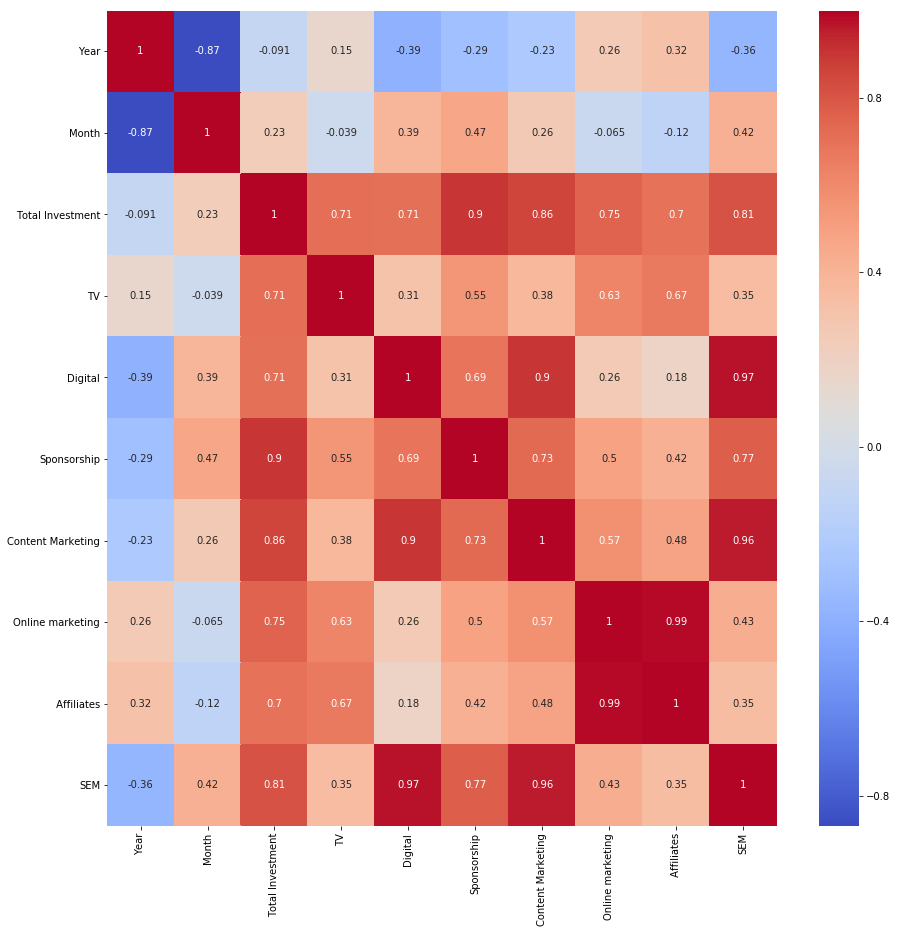

In [26]:
# Correlation among variables
plt.figure(figsize=(15,15))
sns.heatmap(data2.corr(),annot=True,cmap='coolwarm')

- From the above correlation plot, investment is 90% positively correlated to sponsorship and 86% correlated to content marketing
- Content Marketing is 90%  positively correlated to SEM

In [27]:
data2.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM
0,2015,7,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697
1,2015,8,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528
2,2015,9,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149
3,2015,10,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011
4,2015,11,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032


**As per the problem statement, we have to create Adstock variables**
   - Adstock (At) = Xt + Adstock rate*At-1 

In [28]:
#Function to find the ad_stock values
def ad_stock_function(data,col,value):
    ad_stock_value = 0
    ad_stock_vector = [] 
    for index, row in data.iterrows():        
        ad_stock_value = row[col] + value * ad_stock_value
        ad_stock_vector.append(ad_stock_value)   
    return ad_stock_vector

In [29]:
# Deriving adstock_camera_accessory column
data2['adstock_camera_accessory'] = ad_stock_function(data2,'Digital',0.1)
# Deriving adstock_gaming column
data2['adstock_gaming'] = ad_stock_function(data2,'TV',0.6)
# Deriving 
data2['adstock_laptop_speaker'] = ad_stock_function(data2,'TV',17.5)

In [30]:
data2.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,adstock_camera_accessory,adstock_gaming,adstock_laptop_speaker
0,2015,7,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,2.533014,0.215330,0.215330
1,2015,8,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,1.531375,0.135636,3.774717
2,2015,9,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,1.509665,3.960885,69.937045
3,2015,10,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,12.773446,8.521242,1230.042996
4,2015,11,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,2.552814,9.333375,21529.973062


In [31]:
# Merging data1 and data2 datafarmes
main_invest_data = pd.merge(data1,data2, on = ['Year','Month'],how='left')

**Deriving Pay days column. Pay days are 1st and 15th of every month.**

In [32]:
# Deriving day of the month
main_invest_data['day']= main_invest_data['order_date'].dt.day

#Deriving pay_days flag column
main_invest_data['pay_days'] = main_invest_data['day'].apply(lambda x: 1 if ((x==1)|(x==15)) else 0)

**Deriving holidays flag column**

In [33]:
# Preparing holidays list
holidays = ["2015-07-18","2015-07-19","2015-08-15","2015-08-16","2015-08-17",
            "2015-08-28","2015-08-29","2015-08-30","2015-10-15","2015-10-16",
            "2015-10-17","2015-11-07","2015-11-08","2015-11-09","2015-11-10",
            "2015-10-11","2015-10-12","2015-11-13","2015-11-14","2015-12-25",
            "2015-12-26","2015-12-27","2015-12-28","2015-12-29","2015-12-30",
            "2016-01-01","2016-01-02","2016-01-03","2016-01-20","2016-01-21",
            "2016-01-22","2016-02-01","2016-02-02","2016-02-20","2016-02-21",
            "2016-02-14","2016-02-15","2016-03-07","2016-03-08","2016-03-09",
            "2016-05-25","2016-05-26","2016-05-27"]
# Converting holidays list in to dataframe
holidays = pd.DataFrame(holidays,columns=['holidays_list'])
# Converting dataframe in to date format
holidays['holidays_list'] =  pd.to_datetime(holidays['holidays_list'])
# Creating holidays_flag column
holidays['holidays_flag'] = 1

#Deriving year,month and day columns
holidays['h_year']=holidays['holidays_list'].dt.year
holidays['h_month']=holidays['holidays_list'].dt.month
holidays['h_day']=holidays['holidays_list'].dt.day


In [34]:
# Merging holidays dataframe with main dataframe
main_invest_holidays_data = pd.merge(main_invest_data,holidays, left_on = ['Year','Month','day'],right_on=['h_year','h_month','h_day'],how='left').fillna(0).drop(['holidays_list','h_year','h_month','h_day'],axis=1)


In [35]:
main_invest_holidays_data.head(10)

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,...,Content Marketing,Online marketing,Affiliates,SEM,adstock_camera_accessory,adstock_gaming,adstock_laptop_speaker,day,pay_days,holidays_flag
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3.419301e+15,3.419301e+15,6400.0,1,0,0,...,3.444075,24.371778,6.973711,31.927011,12.773446,8.521242,1230.042996,17,0,1.0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1.420831e+15,1.420831e+15,6900.0,1,0,0,...,3.444075,24.371778,6.973711,31.927011,12.773446,8.521242,1230.042996,19,0,0.0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2.421913e+15,2.421913e+15,1990.0,1,0,0,...,3.444075,24.371778,6.973711,31.927011,12.773446,8.521242,1230.042996,20,0,0.0
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4.416592e+15,4.416592e+15,1690.0,1,0,0,...,3.444075,24.371778,6.973711,31.927011,12.773446,8.521242,1230.042996,14,0,0.0
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.419525e+15,4.419525e+15,1618.0,1,0,0,...,3.444075,24.371778,6.973711,31.927011,12.773446,8.521242,1230.042996,17,0,1.0
5,ACCCX3S5JGAJETYR,2015-10-17 12:07:24,2015,10,3.419189e+15,3.419189e+15,3324.0,1,0,0,...,3.444075,24.371778,6.973711,31.927011,12.773446,8.521242,1230.042996,17,0,1.0
6,ACCCX3S5JGAJETYR,2015-10-16 14:59:57,2015,10,3.418429e+15,3.418429e+15,3695.0,1,0,0,...,3.444075,24.371778,6.973711,31.927011,12.773446,8.521242,1230.042996,16,0,1.0
7,ACCCX3S5JGAJETYR,2015-10-15 23:41:39,2015,10,3.417799e+15,3.417799e+15,3695.0,1,0,0,...,3.444075,24.371778,6.973711,31.927011,12.773446,8.521242,1230.042996,15,1,1.0
8,ACCCX3S5JGAJETYR,2015-10-16 00:49:14,2015,10,2.417870e+15,2.417870e+15,0.0,1,0,0,...,3.444075,24.371778,6.973711,31.927011,12.773446,8.521242,1230.042996,16,0,1.0
9,ACCCX3S5JGAJETYR,2015-10-25 22:52:34,2015,10,4.426482e+15,4.426482e+15,3695.0,1,0,0,...,3.444075,24.371778,6.973711,31.927011,12.773446,8.521242,1230.042996,25,0,0.0


In [36]:
# Reading weather data
data3 =  pd.read_excel('ONTARIO-2015.xlsx',skiprows=24)
data4 = pd.read_excel('ONTARIO-2016.xlsx',skiprows=24)

In [37]:
data3.shape

(365, 27)

In [38]:
data3.isnull().sum()

Date/Time                      0
Year                           0
Month                          0
Day                            0
Data Quality                 136
Max Temp (°C)                149
Max Temp Flag                352
Min Temp (°C)                175
Min Temp Flag                326
Mean Temp (°C)               175
Mean Temp Flag               326
Heat Deg Days (°C)           175
Heat Deg Days Flag           326
Cool Deg Days (°C)           175
Cool Deg Days Flag           326
Total Rain (mm)              136
Total Rain Flag              358
Total Snow (cm)              136
Total Snow Flag              356
Total Precip (mm)            136
Total Precip Flag            353
Snow on Grnd (cm)            136
Snow on Grnd Flag            363
Dir of Max Gust (10s deg)    365
Dir of Max Gust Flag         365
Spd of Max Gust (km/h)       365
Spd of Max Gust Flag         365
dtype: int64

- From the above data, out of 365 records there are few columns has all missing values

In [39]:
data4.shape

(366, 27)

In [40]:
data4.isnull().sum()

Date/Time                      0
Year                           0
Month                          0
Day                            0
Data Quality                 139
Max Temp (°C)                140
Max Temp Flag                365
Min Temp (°C)                147
Min Temp Flag                358
Mean Temp (°C)               147
Mean Temp Flag               358
Heat Deg Days (°C)           147
Heat Deg Days Flag           358
Cool Deg Days (°C)           147
Cool Deg Days Flag           358
Total Rain (mm)              139
Total Rain Flag              363
Total Snow (cm)              139
Total Snow Flag              359
Total Precip (mm)            139
Total Precip Flag            359
Snow on Grnd (cm)            139
Snow on Grnd Flag            360
Dir of Max Gust (10s deg)    366
Dir of Max Gust Flag         366
Spd of Max Gust (km/h)       366
Spd of Max Gust Flag         366
dtype: int64

- Here also we have few columns which are totally null
- We will remove those columns after joining the two dataframes

In [41]:
# Merging two weather dataframes
weather_df = pd.concat([data3,data4], axis=0)

In [42]:
weather_df.shape

(731, 27)

In [43]:
weather_df.isnull().sum()

Date/Time                      0
Year                           0
Month                          0
Day                            0
Data Quality                 275
Max Temp (°C)                289
Max Temp Flag                717
Min Temp (°C)                322
Min Temp Flag                684
Mean Temp (°C)               322
Mean Temp Flag               684
Heat Deg Days (°C)           322
Heat Deg Days Flag           684
Cool Deg Days (°C)           322
Cool Deg Days Flag           684
Total Rain (mm)              275
Total Rain Flag              721
Total Snow (cm)              275
Total Snow Flag              715
Total Precip (mm)            275
Total Precip Flag            712
Snow on Grnd (cm)            275
Snow on Grnd Flag            723
Dir of Max Gust (10s deg)    731
Dir of Max Gust Flag         731
Spd of Max Gust (km/h)       731
Spd of Max Gust Flag         731
dtype: int64

In [44]:
weather_df['Total Precip Flag'].value_counts()

T    19
Name: Total Precip Flag, dtype: int64

In [45]:
weather_df['Total Snow Flag'].value_counts()           

T    16
Name: Total Snow Flag, dtype: int64

In [46]:
weather_df['Total Rain Flag'].value_counts()       

T    10
Name: Total Rain Flag, dtype: int64

In [47]:
weather_df['Cool Deg Days Flag'].value_counts()   

M    47
Name: Cool Deg Days Flag, dtype: int64

In [48]:
weather_df['Heat Deg Days Flag'].value_counts()   

M    47
Name: Heat Deg Days Flag, dtype: int64

In [49]:
weather_df['Mean Temp Flag'].value_counts()   

M    47
Name: Mean Temp Flag, dtype: int64

In [50]:
weather_df['Min Temp Flag'].value_counts()   

M    47
Name: Min Temp Flag, dtype: int64

In [51]:
weather_df['Max Temp Flag'].value_counts()   

M    14
Name: Max Temp Flag, dtype: int64

- It seems all the flag columns has only one category
- Here 'M' stands for Missing and 'T' stands for Trace
- As there is only one category in those columns, So it is not useful for our analysis

In [52]:
weather_df.columns

Index(['Date/Time', 'Year', 'Month', 'Day', 'Data Quality', 'Max Temp (°C)',
       'Max Temp Flag', 'Min Temp (°C)', 'Min Temp Flag', 'Mean Temp (°C)',
       'Mean Temp Flag', 'Heat Deg Days (°C)', 'Heat Deg Days Flag',
       'Cool Deg Days (°C)', 'Cool Deg Days Flag', 'Total Rain (mm)',
       'Total Rain Flag', 'Total Snow (cm)', 'Total Snow Flag',
       'Total Precip (mm)', 'Total Precip Flag', 'Snow on Grnd (cm)',
       'Snow on Grnd Flag', 'Dir of Max Gust (10s deg)',
       'Dir of Max Gust Flag', 'Spd of Max Gust (km/h)',
       'Spd of Max Gust Flag'],
      dtype='object')

In [53]:
# Selecting only necessary columns
weather_df = weather_df[['Year', 'Month', 'Day','Max Temp (°C)','Min Temp (°C)','Mean Temp (°C)','Heat Deg Days (°C)','Cool Deg Days (°C)',
           'Total Rain (mm)','Total Snow (cm)', 'Total Precip (mm)',  'Snow on Grnd (cm)' ]]

In [54]:
# Filling null values with median
for col in weather_df.select_dtypes(include=np.number):
    weather_df[col] = weather_df[col].fillna(weather_df[col].median())

In [55]:
weather_df.isnull().sum()

Year                  0
Month                 0
Day                   0
Max Temp (°C)         0
Min Temp (°C)         0
Mean Temp (°C)        0
Heat Deg Days (°C)    0
Cool Deg Days (°C)    0
Total Rain (mm)       0
Total Snow (cm)       0
Total Precip (mm)     0
Snow on Grnd (cm)     0
dtype: int64

- All missing values in the weather dataframe has been filled with median successfully

In [56]:
# Merging weather dataframe with main dataframe
main_invest_holidays_weather_data = pd.merge(main_invest_holidays_data,weather_df,left_on=['Year','Month','day'],right_on=['Year','Month','Day'],how='left').drop(['Day'],axis=1)

**Reading Stock Data**

In [57]:
pd.read_excel('Media data and other information.xlsx',sheet_name='Monthly NPS Score',skiprows=1).T

,0,1
Unnamed: 0,NPS,Stock Index
July'15,54.5996,1177
Aug'15,59.9871,1206
Sept'15,46.9254,1101
Oct'15,44.3984,1210
Nov'15,47,1233
Dec'15,45.8,1038
Jan'16,47.093,1052
Feb'16,50.3274,1222
Mar'16,49.0206,1015


In [58]:
#Preparing stock data dataframe
stock_data = [[2015, 7,54.5996,1177], [2015, 8,59.9871,1206], [2015, 9,46.9254,1101],
             [2015, 10,44.3984,1210],[2015, 11,47,1233],[2015, 12,45.8,1038],[2016, 1,47.093,1052],
             [2016, 2,50.3274,1222],[2016, 3,49.0206,1015],[2016, 4,51.8276,1242],[2016, 5,47.307,1228],[2016, 6,50.5167,1194]] 
stock_data = pd.DataFrame(stock_data, columns = ['Year', 'Month','NPS','Stock Index'])

In [59]:
stock_data

,Year,Month,NPS,Stock Index
0,2015,7,54.5996,1177
1,2015,8,59.9871,1206
2,2015,9,46.9254,1101
3,2015,10,44.3984,1210
4,2015,11,47.0000,1233
5,2015,12,45.8000,1038
6,2016,1,47.0930,1052
7,2016,2,50.3274,1222
8,2016,3,49.0206,1015
9,2016,4,51.8276,1242


In [60]:
#Merging stock data to main dataframe
main_invest_holidays_weather_stock_data = pd.merge(main_invest_holidays_weather_data,stock_data,on=['Year','Month'],how='left')

**Dropping un-necessary columns and Rows **

In [61]:
main_invest_holidays_weather_stock_data.shape

(1648215, 46)

In [62]:
# Updating faulty mrp values with gmv/units
main_invest_holidays_weather_stock_data['product_mrp'] = np.where(main_invest_holidays_weather_stock_data['product_mrp'] < main_invest_holidays_weather_stock_data['gmv'] / main_invest_holidays_weather_stock_data['units'], 
                                   main_invest_holidays_weather_stock_data['gmv'] / main_invest_holidays_weather_stock_data['units'], main_invest_holidays_weather_stock_data['product_mrp'])
                          

In [63]:
# Removing negative deliverybdays and deliverycdays
main_invest_holidays_weather_stock_data = main_invest_holidays_weather_stock_data.loc[(main_invest_holidays_weather_stock_data['deliverybdays'] >= 0) & (main_invest_holidays_weather_stock_data['deliverycdays'] >= 0)].reset_index(drop=True)


In [64]:
# Removing negative values from sla column
main_invest_holidays_weather_stock_data = main_invest_holidays_weather_stock_data.loc[(main_invest_holidays_weather_stock_data['product_procurement_sla'] >= 0)].reset_index(drop=True)

In [65]:
# Removing product_procurement_sla more than 1000 from sla column
main_invest_holidays_weather_stock_data = main_invest_holidays_weather_stock_data.loc[(main_invest_holidays_weather_stock_data['product_procurement_sla'] <1000)].reset_index(drop=True)

In [66]:
# There are few categories in which values are just blank space, so replacing them with null value
main_invest_holidays_weather_stock_data.replace(' ', np.nan, inplace = True)

In [67]:
main_invest_holidays_weather_stock_data.isnull().sum().sort_values(ascending=False)

pincode                            4519
cust_id                            4519
Stock Index                           0
sla                                   0
week_number                           0
product_procurement_sla               0
product_mrp                           0
product_analytic_vertical             0
product_analytic_sub_category         0
product_analytic_category             0
product_analytic_super_category       0
s1_fact.order_payment_type            0
NPS                                   0
deliverycdays                         0
deliverybdays                         0
units                                 0
gmv                                   0
order_item_id                         0
order_id                              0
Month                                 0
Year                                  0
order_date                            0
Total Investment                      0
TV                                    0
Digital                               0


In [68]:
# Selecting the records where gmv > 0
main_invest_holidays_weather_stock_data =  main_invest_holidays_weather_stock_data[main_invest_holidays_weather_stock_data['gmv']>0]

In [69]:
# Checking null values in the data
main_invest_holidays_weather_stock_data.isnull().sum().sort_values(ascending=False)

Stock Index                        0
sla                                0
week_number                        0
product_procurement_sla            0
product_mrp                        0
product_analytic_vertical          0
product_analytic_sub_category      0
product_analytic_category          0
product_analytic_super_category    0
pincode                            0
cust_id                            0
s1_fact.order_payment_type         0
NPS                                0
deliverycdays                      0
deliverybdays                      0
units                              0
gmv                                0
order_item_id                      0
order_id                           0
Month                              0
Year                               0
order_date                         0
Total Investment                   0
TV                                 0
Digital                            0
Sponsorship                        0
Snow on Grnd (cm)                  0
T

In [70]:
#Sorting the dataframe
main_invest_holidays_weather_stock_data.sort_values(['Year', 'Month','day'], ascending=[True, True,True], inplace=True)

In [71]:
#Dropping un-necessary columns
final_data = main_invest_holidays_weather_stock_data.drop(['fsn_id', 'order_date','Year','Month','day',
                                                          'order_id','order_item_id','cust_id','pincode'], axis=1).reset_index(drop=True)

In [72]:
final_data.head()

,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,...,Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),NPS,Stock Index
0,428.0,1,0,0,Prepaid,7,CE,GamingHardware,GamingAccessory,GamePad,...,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0,54.5996,1177
1,3040.0,1,0,0,Prepaid,0,CE,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,...,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0,54.5996,1177
2,310.0,1,0,0,Prepaid,11,CE,EntertainmentSmall,Speaker,LaptopSpeaker,...,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0,54.5996,1177
3,349.0,1,0,0,Prepaid,13,CE,EntertainmentSmall,Speaker,LaptopSpeaker,...,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0,54.5996,1177
4,299.0,1,0,0,Prepaid,7,CE,CameraAccessory,CameraStorage,CameraStorageMemoryCard,...,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0,54.5996,1177


In [73]:
final_data.shape

(1561959, 37)

** As per the problem statement, we have to do seperate analysis on 'Camera Accessory', 'Gaming Accessory' and 'Home Audio'. So separating 3 dataframes**

In [74]:
camera_accessory_df = final_data.loc[final_data['product_analytic_sub_category']=='CameraAccessory']
gaming_accessory_df = final_data.loc[final_data['product_analytic_sub_category']=='GamingAccessory']
homeaudio_df = final_data.loc[final_data['product_analytic_sub_category']=='HomeAudio']

In [75]:
camera_accessory_df.head()

,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,...,Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),NPS,Stock Index
28,420.0,1,1,1,Prepaid,1,CE,CameraAccessory,CameraAccessory,CameraRemoteControl,...,10.0,17.5,0.5,0.0,0.0,0.0,0.0,0.0,54.5996,1177
29,4900.0,1,1,1,Prepaid,2,CE,CameraAccessory,CameraAccessory,CameraBag,...,10.0,17.5,0.5,0.0,0.0,0.0,0.0,0.0,54.5996,1177
33,830.0,1,1,1,Prepaid,1,CE,CameraAccessory,CameraAccessory,CameraTripod,...,10.0,17.5,0.5,0.0,0.0,0.0,0.0,0.0,54.5996,1177
34,595.0,1,1,2,Prepaid,4,CE,CameraAccessory,CameraAccessory,CameraTripod,...,10.0,17.5,0.5,0.0,0.0,0.0,0.0,0.0,54.5996,1177
38,356.0,1,1,1,Prepaid,1,CE,CameraAccessory,CameraAccessory,CameraBatteryCharger,...,10.0,17.5,0.5,0.0,0.0,0.0,0.0,0.0,54.5996,1177


In [76]:
camera_accessory_df['product_analytic_super_category'].value_counts()

CE    231535
Name: product_analytic_super_category, dtype: int64

In [77]:
camera_accessory_df['product_analytic_category'].value_counts()

CameraAccessory    231535
Name: product_analytic_category, dtype: int64

In [78]:
camera_accessory_df['product_analytic_vertical'].value_counts()

Flash                   48665
CameraBattery           38075
CameraTripod            35588
Lens                    34601
CameraBag               17007
CameraBatteryCharger    15338
Binoculars              14340
Filter                  12441
CameraRemoteControl      6034
CameraAccessory          2253
CameraFilmRolls          1900
Telescope                1818
Strap                    1668
CameraMount              1128
CameraBatteryGrip         400
CameraEyeCup               98
ExtensionTube              87
CameraMicrophone           51
CameraHousing              19
Softbox                    15
ReflectorUmbrella           3
CameraLEDLight              3
FlashShoeAdapter            2
Teleconverter               1
Name: product_analytic_vertical, dtype: int64

In [79]:
gaming_accessory_df.head()

,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,...,Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),NPS,Stock Index
0,428.0,1,0,0,Prepaid,7,CE,GamingHardware,GamingAccessory,GamePad,...,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0,54.5996,1177
5,1999.0,1,0,0,Prepaid,1,CE,GamingHardware,GamingAccessory,GamePad,...,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0,54.5996,1177
6,385.0,1,0,0,Prepaid,10,CE,GamingHardware,GamingAccessory,GamingMouse,...,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0,54.5996,1177
30,339.0,1,1,1,Prepaid,1,CE,GamingHardware,GamingAccessory,GamePad,...,10.0,17.5,0.5,0.0,0.0,0.0,0.0,0.0,54.5996,1177
31,339.0,1,1,1,Prepaid,1,CE,GamingHardware,GamingAccessory,GamePad,...,10.0,17.5,0.5,0.0,0.0,0.0,0.0,0.0,54.5996,1177


In [80]:
gaming_accessory_df['s1_fact.order_payment_type'].value_counts()

COD        149642
Prepaid     47674
Name: s1_fact.order_payment_type, dtype: int64

In [81]:
gaming_accessory_df['product_analytic_super_category'].value_counts()

CE    197316
Name: product_analytic_super_category, dtype: int64

In [82]:
gaming_accessory_df['product_analytic_category'].value_counts()

GamingHardware    197316
Name: product_analytic_category, dtype: int64

In [83]:
gaming_accessory_df['product_analytic_vertical'].value_counts()

GamingHeadset            61965
GamePad                  57536
GamingMouse              37112
GamingAccessoryKit        9262
TVOutCableAccessory       7521
GamingKeyboard            6595
GamingMemoryCard          6000
GamingMousePad            3500
GamingAdapter             3223
JoystickGamingWheel       2858
MotionController          1150
GamingSpeaker              500
GamingChargingStation       47
CoolingPad                  46
GameControlMount             1
Name: product_analytic_vertical, dtype: int64

In [84]:
homeaudio_df.head()

,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,...,Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),NPS,Stock Index
1,3040.0,1,0,0,Prepaid,0,CE,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,...,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0,54.5996,1177
9,2249.0,1,0,0,Prepaid,7,CE,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,...,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0,54.5996,1177
14,2950.0,1,0,0,Prepaid,6,CE,EntertainmentSmall,HomeAudio,BoomBox,...,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0,54.5996,1177
40,4794.0,1,1,1,Prepaid,1,CE,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,...,10.0,17.5,0.5,0.0,0.0,0.0,0.0,0.0,54.5996,1177
64,2990.0,1,1,1,Prepaid,1,CE,EntertainmentSmall,HomeAudio,HomeAudioSpeaker,...,10.0,17.5,0.5,0.0,0.0,0.0,0.0,0.0,54.5996,1177


In [85]:
homeaudio_df['s1_fact.order_payment_type'].value_counts()

COD        90944
Prepaid    29169
Name: s1_fact.order_payment_type, dtype: int64

In [86]:
homeaudio_df['product_analytic_super_category'].value_counts()

CE    120113
Name: product_analytic_super_category, dtype: int64

In [87]:
homeaudio_df['product_analytic_category'].value_counts()

EntertainmentSmall    120113
Name: product_analytic_category, dtype: int64

In [88]:
homeaudio_df['product_analytic_vertical'].value_counts()

HomeAudioSpeaker    81866
FMRadio             27343
VoiceRecorder        3715
BoomBox              2866
Dock                 2106
HiFiSystem           1551
DockingStation        380
DJController          213
SoundMixer             69
SlingBox                3
KaraokePlayer           1
Name: product_analytic_vertical, dtype: int64

In [89]:
#Dropping columns which are not necessary for the analysis

camera_accessory_df.drop(['product_analytic_super_category','product_analytic_category','product_analytic_sub_category'], axis=1, inplace=True)
gaming_accessory_df.drop(['product_analytic_super_category','product_analytic_category','product_analytic_sub_category'], axis=1, inplace=True)
homeaudio_df.drop(['product_analytic_super_category','product_analytic_category','product_analytic_sub_category'], axis=1, inplace=True)

In [90]:
# Labelling the category s1_fact.order_payment_type
camera_accessory_df['s1_fact.order_payment_type'] = camera_accessory_df['s1_fact.order_payment_type'].apply(lambda x : 1 if x =='COD' else 0)
gaming_accessory_df['s1_fact.order_payment_type'] = gaming_accessory_df['s1_fact.order_payment_type'].apply(lambda x : 1 if x =='COD' else 0)
homeaudio_df['s1_fact.order_payment_type'] = homeaudio_df['s1_fact.order_payment_type'].apply(lambda x : 1 if x =='COD' else 0)

In [91]:
# Creating dummy variables for the product_analytic_vertical variable
dummy1 = pd.get_dummies(camera_accessory_df[['product_analytic_vertical']], prefix='product_vertical', drop_first=True)
dummy2 = pd.get_dummies(gaming_accessory_df[['product_analytic_vertical']], prefix='product_vertical', drop_first=True)
dummy3 = pd.get_dummies(homeaudio_df[['product_analytic_vertical']], prefix='product_vertical', drop_first=True)

# Adding the results to the original dataframes
camera_accessory_df = pd.concat([camera_accessory_df, dummy1], axis=1)
gaming_accessory_df = pd.concat([gaming_accessory_df, dummy2], axis=1)
homeaudio_df = pd.concat([homeaudio_df, dummy3], axis=1)

# Removing un-necessary columns
camera_accessory_df = camera_accessory_df.drop('product_analytic_vertical', axis=1)
gaming_accessory_df = gaming_accessory_df.drop('product_analytic_vertical', axis=1)
homeaudio_df = homeaudio_df.drop('product_analytic_vertical', axis=1)

**Aggregating data by weekly**

In [92]:
# Aggregating data by weekly
group_cols = ['week_number']
metric_cols = ['gmv', 'units', 'deliverybdays', 'deliverycdays',
       's1_fact.order_payment_type', 'sla', 'product_mrp',
       'product_procurement_sla', 'Total Investment', 'TV',
       'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing',
       ' Affiliates', 'SEM','adstock_camera_accessory','adstock_gaming','adstock_laptop_speaker' ,'pay_days', 'holidays_flag', 'Max Temp (°C)',
       'Min Temp (°C)', 'Mean Temp (°C)', 'Heat Deg Days (°C)',
       'Cool Deg Days (°C)', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)', 'NPS', 'Stock Index',
       'product_vertical_CameraAccessory', 'product_vertical_CameraBag',
       'product_vertical_CameraBattery',
       'product_vertical_CameraBatteryCharger',
       'product_vertical_CameraBatteryGrip', 'product_vertical_CameraEyeCup',
       'product_vertical_CameraFilmRolls', 'product_vertical_CameraHousing',
       'product_vertical_CameraLEDLight', 'product_vertical_CameraMicrophone',
       'product_vertical_CameraMount', 'product_vertical_CameraRemoteControl',
       'product_vertical_CameraTripod', 'product_vertical_ExtensionTube',
       'product_vertical_Filter', 'product_vertical_Flash',
       'product_vertical_FlashShoeAdapter', 'product_vertical_Lens',
       'product_vertical_ReflectorUmbrella', 'product_vertical_Softbox',
       'product_vertical_Strap', 'product_vertical_Teleconverter',
       'product_vertical_Telescope']

camera = camera_accessory_df.groupby(group_cols)[metric_cols].mean()

In [93]:
metric_cols =['gmv', 'units', 'deliverybdays', 'deliverycdays',
       's1_fact.order_payment_type', 'sla', 'product_mrp',
       'product_procurement_sla', 'Total Investment', 'TV',
       'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing',
       ' Affiliates', 'SEM','adstock_camera_accessory','adstock_gaming','adstock_laptop_speaker' ,'pay_days', 'holidays_flag', 'Max Temp (°C)',
       'Min Temp (°C)', 'Mean Temp (°C)', 'Heat Deg Days (°C)',
       'Cool Deg Days (°C)', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)', 'NPS', 'Stock Index',
       'product_vertical_GameControlMount', 'product_vertical_GamePad',
       'product_vertical_GamingAccessoryKit', 'product_vertical_GamingAdapter',
       'product_vertical_GamingChargingStation',
       'product_vertical_GamingHeadset', 'product_vertical_GamingKeyboard',
       'product_vertical_GamingMemoryCard', 'product_vertical_GamingMouse',
       'product_vertical_GamingMousePad', 'product_vertical_GamingSpeaker',
       'product_vertical_JoystickGamingWheel',
       'product_vertical_MotionController',
       'product_vertical_TVOutCableAccessory']
gaming = gaming_accessory_df.groupby(group_cols)[metric_cols].mean()

In [94]:
metric_cols = ['gmv', 'units', 'deliverybdays', 'deliverycdays',
       's1_fact.order_payment_type', 'sla', 'product_mrp',
       'product_procurement_sla', 'Total Investment', 'TV',
       'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing',
       ' Affiliates', 'SEM','adstock_camera_accessory','adstock_gaming','adstock_laptop_speaker', 'pay_days', 'holidays_flag', 'Max Temp (°C)',
       'Min Temp (°C)', 'Mean Temp (°C)', 'Heat Deg Days (°C)',
       'Cool Deg Days (°C)', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)', 'NPS', 'Stock Index',
       'product_vertical_DJController', 'product_vertical_Dock',
       'product_vertical_DockingStation', 'product_vertical_FMRadio',
       'product_vertical_HiFiSystem', 'product_vertical_HomeAudioSpeaker',
       'product_vertical_KaraokePlayer', 'product_vertical_SlingBox',
       'product_vertical_SoundMixer', 'product_vertical_VoiceRecorder']

homeaudio = homeaudio_df.groupby(group_cols)[metric_cols].mean()

In [95]:
# Taking copy of the 3 dataframes
camera_df = camera.copy()
gaming_df = gaming.copy()
homeaudio_df = homeaudio.copy()

In [96]:
# Seperating Independent variables and dependent variables
camera_df_y=camera_df.pop('gmv')
camera_df_X=camera_df

gaming_df_y=gaming_df.pop('gmv')
gaming_df_X=gaming_df

homeaudio_df_y=homeaudio_df.pop('gmv')
homeaudio_df_X=homeaudio_df


In [174]:
# Train and test splitting
camera_X_train,camera_X_test,camera_y_train,camera_y_test = train_test_split(camera_df_X,camera_df_y, test_size = 0.3, random_state = 10)

# Train and test splitting
gaming_X_train,gaming_X_test,gaming_y_train,gaming_y_test = train_test_split(gaming_df_X,gaming_df_y, test_size = 0.3, random_state = 10)

# Train and test splitting
homeaudio_X_train,homeaudio_X_test,homeaudio_y_train,homeaudio_y_test = train_test_split(homeaudio_df_X,homeaudio_df_y, test_size = 0.3, random_state = 10)

In [175]:
# Scaling the variables to bring them to the same scale
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [218]:
#Scaling the variables
cols1 = ['units', 'deliverybdays', 'deliverycdays', 's1_fact.order_payment_type',
       'sla', 'product_mrp', 'product_procurement_sla', 'Total Investment',
       'TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing',
       ' Affiliates', 'SEM', 'adstock_camera_accessory', 'adstock_gaming',
       'adstock_laptop_speaker', 'pay_days', 'holidays_flag', 'Max Temp (°C)',
       'Min Temp (°C)', 'Mean Temp (°C)', 'Heat Deg Days (°C)',
       'Cool Deg Days (°C)', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)', 'NPS', 'Stock Index',
       'product_vertical_CameraAccessory', 'product_vertical_CameraBag',
       'product_vertical_CameraBattery',
       'product_vertical_CameraBatteryCharger',
       'product_vertical_CameraBatteryGrip', 'product_vertical_CameraEyeCup',
       'product_vertical_CameraFilmRolls', 'product_vertical_CameraHousing',
       'product_vertical_CameraLEDLight', 'product_vertical_CameraMicrophone',
       'product_vertical_CameraMount', 'product_vertical_CameraRemoteControl',
       'product_vertical_CameraTripod', 'product_vertical_ExtensionTube',
       'product_vertical_Filter', 'product_vertical_Flash',
       'product_vertical_FlashShoeAdapter', 'product_vertical_Lens',
       'product_vertical_ReflectorUmbrella', 'product_vertical_Softbox',
       'product_vertical_Strap', 'product_vertical_Teleconverter',
       'product_vertical_Telescope']
camera_X_train[cols1] = scaler.fit_transform(camera_X_train[cols1])
camera_X_test[cols1] = scaler.transform(camera_X_test[cols1])

cols2 = ['units', 'deliverybdays', 'deliverycdays', 's1_fact.order_payment_type',
       'sla', 'product_mrp', 'product_procurement_sla', 'Total Investment',
       'TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing',
       ' Affiliates', 'SEM', 'adstock_camera_accessory', 'adstock_gaming',
       'adstock_laptop_speaker', 'pay_days', 'holidays_flag', 'Max Temp (°C)',
       'Min Temp (°C)', 'Mean Temp (°C)', 'Heat Deg Days (°C)',
       'Cool Deg Days (°C)', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)', 'NPS', 'Stock Index',
       'product_vertical_GameControlMount', 'product_vertical_GamePad',
       'product_vertical_GamingAccessoryKit', 'product_vertical_GamingAdapter',
       'product_vertical_GamingChargingStation',
       'product_vertical_GamingHeadset', 'product_vertical_GamingKeyboard',
       'product_vertical_GamingMemoryCard', 'product_vertical_GamingMouse',
       'product_vertical_GamingMousePad', 'product_vertical_GamingSpeaker',
       'product_vertical_JoystickGamingWheel',
       'product_vertical_MotionController',
       'product_vertical_TVOutCableAccessory']

gaming_X_train[cols2] = scaler.fit_transform(gaming_X_train[cols2])
gaming_X_test[cols2] = scaler.transform(gaming_X_test[cols2])

cols3 = ['units', 'deliverybdays', 'deliverycdays', 's1_fact.order_payment_type',
       'sla', 'product_mrp', 'product_procurement_sla', 'Total Investment',
       'TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing',
       ' Affiliates', 'SEM', 'adstock_camera_accessory', 'adstock_gaming',
       'adstock_laptop_speaker', 'pay_days', 'holidays_flag', 'Max Temp (°C)',
       'Min Temp (°C)', 'Mean Temp (°C)', 'Heat Deg Days (°C)',
       'Cool Deg Days (°C)', 'Total Rain (mm)', 'Total Snow (cm)',
       'Total Precip (mm)', 'Snow on Grnd (cm)', 'NPS', 'Stock Index',
       'product_vertical_DJController', 'product_vertical_Dock',
       'product_vertical_DockingStation', 'product_vertical_FMRadio',
       'product_vertical_HiFiSystem', 'product_vertical_HomeAudioSpeaker',
       'product_vertical_KaraokePlayer', 'product_vertical_SlingBox',
       'product_vertical_SoundMixer', 'product_vertical_VoiceRecorder']

homeaudio_X_train[cols3] = scaler.fit_transform(homeaudio_X_train[cols3])
homeaudio_X_test[cols3] = scaler.transform(homeaudio_X_test[cols3])


# Implementing Linear Regression

### Additive Model

- Linear model assumes an additive relationship between the different KPIs. Hence their impacts are also additive towards the dependent Y variable.
- The equation can be represented as:
                    Y = α + β1At + β2Pt + β3Dt + β4Qt + β5Tt + ϵ

In [177]:
# Importing Linear regression and RFE libraries
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

linear_reg = LinearRegression()
rfe = RFE(linear_reg,30)#Selecting only top 30 features

**For Camera Dataset**

In [178]:
#Fitting RFE to the camera dataframe
rfe.fit_transform(camera_X_train,camera_y_train)
#Selecting the columns
col = camera_X_train.columns[rfe.support_]

# Model building using stats model
camera_X_train_rfe = camera_X_train[col]

# Adding a constant
camera_X_train_rfe = sm.add_constant(camera_X_train_rfe)
lm = sm.OLS(camera_y_train, camera_X_train_rfe).fit()

In [179]:
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     604.2
Date:                Mon, 25 May 2020   Prob (F-statistic):           3.72e-07
Time:                        11:11:25   Log-Likelihood:                -102.21
No. Observations:                  36   AIC:                             266.4
Df Residuals:                       5   BIC:                             315.5
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
=========================================================================================================
                                            coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
const                                  1159.4679      1.851    626.548      0.000    1154.711    1164.225
units                                   -16.0229      6.722     -2.384      0.063     -33.302       1.256
deliverybdays                           605.8663    782.794      0.774      0.474   -1406.371    2618.103
deliverycdays                          -661.5613    780.736     -0.847      0.435   -2668.506    1345.384
s1_fact.order_payment_type              -57.2349     15.540     -3.683      0.014     -97.182     -17.288
sla                                      34.9664     11.825      2.957      0.032       4.569      65.364
product_mrp                             168.7957     13.354     12.640      0.000     134.468     203.123
Total Investment                        -77.6108     34.217     -2.268      0.073    -165.568      10.347
TV                                      -10.2786     34.748     -0.296      0.779     -99.602      79.045
Digital                                -147.7675     85.905     -1.720      0.146    -368.592      73.057
SEM                                     188.6118    108.732      1.735      0.143     -90.893     468.117
adstock_gaming                           32.0207     31.900      1.004      0.362     -49.980     114.022
pay_days                                -14.3536      3.925     -3.657      0.015     -24.443      -4.264
Total Rain (mm)                         -17.9298      4.750     -3.775      0.013     -30.140      -5.719
Total Snow (cm)                           9.9535      5.156      1.930      0.111      -3.301      23.208
NPS                                     -73.4982     24.160     -3.042      0.029    -135.603     -11.393
Stock Index                             -44.1243      8.643     -5.105      0.004     -66.343     -21.906
product_vertical_CameraAccessory         39.7671     13.525      2.940      0.032       5.001      74.533
product_vertical_CameraBag               56.7180     14.422      3.933      0.011      19.646      93.790
product_vertical_CameraBattery           89.6865     11.633      7.710      0.001      59.783     119.590
product_vertical_CameraBatteryCharger   -24.1624     13.011     -1.857      0.122     -57.609       9.285
product_vertical_CameraBatteryGrip       30.9628     12.062      2.567      0.050      -0.042      61.968
product_vertical_CameraFilmRolls         13.9533      6.545      2.132      0.086      -2.871      30.778
product_vertical_CameraHousing           46.6925     14.410      3.240      0.023       9.651      83.733
product_vertical_CameraMicrophone        18.6716     13.354      1.398      0.221     -15.656      52.999
product_vertical_CameraTripod           -95.8207     13.733     -6.977      0.001    -131.123     -60.519
product_v

In [180]:

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = camera_X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(camera_X_train_rfe.values, i) for i in range(camera_X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif.head(15)


,Features,VIF
2,deliverybdays,178931.52
3,deliverycdays,177991.61
10,SEM,3452.29
9,Digital,2154.88
8,TV,352.58
7,Total Investment,341.88
11,adstock_gaming,297.14
15,NPS,170.44
26,product_vertical_Lens,77.75
4,s1_fact.order_payment_type,70.52


- From above coefficients, deliverybdays has high VIF-value which is greater than 5

In [181]:
# Removing highly correlated deliverybdays variable
camera_X_train_rfe_new = camera_X_train_rfe.drop(['deliverybdays'],axis=1)
camera_X_train_rfe_new = sm.add_constant(camera_X_train_rfe_new)
lm = sm.OLS(camera_y_train, camera_X_train_rfe_new).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     669.8
Date:                Mon, 25 May 2020   Prob (F-statistic):           1.81e-08
Time:                        11:11:25   Log-Likelihood:                -104.25
No. Observations:                  36   AIC:                             268.5
Df Residuals:                       6   BIC:                             316.0
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
=========================================================================================================
                                            coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
const                                  1159.4679      1.788    648.594      0.000    1155.094    1163.842
units                                   -16.3046      6.484     -2.515      0.046     -32.170      -0.440
deliverycdays                           -57.5822     23.516     -2.449      0.050    -115.124      -0.041
s1_fact.order_payment_type              -61.8349     13.871     -4.458      0.004     -95.775     -27.894
sla                                      38.9039     10.312      3.773      0.009      13.671      64.136
product_mrp                             162.7771     10.488     15.521      0.000     137.115     188.439
Total Investment                        -63.6513     28.089     -2.266      0.064    -132.383       5.080
TV                                      -21.1267     30.715     -0.688      0.517     -96.285      54.031
Digital                                -114.9720     72.187     -1.593      0.162    -291.607      61.664
SEM                                     143.9286     89.008      1.617      0.157     -73.866     361.723
adstock_gaming                           48.2113     23.265      2.072      0.084      -8.715     105.138
pay_days                                -14.6666      3.771     -3.889      0.008     -23.895      -5.438
Total Rain (mm)                         -16.3832      4.163     -3.936      0.008     -26.569      -6.197
Total Snow (cm)                          10.9968      4.808      2.287      0.062      -0.767      22.761
NPS                                     -78.0036     22.651     -3.444      0.014    -133.429     -22.578
Stock Index                             -41.3931      7.622     -5.431      0.002     -60.044     -22.743
product_vertical_CameraAccessory         43.0571     12.403      3.472      0.013      12.709      73.406
product_vertical_CameraBag               63.0325     11.488      5.487      0.002      34.923      91.142
product_vertical_CameraBattery           91.7230     10.946      8.379      0.000      64.939     118.508
product_vertical_CameraBatteryCharger   -19.7137     11.276     -1.748      0.131     -47.306       7.878
product_vertical_CameraBatteryGrip       34.7739     10.636      3.269      0.017       8.747      60.800
product_vertical_CameraFilmRolls         14.0886      6.320      2.229      0.067      -1.376      29.554
product_vertical_CameraHousing           48.9419     13.634      3.590      0.012      15.581      82.302
product_vertical_CameraMicrophone        11.1087      8.793      1.263      0.253     -10.407      32.624
product_vertical_CameraTripod           -92.0929     12.424     -7.413      0.000    -122.492     -61.694
product_vertical_Lens                    28.7498     14.527      1.979      0.095      -6.797      64.296
product_v

In [182]:

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = camera_X_train_rfe_new.columns
vif['VIF'] = [variance_inflation_factor(camera_X_train_rfe_new.values, i) for i in range(camera_X_train_rfe_new.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif.head(15)


,Features,VIF
9,SEM,2479.05
8,Digital,1630.60
7,TV,295.22
6,Total Investment,246.89
2,deliverycdays,173.04
10,adstock_gaming,169.36
14,NPS,160.55
25,product_vertical_Lens,66.04
3,s1_fact.order_payment_type,60.20
22,product_vertical_CameraHousing,58.16


- From above SEM has high VIf, better to drop it to reduce multi collinearity

In [183]:
# Removing highly correlated SEM variable
camera_X_train_rfe_new = camera_X_train_rfe_new.drop(['SEM'],axis=1)
camera_X_train_rfe_new = sm.add_constant(camera_X_train_rfe_new)
lm = sm.OLS(camera_y_train, camera_X_train_rfe_new).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     563.6
Date:                Mon, 25 May 2020   Prob (F-statistic):           2.16e-09
Time:                        11:11:26   Log-Likelihood:                -110.76
No. Observations:                  36   AIC:                             279.5
Df Residuals:                       7   BIC:                             325.4
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
=========================================================================================================
                                            coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
const                                  1159.4679      1.983    584.655      0.000    1154.778    1164.157
units                                   -14.7634      7.115     -2.075      0.077     -31.587       2.060
deliverycdays                           -49.1752     25.442     -1.933      0.095    -109.336      10.986
s1_fact.order_payment_type              -69.5733     14.443     -4.817      0.002    -103.725     -35.421
sla                                      43.7800     10.940      4.002      0.005      17.912      69.648
product_mrp                             158.3646     11.234     14.097      0.000     131.801     184.928
Total Investment                        -30.0607     20.975     -1.433      0.195     -79.658      19.537
TV                                      -64.5099     16.590     -3.888      0.006    -103.740     -25.280
Digital                                   0.9346      9.489      0.098      0.924     -21.503      23.373
adstock_gaming                           81.4933     12.031      6.774      0.000      53.044     109.942
pay_days                                -16.0629      4.073     -3.944      0.006     -25.694      -6.432
Total Rain (mm)                         -15.0491      4.527     -3.325      0.013     -25.753      -4.346
Total Snow (cm)                          11.7132      5.311      2.206      0.063      -0.845      24.271
NPS                                    -105.1377     16.879     -6.229      0.000    -145.050     -65.225
Stock Index                             -41.7835      8.451     -4.944      0.002     -61.768     -21.799
product_vertical_CameraAccessory         36.7334     13.057      2.813      0.026       5.858      67.609
product_vertical_CameraBag               71.2693     11.423      6.239      0.000      44.259      98.280
product_vertical_CameraBattery           88.7092     11.966      7.413      0.000      60.414     117.004
product_vertical_CameraBatteryCharger    -9.9209     10.552     -0.940      0.378     -34.873      15.031
product_vertical_CameraBatteryGrip       41.5358     10.850      3.828      0.006      15.881      67.191
product_vertical_CameraFilmRolls          9.6408      6.313      1.527      0.171      -5.286      24.568
product_vertical_CameraHousing           40.5675     13.991      2.900      0.023       7.484      73.651
product_vertical_CameraMicrophone         3.8906      8.404      0.463      0.657     -15.982      23.763
product_vertical_CameraTripod           -79.5394     10.760     -7.392      0.000    -104.983     -54.096
product_vertical_Lens                    46.0415     10.908      4.221      0.004      20.248      71.835
product_vertical_Softbox                  9.9788      4.886      2.042      0.080      -1.574      21.532
product_v

**For Gaming data **

In [184]:
#Fitting RFE to the camera dataframe
linear_reg = LinearRegression()
rfe = RFE(linear_reg,25)#Selecting only top 25 features

rfe.fit_transform(gaming_X_train,gaming_y_train)
#Selecting the columns
col = gaming_X_train.columns[rfe.support_]

# Model building using stats model
gaming_X_train_rfe = gaming_X_train[col]

# Adding a constant
gaming_X_train_rfe = sm.add_constant(gaming_X_train_rfe)
lm = sm.OLS(gaming_y_train, gaming_X_train_rfe).fit()

In [185]:
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.982
Model:                            OLS   Adj. R-squared:                  0.941
Method:                 Least Squares   F-statistic:                     23.90
Date:                Mon, 25 May 2020   Prob (F-statistic):           1.96e-06
Time:                        11:11:26   Log-Likelihood:                -165.10
No. Observations:                  37   AIC:                             382.2
Df Residuals:                      11   BIC:                             424.1
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
========================================================================================================
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------
const                                  869.3131      6.323    137.479      0.000     855.396     883.231
deliverybdays                         1615.1701   1510.846      1.069      0.308   -1710.180    4940.520
deliverycdays                        -2080.3084   1526.933     -1.362      0.200   -5441.064    1280.448
s1_fact.order_payment_type            -229.3800     37.556     -6.108      0.000    -312.041    -146.719
sla                                    172.9314     26.778      6.458      0.000     113.994     231.868
Total Investment                     -7.052e+13   8.24e+13     -0.856      0.410   -2.52e+14    1.11e+14
TV                                    8.911e+13   2.95e+13      3.015      0.012    2.41e+13    1.54e+14
Digital                               9.035e+13   6.93e+13      1.303      0.219   -6.22e+13    2.43e+14
Sponsorship                          -1.818e+13   4.75e+13     -0.383      0.709   -1.23e+14    8.63e+13
Content Marketing                      -3.2e+13   1.33e+14     -0.241      0.814   -3.24e+14     2.6e+14
Online marketing                      1.327e+14   4.85e+13      2.736      0.019    2.59e+13     2.4e+14
 Affiliates                          -8.203e+13   1.11e+14     -0.742      0.473   -3.25e+14    1.61e+14
SEM                                    1.38e+14   1.49e+14      0.924      0.375   -1.91e+14    4.67e+14
adstock_camera_accessory             -1.765e+14   1.14e+14     -1.545      0.151   -4.28e+14    7.49e+13
adstock_gaming                       -6.224e+13   6.58e+13     -0.945      0.365   -2.07e+14    8.27e+13
adstock_laptop_speaker                2.037e+13   2.26e+13      0.903      0.386   -2.93e+13       7e+13
pay_days                               -20.4309      9.035     -2.261      0.045     -40.316      -0.546
Max Temp (°C)                          238.0035     72.058      3.303      0.007      79.405     396.602
Min Temp (°C)                          252.5661     74.336      3.398      0.006      88.953     416.179
Mean Temp (°C)                        -405.2681    125.475     -3.230      0.008    -681.437    -129.100
NPS                                   5.407e+12   5.18e+13      0.104      0.919   -1.09e+14    1.19e+14
Stock Index                           7.497e+12   8.88e+12      0.844      0.416    -1.2e+13     2.7e+13
product_vertical_GameControlMount      -20.9126      9.675     -2.161      0.054     -42.208       0.383
product_vertical_GamingAccessoryKit     57.1161     25.039      2.281      0.043       2.006     112.227
product_vertical_JoystickGamingWheel    98.0002     39.005      2.513      0.029      12.152     183.849
product_vertical_TVOutCableAccessory   -27.5135     31.168     -0.883      0.396     -96.114      41.088
======================================

In [186]:

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = gaming_X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(gaming_X_train_rfe.values, i) for i in range(gaming_X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif.head(15)


,Features,VIF
11,Affiliates,54409725.56
21,Stock Index,46260869.61
14,adstock_gaming,25577092.73
15,adstock_laptop_speaker,22247539.91
20,NPS,21736364.71
6,TV,16481561.41
8,Sponsorship,12528248.88
5,Total Investment,5102197.51
10,Online marketing,4788593.19
12,SEM,4256240.43


- There is a very high correlation in the above variables

In [187]:
# Removing highly correlated Affiliates variable
gaming_X_train_rfe_new = gaming_X_train_rfe.drop([' Affiliates'],axis=1)
gaming_X_train_rfe_new = sm.add_constant(gaming_X_train_rfe_new)
lm = sm.OLS(gaming_y_train, gaming_X_train_rfe_new).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.981
Model:                            OLS   Adj. R-squared:                  0.943
Method:                 Least Squares   F-statistic:                     25.89
Date:                Mon, 25 May 2020   Prob (F-statistic):           4.79e-07
Time:                        11:11:28   Log-Likelihood:                -165.96
No. Observations:                  37   AIC:                             381.9
Df Residuals:                      12   BIC:                             422.2
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
========================================================================================================
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------
const                                  869.4038      6.197    140.283      0.000     855.901     882.907
deliverybdays                         2298.4543   1177.737      1.952      0.075    -267.614    4864.523
deliverycdays                        -2778.5626   1182.280     -2.350      0.037   -5354.530    -202.595
s1_fact.order_payment_type            -237.0852     35.404     -6.697      0.000    -314.223    -159.947
sla                                    176.2524     25.881      6.810      0.000     119.863     232.642
Total Investment                     -9.415e+12   3.15e+12     -2.985      0.011   -1.63e+13   -2.54e+12
TV                                    8.515e+13   2.85e+13      2.985      0.011     2.3e+13    1.47e+14
Digital                               1.299e+14   4.35e+13      2.985      0.011    3.51e+13    2.25e+14
Sponsorship                          -5.097e+13   1.71e+13     -2.985      0.011   -8.82e+13   -1.38e+13
Content Marketing                    -1.252e+14    4.2e+13     -2.985      0.011   -2.17e+14   -3.38e+13
Online marketing                      1.099e+14   3.68e+13      2.985      0.011    2.97e+13     1.9e+14
SEM                                    2.32e+14   7.77e+13      2.985      0.011    6.26e+13    4.01e+14
adstock_camera_accessory             -2.366e+14   7.93e+13     -2.985      0.011   -4.09e+14   -6.39e+13
adstock_gaming                       -1.035e+14   3.47e+13     -2.985      0.011   -1.79e+14   -2.79e+13
adstock_laptop_speaker                3.464e+13   1.16e+13      2.985      0.011    9.35e+12    5.99e+13
pay_days                               -20.0163      8.839     -2.264      0.043     -39.276      -0.757
Max Temp (°C)                          246.0554     69.850      3.523      0.004      93.865     398.246
Min Temp (°C)                          259.1542     72.365      3.581      0.004     101.484     416.825
Mean Temp (°C)                        -414.2217    122.421     -3.384      0.005    -680.954    -147.490
NPS                                   4.233e+13   1.42e+13      2.985      0.011    1.14e+13    7.32e+13
Stock Index                           9.105e+11   3.05e+11      2.985      0.011    2.46e+11    1.58e+12
product_vertical_GameControlMount      -21.3112      9.469     -2.251      0.044     -41.943      -0.679
product_vertical_GamingAccessoryKit     51.0116     23.206      2.198      0.048       0.450     101.573
product_vertical_JoystickGamingWheel    82.6469     32.488      2.544      0.026      11.861     153.433
product_vertical_TVOutCableAccessory   -35.0197     28.931     -1.210      0.249     -98.054      28.014
==============================================================================
Omnibus:                        0.275   Durbin-Watson:          

** For homeaudio_X_train dataset **

In [188]:
#Fitting RFE to the camera dataframe
linear_reg = LinearRegression()
rfe = RFE(linear_reg,30)#Selecting only top 30 features

rfe.fit_transform(homeaudio_X_train,homeaudio_y_train)
#Selecting the columns
col = homeaudio_X_train.columns[rfe.support_]

# Model building using stats model
homeaudio_X_train_rfe = homeaudio_X_train[col]

# Adding a constant
homeaudio_X_train_rfe = sm.add_constant(homeaudio_X_train_rfe)
lm = sm.OLS(homeaudio_y_train, homeaudio_X_train_rfe).fit()

In [189]:
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.973
Method:                 Least Squares   F-statistic:                     43.77
Date:                Mon, 25 May 2020   Prob (F-statistic):           0.000253
Time:                        11:11:30   Log-Likelihood:                -135.05
No. Observations:                  35   AIC:                             330.1
Df Residuals:                       5   BIC:                             376.8
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
=====================================================================================================
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const                              2165.4026      5.129    422.201      0.000    2152.219    2178.587
units                                31.5113     38.794      0.812      0.454     -68.211     131.234
deliverybdays                     -4137.6873   2131.954     -1.941      0.110   -9618.050    1342.675
deliverycdays                      3820.1965   2158.943      1.769      0.137   -1729.544    9369.937
s1_fact.order_payment_type          -91.1926     51.475     -1.772      0.137    -223.512      41.127
sla                                 -93.5219     42.509     -2.200      0.079    -202.794      15.751
Total Investment                   1.235e+13   5.69e+13      0.217      0.837   -1.34e+14    1.59e+14
TV                                -8.246e+12    3.8e+13     -0.217      0.837   -1.06e+14    8.94e+13
Digital                           -2.196e+12   1.01e+13     -0.217      0.837   -2.82e+13    2.38e+13
Sponsorship                       -2.417e+12   1.11e+13     -0.217      0.837    -3.1e+13    2.62e+13
Content Marketing                 -6.961e+12   3.21e+13     -0.217      0.837   -8.94e+13    7.55e+13
Online marketing                  -1.441e+13   6.64e+13     -0.217      0.837   -1.85e+14    1.56e+14
 Affiliates                        1.732e+13   7.98e+13      0.217      0.837   -1.88e+14    2.22e+14
SEM                               -2.493e+11   1.15e+12     -0.217      0.837    -3.2e+12     2.7e+12
adstock_camera_accessory           5.894e+12   2.72e+13      0.217      0.837   -6.39e+13    7.57e+13
adstock_gaming                     2.998e+11   1.38e+12      0.217      0.837   -3.25e+12    3.85e+12
Max Temp (°C)                      -112.3245     72.562     -1.548      0.182    -298.851      74.202
Min Temp (°C)                        -8.2120     83.647     -0.098      0.926    -223.235     206.811
Mean Temp (°C)                      4.68e+14   2.96e+14      1.583      0.174   -2.92e+14    1.23e+15
Heat Deg Days (°C)                 3.671e+14   2.32e+14      1.583      0.174   -2.29e+14    9.63e+14
Cool Deg Days (°C)                 -1.42e+14   8.97e+13     -1.583      0.174   -3.72e+14    8.85e+13
NPS                                3.791e+12   1.75e+13      0.217      0.837   -4.11e+13    4.87e+13
Stock Index                       -1.478e+12   6.81e+12     -0.217      0.837    -1.9e+13     1.6e+13
product_vertical_DJController       -44.6969     35.228     -1.269      0.260    -135.253      45.859
product_vertical_Dock               -23.9865     41.217     -0.582      0.586    -129.938      81.965
product_vertical_DockingStation     142.2219     49.875      2.852      0.036      14.015     270.429
product_vertical_HiFiSystem          70.2482     35.292      1.990      0.103     -20.474     160.970
product_vertical_HomeAu

In [190]:

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = homeaudio_X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(homeaudio_X_train_rfe.values, i) for i in range(homeaudio_X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif.head(15)


,Features,VIF
14,adstock_camera_accessory,2.699304e+08
20,Cool Deg Days (°C),7.083178e+07
13,SEM,5.329834e+07
22,Stock Index,4.537972e+07
18,Mean Temp (°C),4.197942e+07
8,Digital,2.337437e+07
15,adstock_gaming,1.018813e+07
10,Content Marketing,3.192056e+06
7,TV,1.976384e+06
12,Affiliates,1.813085e+06


- From the above variables there is high multicollinearity

In [191]:
# Removing highly correlated Affiliates variable
homeaudio_X_train_rfe_new = homeaudio_X_train_rfe.drop(['adstock_camera_accessory'],axis=1)
homeaudio_X_train_rfe_new = sm.add_constant(homeaudio_X_train_rfe_new)
lm = sm.OLS(homeaudio_y_train, homeaudio_X_train_rfe_new).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.981
Method:                 Least Squares   F-statistic:                     62.71
Date:                Mon, 25 May 2020   Prob (F-statistic):           2.14e-05
Time:                        11:11:32   Log-Likelihood:                -132.57
No. Observations:                  35   AIC:                             323.1
Df Residuals:                       6   BIC:                             368.2
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
=====================================================================================================
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const                              2165.4176      4.362    496.476      0.000    2154.745    2176.090
units                                34.6796     30.518      1.136      0.299     -39.994     109.354
deliverybdays                     -3974.4794   1702.578     -2.334      0.058   -8140.537     191.578
deliverycdays                      3647.0817   1712.185      2.130      0.077    -542.484    7836.647
s1_fact.order_payment_type          -90.1225     43.375     -2.078      0.083    -196.257      16.012
sla                                 -93.9477     36.093     -2.603      0.041    -182.264      -5.632
Total Investment                    293.4273    581.184      0.505      0.632   -1128.679    1715.533
TV                                 -233.7668    343.083     -0.681      0.521   -1073.261     605.728
Digital                            -146.0673    287.756     -0.508      0.630    -850.180     558.045
Sponsorship                        -138.7057    150.635     -0.921      0.393    -507.297     229.886
Content Marketing                    18.3646    405.278      0.045      0.965    -973.316    1010.045
Online marketing                   -214.7378    663.190     -0.324      0.757   -1837.506    1408.031
 Affiliates                        -342.3551    712.429     -0.481      0.648   -2085.606    1400.896
SEM                                 128.4738    183.010      0.702      0.509    -319.337     576.284
adstock_gaming                      281.0400    157.784      1.781      0.125    -105.042     667.122
Max Temp (°C)                      -108.2233     59.438     -1.821      0.118    -253.662      37.216
Min Temp (°C)                         0.9723     61.696      0.016      0.988    -149.992     151.936
Mean Temp (°C)                     4.501e+14   2.43e+14      1.852      0.113   -1.45e+14    1.04e+15
Heat Deg Days (°C)                  3.53e+14   1.91e+14      1.852      0.113   -1.13e+14    8.19e+14
Cool Deg Days (°C)                -1.365e+14   7.37e+13     -1.852      0.113   -3.17e+14    4.38e+13
NPS                                -147.3547     96.195     -1.532      0.176    -382.734      88.025
Stock Index                          71.2401     50.191      1.419      0.206     -51.572     194.052
product_vertical_DJController       -47.7183     27.699     -1.723      0.136    -115.496      20.060
product_vertical_Dock               -26.1515     33.831     -0.773      0.469    -108.932      56.629
product_vertical_DockingStation     144.8349     41.191      3.516      0.013      44.044     245.626
product_vertical_HiFiSystem          73.3167     27.294      2.686      0.036       6.531     140.103
product_vertical_HomeAudioSpeaker    95.3228     67.388      1.415      0.207     -69.569     260.215
product_vertical_SlingB

**It Seems lot of variables need to be remove to nullify the multi-collinearity effect in the linear models. **
** Let's implement multiple varieties of linear models and then see the output**

** Implementing additive form of Linear Regression on Camera Dataset **

** Checking R2 and Mean Squared Error**

In [200]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error


# Train and test splitting
camera_X_train,camera_X_test,camera_y_train,camera_y_test = train_test_split(camera_df_X,camera_df_y, test_size = 0.3, random_state = 10)

# Train and test splitting
gaming_X_train,gaming_X_test,gaming_y_train,gaming_y_test = train_test_split(gaming_df_X,gaming_df_y, test_size = 0.3, random_state = 10)

# Train and test splitting
homeaudio_X_train,homeaudio_X_test,homeaudio_y_train,homeaudio_y_test = train_test_split(homeaudio_df_X,homeaudio_df_y, test_size = 0.3, random_state = 10)

# Scaling the variables to bring them to the same scale
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

camera_X_train[cols1] = scaler.fit_transform(camera_X_train[cols1])
camera_X_test[cols1] = scaler.transform(camera_X_test[cols1])

gaming_X_train[cols2] = scaler.fit_transform(gaming_X_train[cols2])
gaming_X_test[cols2] = scaler.transform(gaming_X_test[cols2])

homeaudio_X_train[cols3] = scaler.fit_transform(homeaudio_X_train[cols3])
homeaudio_X_test[cols3] = scaler.transform(homeaudio_X_test[cols3])

cameraaccessory_model = LinearRegression().fit(camera_X_train, camera_y_train)
camera_y_pred = cameraaccessory_model.predict(camera_X_test)

print('R2 Score: {}'.format(r2_score(camera_y_test, camera_y_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(camera_y_test, camera_y_pred)))

R2 Score: 0.16437407334852638
Mean Squared Error: 86795.12452295568


- We get very R2 = 0.16 on test set which is very poor and Mean squared Error of 86795.12 by using simple linear regression

In [235]:
# Extracting coefficients
camera_coeff = pd.DataFrame(list(zip(cols1,list(cameraaccessory_model.coef_)))).rename(columns= {0:'Features',1: 'Coefficients'})
camera_coeff = camera_coeff.sort_values(by=['Coefficients'], ascending = False)

**Top 5 features affecting camera accessories are:**

In [241]:
camera_coeff.head()

,Features,Coefficients
5,product_mrp,160.381879
32,product_vertical_CameraBag,78.953117
35,product_vertical_CameraBatteryGrip,52.929242
33,product_vertical_CameraBattery,48.122465
16,adstock_gaming,42.095113


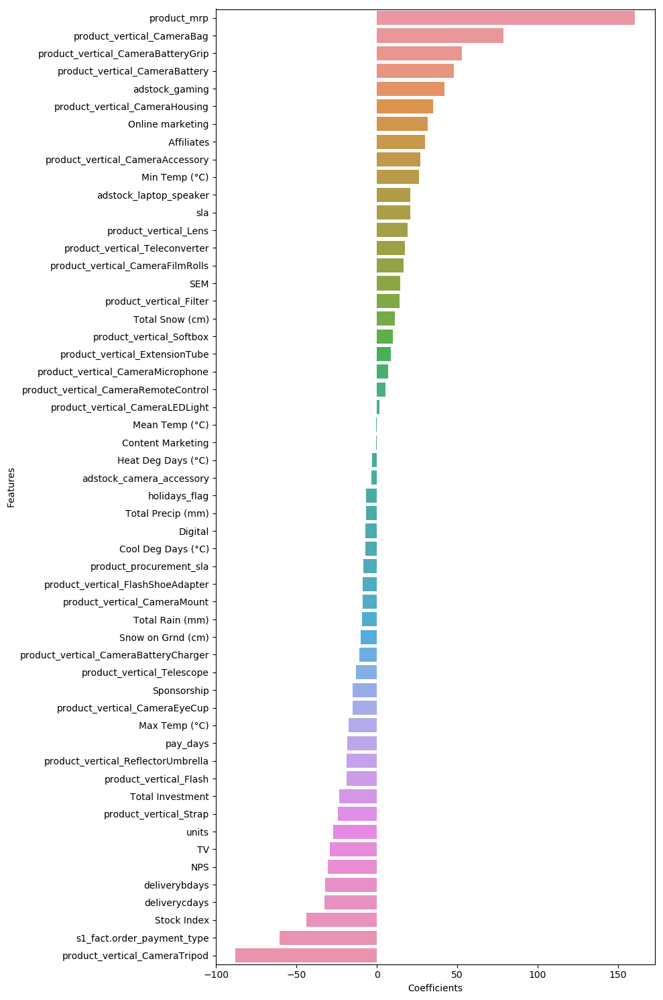

In [240]:
# Plotting graph
plt.figure(figsize=(10, 15), dpi=100, frameon='True')
sns.barplot(y='Features', x='Coefficients',data=camera_coeff, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()
plt.show()

** Building additive model on Gaming Dataset **

In [243]:
gamingaccessory_model = LinearRegression().fit(gaming_X_train, gaming_y_train)
gaming_y_pred = gamingaccessory_model.predict(gaming_X_test)

print('R2 Score: {}'.format(r2_score(gaming_y_test, gaming_y_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(gaming_y_test, gaming_y_pred)))

R2 Score: -159.9831657045682
Mean Squared Error: 4666678.821380788


- With simple linear regression we got R2 negative for gaming dataset which is not suitable to capture the results from the data

In [244]:
# Extracting coefficients
gaming_coeff = pd.DataFrame(list(zip(cols1,list(gamingaccessory_model.coef_)))).rename(columns= {0:'Features',1: 'Coefficients'})
gaming_coeff = gaming_coeff.sort_values(by=['Coefficients'], ascending = False)

**Top 5 features affecting GMV for Gaming accessories**

In [245]:
gaming_coeff.head()

,Features,Coefficients
15,adstock_camera_accessory,1331.476472
12,Online marketing,1074.669887
14,SEM,511.331803
44,product_vertical_ExtensionTube,493.109417
29,NPS,482.248699


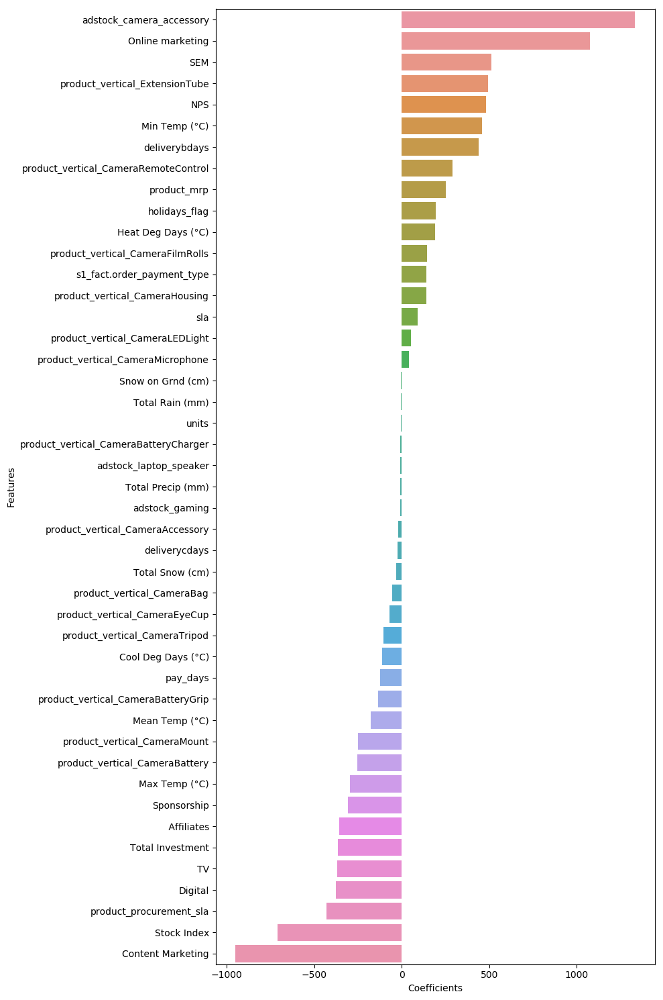

In [246]:
# Plotting graph
plt.figure(figsize=(10, 15), dpi=100, frameon='True')
sns.barplot(y='Features', x='Coefficients',data=gaming_coeff, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()
plt.show()

**Building additive model on Home Audio accessories **

In [247]:
homeaudioaccessory_model = LinearRegression().fit(homeaudio_X_train, homeaudio_y_train)
homeaudio_y_pred = homeaudioaccessory_model.predict(homeaudio_X_test)

print('R2 Score: {}'.format(r2_score(homeaudio_y_test, homeaudio_y_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(homeaudio_y_test, homeaudio_y_pred)))

R2 Score: -4.6738465110174525
Mean Squared Error: 39930.97705065994


- We got R2 negative for Home audio dataset as well, So Simple Linear Regression is not working here as well

In [248]:
# Extracting coefficients
homeaudio_coeff = pd.DataFrame(list(zip(cols1,list(homeaudioaccessory_model.coef_)))).rename(columns= {0:'Features',1: 'Coefficients'})
homeaudio_coeff = homeaudio_coeff.sort_values(by=['Coefficients'], ascending = False)

**Top 5 features affecting Homeaudio accessories**

In [249]:
homeaudio_coeff.head()

,Features,Coefficients
21,Min Temp (°C),271.647512
33,product_vertical_CameraBattery,194.659464
20,Max Temp (°C),178.762371
40,product_vertical_CameraMicrophone,170.015540
36,product_vertical_CameraEyeCup,155.094913


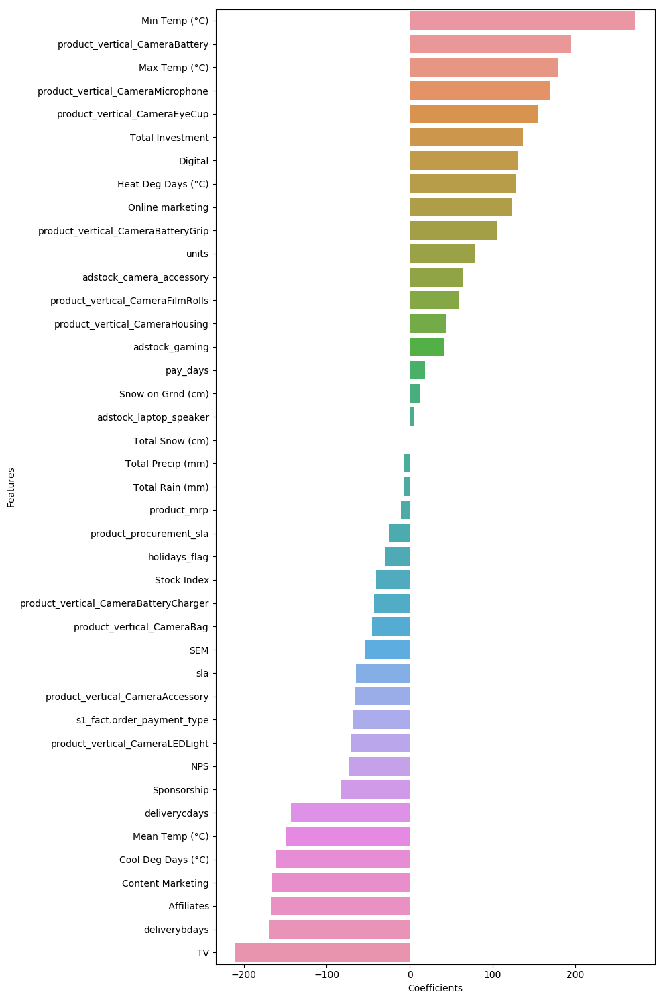

In [250]:
# Plotting graph
plt.figure(figsize=(10, 15), dpi=100, frameon='True')
sns.barplot(y='Features', x='Coefficients',data=homeaudio_coeff, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()
plt.show()

### Building Multiplicative Model 

- The Linear Regression Model that we built earlier is an additive model that has been an implicit assumption that the different KPIs affect the revenue additively.

- Y = α + β1X1 + β2X2 + β3X3 + β4X4 + β5X5 + ϵ

- However when there are interactions between the KPIs, we go for a multiplicative model.

- To fit a multiplicative model, take logarithms of the data(on both sides of the model), then analyse the log data as before.

- Y = e^α .X1^β1 . X2^β2 . X3^β3 . X4^β4 . X5^β5 + ϵ

- lnY = α + β1ln(X1) + β2ln(X2) + β3ln(X3) + β4ln(X4) + β5ln(X5) + ϵ'

In [251]:
# Taking copy of dataframes from the original dataframes
cameraaccessory_mul_df = camera.copy()
gamingaccessory_mul_df = gaming.copy()
homeaudio_mul_df = homeaudio.copy()

In [252]:
cameraaccessory_mul_df.head()

,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,product_mrp,product_procurement_sla,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,adstock_camera_accessory,adstock_gaming,adstock_laptop_speaker,pay_days,holidays_flag,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),NPS,Stock Index,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraLEDLight,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope
week_number,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,962.074839,1.023873,0.000000,0.000000,0.809397,5.934824,1772.414172,2.881394,74.196,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.20000,0.787864,10.978516,6.593653e+06,0.000000,0.000000,16.237401,5.697423,11.499602,6.500398,0.0,2.234786,0.672414,2.907200,0.000000,47.0930,1052.0,0.009094,0.053050,0.109890,0.049451,0.000568,0.000568,0.005873,0.0,0.000189,0.00000,0.005684,0.016673,0.147025,0.000379,0.039977,0.383100,0.0,0.120121,0.0,0.0,0.004926,0.0,0.005873
2,1143.933543,1.019623,0.002616,0.002878,0.784929,6.630822,2037.649398,2.663004,74.196,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.20000,0.787864,10.978516,6.593653e+06,0.126897,0.000000,12.188645,2.458791,7.773548,10.226452,0.0,0.964417,0.000000,0.964417,4.276033,47.0930,1052.0,0.012559,0.069074,0.122449,0.060178,0.001832,0.000523,0.010466,0.0,0.000000,0.00000,0.005495,0.019885,0.151491,0.000523,0.057038,0.287023,0.0,0.133176,0.0,0.0,0.009419,0.0,0.007064
3,1355.656920,1.023587,0.000780,0.000975,0.744444,6.426511,2302.196686,2.695712,74.196,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.20000,0.787864,10.978516,6.593653e+06,0.000000,0.591813,15.553411,10.000000,16.000000,2.000000,0.0,0.000000,0.000000,0.000000,0.000000,47.0930,1052.0,0.008577,0.057505,0.118324,0.059064,0.002534,0.000195,0.008967,0.0,0.000000,0.00039,0.006628,0.016764,0.084016,0.000585,0.052242,0.363158,0.0,0.160429,0.0,0.0,0.007797,0.0,0.007212
4,1425.284386,1.021139,0.000000,0.000000,0.787768,6.705750,2364.186020,2.648816,74.196,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.20000,0.787864,10.978516,6.593653e+06,0.000000,0.000000,16.232948,7.654453,13.802593,4.197407,0.0,0.000000,0.000000,0.000000,0.000000,47.0930,1052.0,0.014938,0.091319,0.175310,0.063416,0.002818,0.000000,0.008455,0.0,0.000282,0.00000,0.009301,0.018320,0.105411,0.001127,0.058343,0.177847,0.0,0.175874,0.0,0.0,0.009019,0.0,0.010710
5,988.191552,1.025895,0.005142,0.005877,0.793939,6.381818,1879.404591,2.728742,48.052,2.586008,1.912651,11.725555,0.596771,19.892366,6.465019,4.87363,1.991437,9.173117,1.153889e+08,0.104316,0.229017,13.242975,4.716804,10.073003,7.926997,0.0,1.317135,0.000000,1.317135,0.000000,50.3274,1222.0,0.008632,0.062810,0.173003,0.046097,0.000918,0.000184,0.006795,0.0,0.000000,0.00000,0.009183,0.014141,0.103765,0.000735,0.045914,0.349128,0.0,0.108540,0.0,0.0,0.006795,0.0,0.007897


### Applying logarithm on Independent and Dependent variables
- After taking log, all 0 values will be transformed to inf. So, retransforming those values to 0.

In [253]:
cameraaccessory_mul_df = cameraaccessory_mul_df.applymap(lambda x: np.log(x))
cameraaccessory_mul_df = cameraaccessory_mul_df.replace([np.inf, -np.inf], 0)
cameraaccessory_mul_df = cameraaccessory_mul_df.replace(np.nan, 0)

gamingaccessory_mul_df = gamingaccessory_mul_df.applymap(lambda x: np.log(x))
gamingaccessory_mul_df = gamingaccessory_mul_df.replace([np.inf, -np.inf], 0)
gamingaccessory_mul_df = gamingaccessory_mul_df.replace(np.nan, 0)

homeaudio_mul_df = homeaudio_mul_df.applymap(lambda x: np.log(x))
homeaudio_mul_df = homeaudio_mul_df.replace([np.inf, -np.inf], 0)
homeaudio_mul_df = homeaudio_mul_df.replace(np.nan, 0)

In [254]:
cameraaccessory_mul_df.head()

,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,product_mrp,product_procurement_sla,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,adstock_camera_accessory,adstock_gaming,adstock_laptop_speaker,pay_days,holidays_flag,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),NPS,Stock Index,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraLEDLight,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope
week_number,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,6.869092,0.023592,0.000000,0.000000,-0.211465,1.780837,7.480098,1.058274,4.306710,1.477049,-0.785262,1.435085,-0.105361,3.131137,1.997418,1.435085,-0.238430,2.395940,15.701618,0.000000,0.000000,2.787317,1.740014,2.442312,1.871863,0.0,0.804145,-0.396881,1.067190,0.000000,3.852124,6.958448,-4.700102,-2.936513,-2.208274,-3.006782,-7.472690,-7.472690,-5.137315,0.0,-8.571303,0.000000,-5.170105,-4.093966,-1.917150,-7.878155,-3.219444,-0.959460,0.0,-2.119254,0.0,0.0,-5.313206,0.0,-5.137315
2,7.042228,0.019433,-5.945944,-5.850634,-0.242162,1.891729,7.619552,0.979455,4.306710,1.477049,-0.785262,1.435085,-0.105361,3.131137,1.997418,1.435085,-0.238430,2.395940,15.701618,-2.064380,0.000000,2.500505,0.899670,2.050727,2.324978,0.0,-0.036232,0.000000,-0.036232,1.453026,3.852124,6.958448,-4.377328,-2.672580,-2.100061,-2.810450,-6.302619,-7.555382,-4.559650,0.0,0.000000,0.000000,-5.204007,-3.917796,-1.887227,-7.555382,-2.864034,-1.248195,0.0,-2.016081,0.0,0.0,-4.665010,0.0,-4.952692
3,7.212041,0.023313,-7.156567,-6.933423,-0.295117,1.860432,7.741619,0.991662,4.306710,1.477049,-0.785262,1.435085,-0.105361,3.131137,1.997418,1.435085,-0.238430,2.395940,15.701618,0.000000,-0.524565,2.744280,2.302585,2.772589,0.693147,0.0,0.000000,0.000000,0.000000,0.000000,3.852124,6.958448,-4.758671,-2.855886,-2.134332,-2.829128,-5.977912,-8.542861,-4.714220,0.0,0.000000,-7.849714,-5.016500,-4.088514,-2.476753,-7.444249,-2.951874,-1.012918,0.0,-1.829905,0.0,0.0,-4.853981,0.0,-4.931943
4,7.262127,0.020918,0.000000,0.000000,-0.238552,1.902965,7.768189,0.974113,4.306710,1.477049,-0.785262,1.435085,-0.105361,3.131137,1.997418,1.435085,-0.238430,2.395940,15.701618,0.000000,0.000000,2.787043,2.035288,2.624856,1.434467,0.0,0.000000,0.000000,0.000000,0.000000,3.852124,6.958448,-4.203847,-2.393396,-1.741199,-2.758039,-5.871554,0.000000,-4.772942,0.0,-8.174139,0.000000,-4.677632,-3.999752,-2.249884,-6.787845,-2.841421,-1.726833,0.0,-1.737989,0.0,0.0,-4.708403,0.0,-4.536553
5,6.895877,0.025566,-5.270249,-5.136717,-0.230748,1.853453,7.538710,1.003841,3.872284,0.950115,0.648490,2.461771,-0.516222,2.990336,1.866406,1.583839,0.688857,2.216277,18.563819,-2.260332,-1.473957,2.583467,1.551132,2.309859,2.070274,0.0,0.275459,0.000000,0.275459,0.000000,3.918550,7.108244,-4.752305,-2.767642,-1.754448,-3.077000,-6.993015,-8.602453,-4.991535,0.0,0.000000,0.000000,-4.690430,-4.258648,-2.265627,-7.216159,-3.080992,-1.052318,0.0,-2.220637,0.0,0.0,-4.991535,0.0,-4.841253


In [256]:
# Scaling variables to bring them to the same scale

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

cameraaccessory_mul_df[cameraaccessory_mul_df.columns]=scaler.fit_transform(cameraaccessory_mul_df[cameraaccessory_mul_df.columns])
gamingaccessory_mul_df[gamingaccessory_mul_df.columns]=scaler.fit_transform(gamingaccessory_mul_df[gamingaccessory_mul_df.columns])
homeaudio_mul_df[homeaudio_mul_df.columns]=scaler.fit_transform(homeaudio_mul_df[homeaudio_mul_df.columns])

In [257]:
# Splitting Train and test datasets
cameraaccessory_mul_train, cameraaccessory_mul_test = train_test_split(cameraaccessory_mul_df, 
                                                                test_size = 0.3, random_state = 43)

gamingaccessory_mul_train, gamingaccessory_mul_test = train_test_split(gamingaccessory_mul_df,
                                                                test_size = 0.3, random_state = 43)

homeaudio_mul_train, homeaudio_mul_test = train_test_split(homeaudio_mul_df, 
                                                               test_size = 0.3, random_state = 43)

In [258]:
# Separating independent and dependent variables
y_cameraaccessory_mul_train = cameraaccessory_mul_train.pop('gmv')
X_cameraaccessory_mul_train = cameraaccessory_mul_train

y_gamingaccessory_mul_train = gamingaccessory_mul_train.pop('gmv')
X_gamingaccessory_mul_train = gamingaccessory_mul_train

y_homeaudio_mul_train = homeaudio_mul_train.pop('gmv')
X_homeaudio_mul_train = homeaudio_mul_train

In [259]:
y_cameraaccessory_mul_test = cameraaccessory_mul_test.pop('gmv')
X_cameraaccessory_mul_test = cameraaccessory_mul_test

y_gamingaccessory_mul_test = gamingaccessory_mul_test.pop('gmv')
X_gamingaccessory_mul_test = gamingaccessory_mul_test

y_homeaudio_mul_test = homeaudio_mul_test.pop('gmv')
X_homeaudio_mul_test = homeaudio_mul_test

### Building Linear Regression for Multiplicative model of Camera Accessories

In [260]:
cameraaccessory_mul_model = LinearRegression().fit(X_cameraaccessory_mul_train, y_cameraaccessory_mul_train)
y_cameraaccessory_mul_test_pred = cameraaccessory_mul_model.predict(X_cameraaccessory_mul_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_mul_test, y_cameraaccessory_mul_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_mul_test, y_cameraaccessory_mul_test_pred)))

R2 Score: 0.5551707369435561
Mean Squared Error: 0.7265490524525922


In [261]:
# Extracting coefficients
cameraaccessory_mul_model_coeff = pd.DataFrame(list(zip(X_cameraaccessory_mul_test.columns,list(cameraaccessory_mul_model.coef_)))).rename(columns= {0:'Features',1: 'Coefficients'})
cameraaccessory_mul_model_coeff = cameraaccessory_mul_model_coeff.sort_values(by=['Coefficients'], ascending = False)

** Top 5 features affecting GMV from Multiplicative Model **

In [262]:
cameraaccessory_mul_model_coeff.head()

,Features,Coefficients
5,product_mrp,0.625290
32,product_vertical_CameraBag,0.197837
6,product_procurement_sla,0.156837
37,product_vertical_CameraFilmRolls,0.151113
41,product_vertical_CameraMount,0.128995


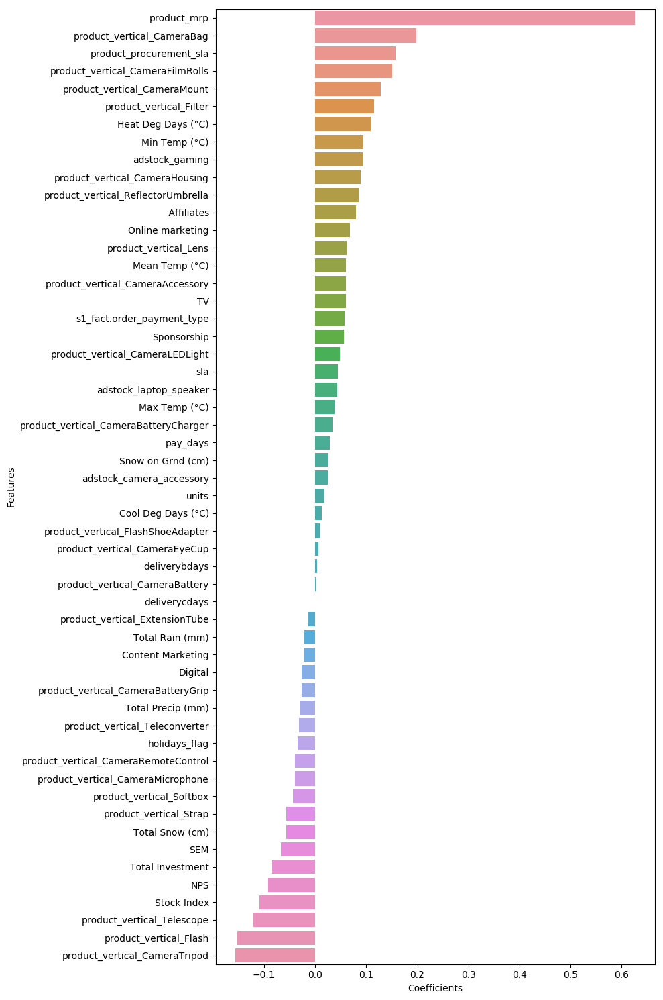

In [263]:
# Plotting graph
plt.figure(figsize=(10, 15), dpi=100, frameon='True')
sns.barplot(y='Features', x='Coefficients',data=cameraaccessory_mul_model_coeff, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()
plt.show()

### Building Linear Regression for Multiplicative model of Gaming Accessories

In [264]:
gamingaccessory_mul_model = LinearRegression().fit(X_gamingaccessory_mul_train, y_gamingaccessory_mul_train)
y_gamingaccessory_mul_test_pred = gamingaccessory_mul_model.predict(X_gamingaccessory_mul_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_mul_test, y_gamingaccessory_mul_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_mul_test, y_gamingaccessory_mul_test_pred)))

R2 Score: -0.5846045434635461
Mean Squared Error: 3.182059406969449


- We got R2 is a negative values which means Multiplicative modle is not suitable for Gaming Accessories dataset

In [265]:
# Extracting coefficients
gamingaccessory_mul_model_coeff = pd.DataFrame(list(zip(X_gamingaccessory_mul_test.columns,list(gamingaccessory_mul_model.coef_)))).rename(columns= {0:'Features',1: 'Coefficients'})
gamingaccessory_mul_model_coeff = gamingaccessory_mul_model_coeff.sort_values(by=['Coefficients'], ascending = False)

** Top 5 features affecting GMV **

In [266]:
gamingaccessory_mul_model_coeff.head()

,Features,Coefficients
8,TV,1.015019
23,Heat Deg Days (°C),1.007395
22,Mean Temp (°C),0.881165
5,product_mrp,0.873762
7,Total Investment,0.864147


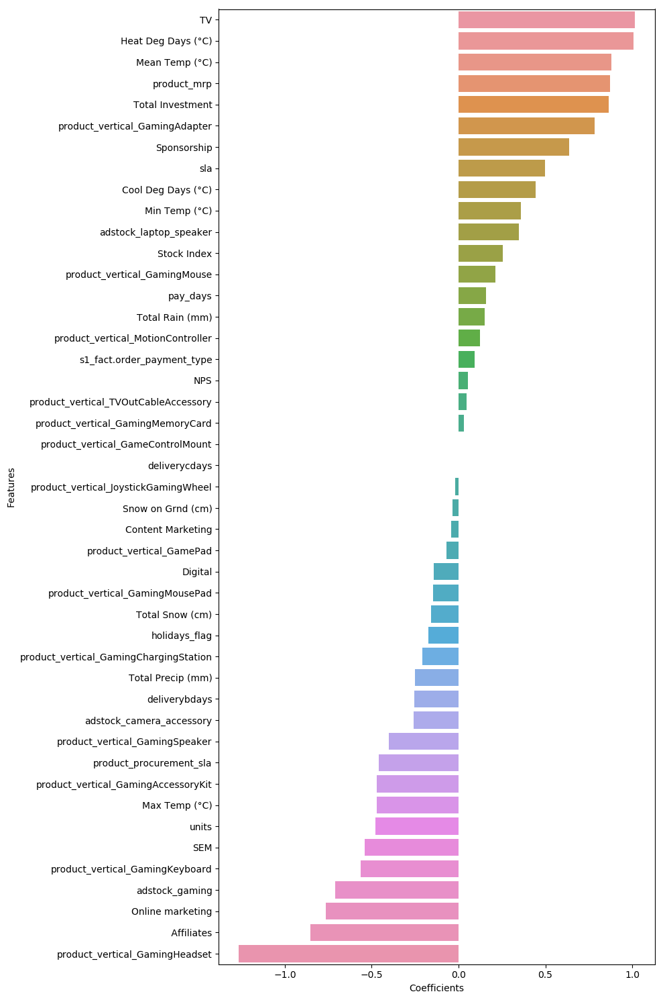

In [267]:
# Plotting graph to plot coefficients in descending order
plt.figure(figsize=(10, 15), dpi=100, frameon='True')
sns.barplot(y='Features', x='Coefficients',data=gamingaccessory_mul_model_coeff, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()
plt.show()

### Building Linear Regression for Multiplicative model of Home Audio Accessories

In [268]:
homeaudio_mul_model = LinearRegression().fit(X_homeaudio_mul_train, y_homeaudio_mul_train)
y_homeaudio_mul_test_pred = homeaudio_mul_model.predict(X_homeaudio_mul_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_mul_test, y_homeaudio_mul_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_mul_test, y_homeaudio_mul_test_pred)))

R2 Score: -3.485675798836181
Mean Squared Error: 1.7763784352079752


- We got R2 is a negative value which means it is not suitable for Home Audio accessories dataset

In [269]:
# Extracting coefficients
homeaudio_mul_model_coeff = pd.DataFrame(list(zip(X_homeaudio_mul_test.columns,list(homeaudio_mul_model.coef_)))).rename(columns= {0:'Features',1: 'Coefficients'})
homeaudio_mul_model_coeff = homeaudio_mul_model_coeff.sort_values(by=['Coefficients'], ascending = False)

** Top 5 features which are affecting GMV **

In [270]:
homeaudio_mul_model_coeff.head()

,Features,Coefficients
21,Min Temp (°C),0.869405
17,adstock_laptop_speaker,0.865539
11,Content Marketing,0.720400
7,Total Investment,0.679748
32,product_vertical_Dock,0.630942


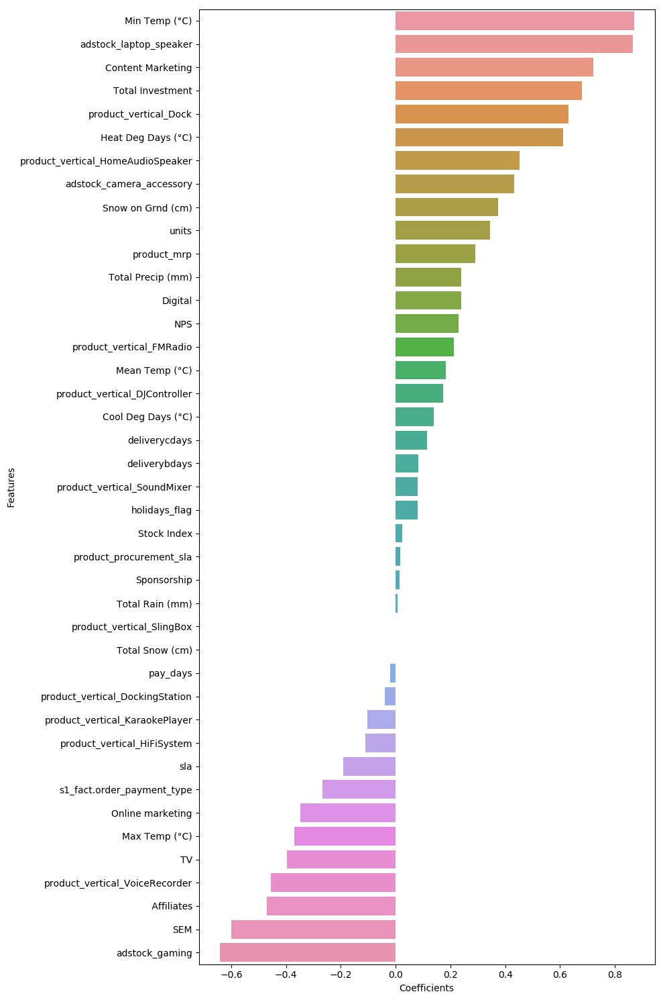

In [271]:
# Plotting graph to plot coefficients in descending order
plt.figure(figsize=(10, 15), dpi=100, frameon='True')
sns.barplot(y='Features', x='Coefficients',data=homeaudio_mul_model_coeff, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()
plt.show()

# Building Koyck Model
- The Additive and Multiplicative Linear Models that we have built till now can capture the current effect of the KPIs. However, if we want to capture the carry-over effect, we would want to model the current revenue figures based on the past figures of the KPIs.

- The Koyck tells us that the current revenue generated is not just influenced by the different independent attributes, but also because of the revenue generated over the last periods. ie. Current revenue(Yt) is also dependent on the past revenue values(Yt-1).

- **Yt = α + β1X1 + β2X2 + β3X3 + β4X4 + β5X5 + ϵ**

- **Yt = α + µYt-1 + β1X1 + β2X2 + β3X3 + β4X4 + β5X5 + ϵ -- (sale at time t is dependent on sale at time t-1)**

- If X1 is the advertising effect, β1 is the current effect of advertising, carry over effect of advertising is β1 µ/(1-µ).*

- Therefore the total effect of advertising = Current effect + Carry over effect

                                            = β1 + β1 * µ/(1-µ)    

                                            = β1/(1-µ)


In [284]:
# Taking copy of original dataframes
cameraaccessory_koyck_df = camera.copy()
gamingaccessory_koyck_df = gaming.copy()
homeaudio_koyck_df = homeaudio.copy()

**Creating new variable with lag of 1 week using dependent variable (GMV)**

In [285]:
#Creating function to find the lag of 1 week
def lag_variables(data,var,n):
    for i in var:
        loc_index = data.columns.get_loc(i) + 1
        data.insert(loc=loc_index,column= i+'_lag'+np.str(n),value=data[i].shift(n))
    return data

In [286]:
cameraaccessory_koyck_df = lag_variables(cameraaccessory_koyck_df,['gmv'],1) 
gamingaccessory_koyck_df = lag_variables(gamingaccessory_koyck_df,['gmv'],1) 
homeaudio_koyck_df = lag_variables(homeaudio_koyck_df,['gmv'],1) 

In [287]:
cameraaccessory_koyck_df.head()

,gmv,gmv_lag1,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,product_mrp,product_procurement_sla,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,adstock_camera_accessory,adstock_gaming,adstock_laptop_speaker,pay_days,holidays_flag,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),NPS,Stock Index,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraLEDLight,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope
week_number,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,962.074839,NaN,1.023873,0.000000,0.000000,0.809397,5.934824,1772.414172,2.881394,74.196,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.20000,0.787864,10.978516,6.593653e+06,0.000000,0.000000,16.237401,5.697423,11.499602,6.500398,0.0,2.234786,0.672414,2.907200,0.000000,47.0930,1052.0,0.009094,0.053050,0.109890,0.049451,0.000568,0.000568,0.005873,0.0,0.000189,0.00000,0.005684,0.016673,0.147025,0.000379,0.039977,0.383100,0.0,0.120121,0.0,0.0,0.004926,0.0,0.005873
2,1143.933543,962.074839,1.019623,0.002616,0.002878,0.784929,6.630822,2037.649398,2.663004,74.196,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.20000,0.787864,10.978516,6.593653e+06,0.126897,0.000000,12.188645,2.458791,7.773548,10.226452,0.0,0.964417,0.000000,0.964417,4.276033,47.0930,1052.0,0.012559,0.069074,0.122449,0.060178,0.001832,0.000523,0.010466,0.0,0.000000,0.00000,0.005495,0.019885,0.151491,0.000523,0.057038,0.287023,0.0,0.133176,0.0,0.0,0.009419,0.0,0.007064
3,1355.656920,1143.933543,1.023587,0.000780,0.000975,0.744444,6.426511,2302.196686,2.695712,74.196,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.20000,0.787864,10.978516,6.593653e+06,0.000000,0.591813,15.553411,10.000000,16.000000,2.000000,0.0,0.000000,0.000000,0.000000,0.000000,47.0930,1052.0,0.008577,0.057505,0.118324,0.059064,0.002534,0.000195,0.008967,0.0,0.000000,0.00039,0.006628,0.016764,0.084016,0.000585,0.052242,0.363158,0.0,0.160429,0.0,0.0,0.007797,0.0,0.007212
4,1425.284386,1355.656920,1.021139,0.000000,0.000000,0.787768,6.705750,2364.186020,2.648816,74.196,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.20000,0.787864,10.978516,6.593653e+06,0.000000,0.000000,16.232948,7.654453,13.802593,4.197407,0.0,0.000000,0.000000,0.000000,0.000000,47.0930,1052.0,0.014938,0.091319,0.175310,0.063416,0.002818,0.000000,0.008455,0.0,0.000282,0.00000,0.009301,0.018320,0.105411,0.001127,0.058343,0.177847,0.0,0.175874,0.0,0.0,0.009019,0.0,0.010710
5,988.191552,1425.284386,1.025895,0.005142,0.005877,0.793939,6.381818,1879.404591,2.728742,48.052,2.586008,1.912651,11.725555,0.596771,19.892366,6.465019,4.87363,1.991437,9.173117,1.153889e+08,0.104316,0.229017,13.242975,4.716804,10.073003,7.926997,0.0,1.317135,0.000000,1.317135,0.000000,50.3274,1222.0,0.008632,0.062810,0.173003,0.046097,0.000918,0.000184,0.006795,0.0,0.000000,0.00000,0.009183,0.014141,0.103765,0.000735,0.045914,0.349128,0.0,0.108540,0.0,0.0,0.006795,0.0,0.007897


In [288]:
# Filling null values with 0
cameraaccessory_koyck_df = cameraaccessory_koyck_df.fillna(value=0)
gamingaccessory_koyck_df = gamingaccessory_koyck_df.fillna(value=0)
homeaudio_koyck_df = homeaudio_koyck_df.fillna(value=0)

In [289]:
# Scaling variables

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

cameraaccessory_koyck_df[cameraaccessory_koyck_df.columns]=scaler.fit_transform(cameraaccessory_koyck_df[cameraaccessory_koyck_df.columns])
gamingaccessory_koyck_df[gamingaccessory_koyck_df.columns]=scaler.fit_transform(gamingaccessory_koyck_df[gamingaccessory_koyck_df.columns])
homeaudio_koyck_df[homeaudio_koyck_df.columns]=scaler.fit_transform(homeaudio_koyck_df[homeaudio_koyck_df.columns])

In [290]:
#Splitting train and test sets
cameraaccessory_train, cameraaccessory_test = train_test_split(cameraaccessory_koyck_df,test_size = 0.3, random_state = 34)

gamingaccessory_train, gamingaccessory_test = train_test_split(gamingaccessory_koyck_df,test_size = 0.3, random_state = 34)

homeaudio_train, homeaudio_test = train_test_split(homeaudio_koyck_df, test_size = 0.3, random_state = 34)

In [291]:
#Separating independent and dependent variables
#Train set
y_cameraaccessory_train = cameraaccessory_train.pop('gmv')
X_cameraaccessory_train = cameraaccessory_train

y_gamingaccessory_train = gamingaccessory_train.pop('gmv')
X_gamingaccessory_train = gamingaccessory_train

y_homeaudio_train = homeaudio_train.pop('gmv')
X_homeaudio_train = homeaudio_train

# Test set
y_cameraaccessory_test = cameraaccessory_test.pop('gmv')
X_cameraaccessory_test = cameraaccessory_test

y_gamingaccessory_test = gamingaccessory_test.pop('gmv')
X_gamingaccessory_test = gamingaccessory_test

y_homeaudio_test = homeaudio_test.pop('gmv')
X_homeaudio_test = homeaudio_test

In [292]:
X_cameraaccessory_train.head()

,gmv_lag1,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,product_mrp,product_procurement_sla,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,adstock_camera_accessory,adstock_gaming,adstock_laptop_speaker,pay_days,holidays_flag,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),NPS,Stock Index,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraLEDLight,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope
week_number,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
23,-0.641171,0.477694,1.832637,1.829860,0.601077,-0.521007,-0.814176,-0.806465,-0.703646,-0.829783,-0.347693,-0.245536,-0.717017,-1.067753,-1.017679,-0.536266,-0.406969,-0.186578,3.231029,-0.495938,-0.545531,1.299407,0.894954,1.121996,-0.991204,1.086823,-0.635723,-0.359681,-0.682241,-0.277564,0.302699,0.465804,-0.379145,-0.249960,-0.740730,-0.162207,-0.731575,2.515823,2.177388,1.702204,-0.241401,-0.548164,-1.505163,-0.748428,-0.879087,-0.440750,-0.598385,1.782666,-0.187988,-0.036992,-0.182253,0.861319,-0.227721,-0.140028,1.439792
48,0.566647,-0.078141,-0.617911,-0.616614,0.422419,0.313258,1.421949,0.734176,-0.496743,0.194689,-0.396760,-0.696523,-0.574033,0.421150,0.608339,-0.329066,-0.051878,0.214565,-0.342277,-0.495938,-0.545531,-0.559661,0.011283,0.008308,-0.294398,-0.591874,0.089339,-0.359681,0.033691,-0.277564,-0.619336,0.970078,-0.643256,0.472658,0.600657,0.245739,2.490746,-0.697100,-0.507208,-0.426504,-0.241401,-0.548164,0.051346,0.820657,-0.082434,0.638956,1.037720,-0.838215,-0.187988,0.106720,-0.182253,-0.431568,0.030880,-0.140028,-0.969415
36,-2.237675,2.004424,-0.618482,-0.617268,0.113619,0.432988,0.359104,0.523019,0.607377,0.052817,-0.369475,1.310643,-0.065303,0.005377,-0.060419,-0.194191,-0.406643,-1.001048,-0.342277,0.576181,-0.545531,1.803451,1.566641,1.515259,-1.027844,2.117255,3.823083,-0.359681,3.720416,-0.277564,-0.627310,-0.732105,0.753827,0.564442,1.074718,-0.217304,0.443337,-0.697100,-0.541964,-0.426504,-0.241401,-0.548164,0.715435,1.402987,0.078124,-0.892795,0.487339,-0.964970,-0.187988,-0.122814,-0.182253,-0.431568,-0.808665,-0.140028,1.289659
3,0.057785,-0.177506,-0.617999,-0.616750,0.316259,0.258794,0.446126,0.058172,0.070496,0.258519,-0.673500,-1.110013,0.272357,0.850009,0.937231,-0.471523,-0.652162,0.585911,-0.342274,-0.495938,1.741262,-0.798915,0.214353,0.258879,-0.631897,-0.591874,-0.635723,-0.359681,-0.682241,-0.277564,-0.594953,-1.370273,-0.277459,-0.600047,-0.652163,-0.208308,0.562162,-0.352134,0.251003,-0.426504,-0.241401,0.595972,0.788695,-0.727892,-0.597078,0.563264,0.115993,1.390769,-0.187988,-0.005460,-0.182253,-0.431568,0.290261,-0.140028,-0.012034
49,1.333795,-0.283536,-0.618482,-0.617268,0.390199,0.148152,1.472014,0.600778,0.667346,0.594992,0.116015,0.801271,0.309214,0.742137,0.691738,0.376337,0.169329,0.533582,-0.342276,0.629613,-0.545531,-0.578744,-0.268085,-0.219737,0.012761,-0.591874,-0.359946,-0.359681,-0.409936,-0.277564,-0.886537,-1.171245,0.281231,0.263791,0.237834,0.219197,0.559887,-0.697100,0.098879,-0.426504,-0.241401,-0.548164,0.215351,0.994467,0.171833,-0.892795,1.169716,-0.844651,-0.187988,0.081458,-0.182253,-0.431568,0.216857,-0.140028,-0.349954


** Building Linear Regression for Camera Accessories kyocks data set **

In [294]:
cameraaccessory_model = LinearRegression().fit(X_cameraaccessory_train, y_cameraaccessory_train)
y_cameraaccessory_test_pred = cameraaccessory_model.predict(X_cameraaccessory_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_test, y_cameraaccessory_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_test, y_cameraaccessory_test_pred)))

R2 Score: 0.5531238781371359
Mean Squared Error: 0.15385832794981824


- With kyocks model with lag1 we got R2 of 0.55 for Camera Accessories

In [295]:
# Extracting coefficients
cameraaccessory_model_coeff = pd.DataFrame(list(zip(X_cameraaccessory_test.columns,list(cameraaccessory_model.coef_)))).rename(columns= {0:'Features',1: 'Coefficients'})
cameraaccessory_model_coeff = cameraaccessory_model_coeff.sort_values(by=['Coefficients'], ascending = False)

In [296]:
cameraaccessory_model_coeff.head()

,Features,Coefficients
6,product_mrp,0.628494
46,product_vertical_Filter,0.235522
51,product_vertical_Softbox,0.198488
34,product_vertical_CameraBattery,0.194450
33,product_vertical_CameraBag,0.179945


### Finding Total effect of KPI from the kyock's model
**Equation for Koyck Model:**

**Yt = α + µYt-1 + β1X1 + β2X2 + β3X3 + β4X4 + β5X5 + ϵ -- (sale at time t is dependent on sale at time t-1)**

If X1 is the advertising effect, β1 is the current effect of advertising, carry over effect of advertising is β1 µ/(1-µ)

Therefore the total effect of advertising = Current effect + Carry over effect

                                        = β1 + β1 * µ/(1-µ)    

                                        = β1/(1-µ)

In [297]:
# Extracting coefficient of lag variable
cameraaccessory_model_coeff.loc[cameraaccessory_model_coeff['Features'] == 'gmv_lag1'].Coefficients

0    0.019215
Name: Coefficients, dtype: float64

In [298]:
# Deriving Total Effect variable from lag variable
cameraaccessory_model_coeff['Total Effect'] = cameraaccessory_model_coeff['Coefficients']/(1-(0.019215))

** Top 5 variables which are affecting GMV **

In [299]:
cameraaccessory_model_coeff.head()

,Features,Coefficients,Total Effect
6,product_mrp,0.628494,0.640807
46,product_vertical_Filter,0.235522,0.240136
51,product_vertical_Softbox,0.198488,0.202377
34,product_vertical_CameraBattery,0.194450,0.198259
33,product_vertical_CameraBag,0.179945,0.183471


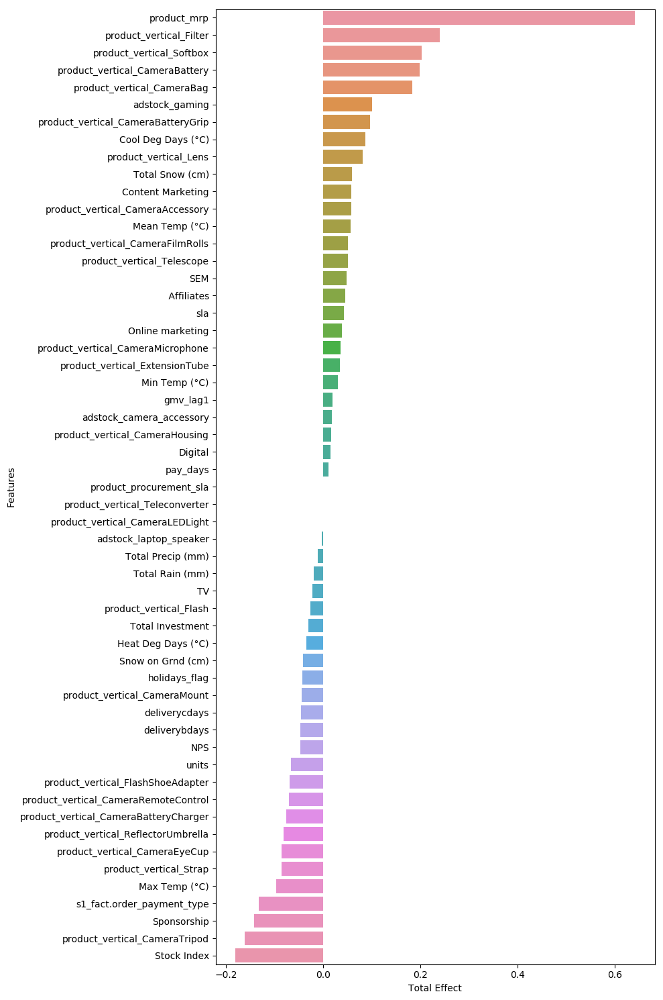

In [300]:
# Plotting Total Effect in the descending order of their importance
plt.figure(figsize=(10, 15), dpi=100, frameon='True')
sns.barplot(y='Features', x='Total Effect',data=cameraaccessory_model_coeff, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()
plt.show()

**Building Linear Regression for Gaming Accessories kyocks data set**

In [301]:
gamingaccessory_model = LinearRegression().fit(X_gamingaccessory_train, y_gamingaccessory_train)
y_gamingaccessory_test_pred = gamingaccessory_model.predict(X_gamingaccessory_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_test, y_gamingaccessory_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_test, y_gamingaccessory_test_pred)))

R2 Score: -51.519885636926226
Mean Squared Error: 30.434762859499838


- We got negative R2 for the Gaming Dataset. So Gaming dataset is not suitable for kyocks model

In [302]:
# Extracting coefficients
gamingaccessory_model_coeff = pd.DataFrame(list(zip(X_gamingaccessory_test.columns,list(gamingaccessory_model.coef_)))).rename(columns= {0:'Features',1: 'Coefficients'})
gamingaccessory_model_coeff = gamingaccessory_model_coeff.sort_values(by=['Coefficients'], ascending = False)

### Finding Total effect of KPI from the kyock's model
**Equation for Koyck Model:**

**Yt = α + µYt-1 + β1X1 + β2X2 + β3X3 + β4X4 + β5X5 + ϵ -- (sale at time t is dependent on sale at time t-1)**

If X1 is the advertising effect, β1 is the current effect of advertising, carry over effect of advertising is β1 µ/(1-µ)

Therefore the total effect of advertising = Current effect + Carry over effect

                                        = β1 + β1 * µ/(1-µ)    

                                        = β1/(1-µ)

In [303]:
# Extracting coefficient of lag variable
gamingaccessory_model_coeff.loc[gamingaccessory_model_coeff['Features'] == 'gmv_lag1'].Coefficients

0   -0.154996
Name: Coefficients, dtype: float64

In [304]:
# Deriving Total Effect variable from lag variable
gamingaccessory_model_coeff['Total Effect'] = gamingaccessory_model_coeff['Coefficients']/(1-(-0.154996))

**Top 5 variables which are affecting GMV**

In [305]:
gamingaccessory_model_coeff.head()

,Features,Coefficients,Total Effect
16,adstock_camera_accessory,2.963196,2.565546
29,Snow on Grnd (cm),2.570403,2.225465
14,Affiliates,2.468022,2.136823
2,deliverybdays,2.341440,2.027228
9,TV,2.208646,1.912255


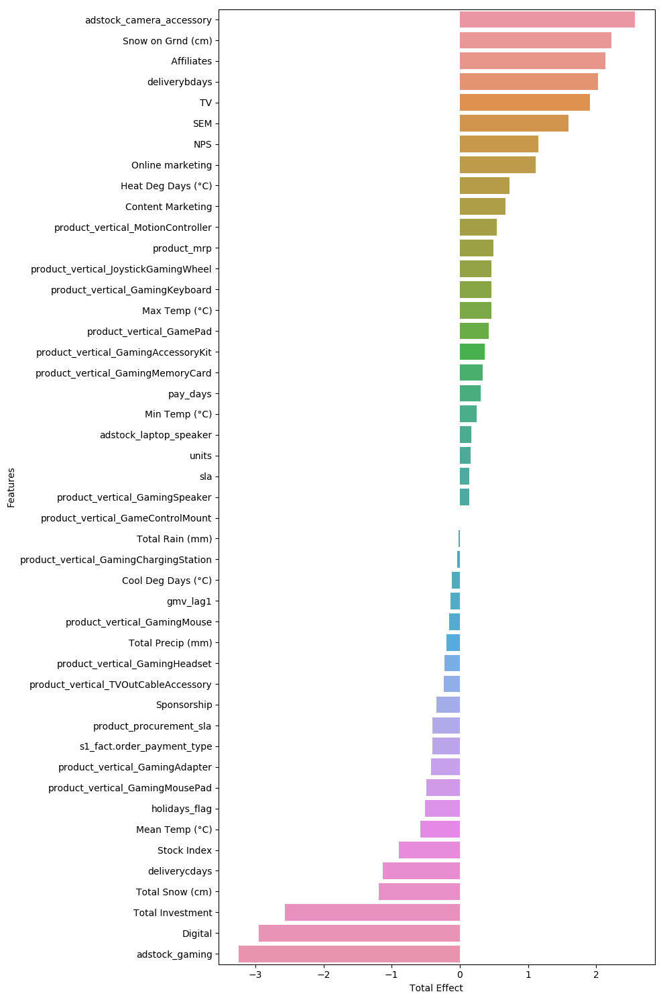

In [306]:
# Plotting Total Effect in the descending order of their importance
plt.figure(figsize=(10, 15), dpi=100, frameon='True')
sns.barplot(y='Features', x='Total Effect',data=gamingaccessory_model_coeff, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()
plt.show()

**Building Linear Regression for homeaudio Accessories kyocks data set **

In [308]:
homeaudio_model = LinearRegression().fit(X_homeaudio_train, y_homeaudio_train)
y_homeaudio_test_pred = homeaudio_model.predict(X_homeaudio_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_test, y_homeaudio_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_test, y_homeaudio_test_pred)))

R2 Score: -9.880546721479313
Mean Squared Error: 2.7924527486136603


- We got negative R2 which is saying that this data is not suitable for kyocks model

In [309]:
# Extracting coefficients
homeaudio_model_coeff = pd.DataFrame(list(zip(X_homeaudio_test.columns,list(homeaudio_model.coef_)))).rename(columns= {0:'Features',1: 'Coefficients'})
homeaudio_model_coeff = homeaudio_model_coeff.sort_values(by=['Coefficients'], ascending = False)

### Finding Total effect of KPI from the kyock's model
**Equation for Koyck Model:**

**Yt = α + µYt-1 + β1X1 + β2X2 + β3X3 + β4X4 + β5X5 + ϵ -- (sale at time t is dependent on sale at time t-1)**

If X1 is the advertising effect, β1 is the current effect of advertising, carry over effect of advertising is β1 µ/(1-µ)

Therefore the total effect of advertising = Current effect + Carry over effect

                                        = β1 + β1 * µ/(1-µ)    

                                        = β1/(1-µ)

In [310]:
# Extracting coefficient of lag variable
homeaudio_model_coeff.loc[homeaudio_model_coeff['Features'] == 'gmv_lag1'].Coefficients

0   -0.000743
Name: Coefficients, dtype: float64

In [311]:
# Deriving Total Effect variable from lag variable
homeaudio_model_coeff['Total Effect'] = homeaudio_model_coeff['Coefficients']/(1-(-0.000743))

** Top 5 features which are affecting gmv **

In [312]:
homeaudio_model_coeff.head()

,Features,Coefficients,Total Effect
29,Snow on Grnd (cm),0.824167,0.823555
41,product_vertical_VoiceRecorder,0.655896,0.655409
37,product_vertical_HomeAudioSpeaker,0.614607,0.614151
21,Max Temp (°C),0.576091,0.575663
22,Min Temp (°C),0.566938,0.566517


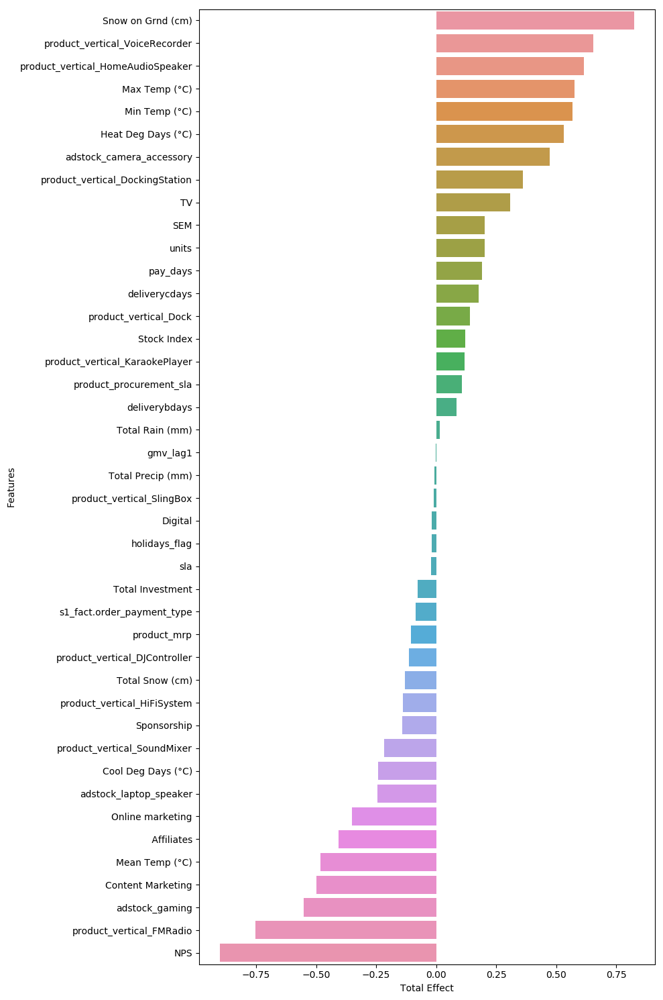

In [313]:
# Plotting Total Effect in the descending order of their importance
plt.figure(figsize=(10, 15), dpi=100, frameon='True')
sns.barplot(y='Features', x='Total Effect',data=homeaudio_model_coeff, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()
plt.show()

## Distributive Lag Model(Additive)
The Additive and Multiplicative Linear Models that we have built till now can capture the current effect of the KPIs. However, if we want to capture the carry-over effect, we would want to model the current revenue figures based on the past figures of the KPIs.

In the distributed lag model, not only is the dependent variable entered in its lagged version, but the independent variables are as well. This is a more generalist model and captures the carry-over effect of all the variables. Thus, the Koyck model is a special type of distributed lag model, which includes the lag value of only the dependent variable.

Yt = α+ µ1Yt-1 + µ2Yt-2 + µ3Yt-3 + ....

    + β1X1t + β1X1t-1 + β1X1t-2 + ....

    + β2X2t + β2X2t-1 + β2X2t-2 + ....

    + β3X3t + β3X3t-1 + β3X3t-2 + ....

    + β4X4t + β4X4t-1 + β4X4t-2 + ....

    + β5X5t + β5X5t-1 + β5X5t-2 + ....

    + ϵ

In [315]:
# Taking copy of original dataframes
cameraaccessory_dl_add_df = camera.copy()
gamingaccessory_dl_add_df = gaming.copy()
homeaudio_dl_add_df = homeaudio.copy()

### Creating 3 weeks, 2 weeks and 1 week Lag variables for all independent and dependent variables

**Creating 3 weeks lag of independent and dependent variables **

In [317]:
cameraaccessory_dl_add_df = lag_variables(cameraaccessory_dl_add_df,cameraaccessory_dl_add_df.columns,3)
gamingaccessory_dl_add_df = lag_variables(gamingaccessory_dl_add_df,gamingaccessory_dl_add_df.columns,3)
homeaudio_dl_add_df = lag_variables(homeaudio_dl_add_df,homeaudio_dl_add_df.columns,3)

In [318]:
cameraaccessory_dl_add_df.head()

,gmv,gmv_lag3,units,units_lag3,deliverybdays,deliverybdays_lag3,deliverycdays,deliverycdays_lag3,s1_fact.order_payment_type,s1_fact.order_payment_type_lag3,sla,sla_lag3,product_mrp,product_mrp_lag3,product_procurement_sla,product_procurement_sla_lag3,Total Investment,Total Investment_lag3,TV,TV_lag3,Digital,Digital_lag3,Sponsorship,Sponsorship_lag3,Content Marketing,Content Marketing_lag3,Online marketing,Online marketing_lag3,Affiliates,Affiliates_lag3,SEM,SEM_lag3,adstock_camera_accessory,adstock_camera_accessory_lag3,adstock_gaming,adstock_gaming_lag3,adstock_laptop_speaker,adstock_laptop_speaker_lag3,pay_days,pay_days_lag3,holidays_flag,holidays_flag_lag3,Max Temp (°C),Max Temp (°C)_lag3,Min Temp (°C),Min Temp (°C)_lag3,Mean Temp (°C),Mean Temp (°C)_lag3,Heat Deg Days (°C),Heat Deg Days (°C)_lag3,Cool Deg Days (°C),Cool Deg Days (°C)_lag3,Total Rain (mm),Total Rain (mm)_lag3,Total Snow (cm),Total Snow (cm)_lag3,Total Precip (mm),Total Precip (mm)_lag3,Snow on Grnd (cm),Snow on Grnd (cm)_lag3,NPS,NPS_lag3,Stock Index,Stock Index_lag3,product_vertical_CameraAccessory,product_vertical_CameraAccessory_lag3,product_vertical_CameraBag,product_vertical_CameraBag_lag3,product_vertical_CameraBattery,product_vertical_CameraBattery_lag3,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryCharger_lag3,product_vertical_CameraBatteryGrip,product_vertical_CameraBatteryGrip_lag3,product_vertical_CameraEyeCup,product_vertical_CameraEyeCup_lag3,product_vertical_CameraFilmRolls,product_vertical_CameraFilmRolls_lag3,product_vertical_CameraHousing,product_vertical_CameraHousing_lag3,product_vertical_CameraLEDLight,product_vertical_CameraLEDLight_lag3,product_vertical_CameraMicrophone,product_vertical_CameraMicrophone_lag3,product_vertical_CameraMount,product_vertical_CameraMount_lag3,product_vertical_CameraRemoteControl,product_vertical_CameraRemoteControl_lag3,product_vertical_CameraTripod,product_vertical_CameraTripod_lag3,product_vertical_ExtensionTube,product_vertical_ExtensionTube_lag3,product_vertical_Filter,product_vertical_Filter_lag3,product_vertical_Flash,product_vertical_Flash_lag3,product_vertical_FlashShoeAdapter,product_vertical_FlashShoeAdapter_lag3,product_vertical_Lens,product_vertical_Lens_lag3,product_vertical_ReflectorUmbrella,product_vertical_ReflectorUmbrella_lag3,product_vertical_Softbox,product_vertical_Softbox_lag3,product_vertical_Strap,product_vertical_Strap_lag3,product_vertical_Teleconverter,product_vertical_Teleconverter_lag3,product_vertical_Telescope,product_vertical_Telescope_lag3
week_number,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,962.074839,NaN,1.023873,NaN,0.000000,NaN,0.000000,NaN,0.809397,NaN,5.934824,NaN,1772.414172,NaN,2.881394,NaN,74.196,NaN,4.380000,NaN,0.456000,NaN,4.200000,NaN,0.900000,NaN,22.900000,NaN,7.370000,NaN,4.20000,NaN,0.787864,NaN,10.978516,NaN,6.593653e+06,NaN,0.000000,NaN,0.000000,NaN,16.237401,NaN,5.697423,NaN,11.499602,NaN,6.500398,NaN,0.0,NaN,2.234786,NaN,0.672414,NaN,2.907200,NaN,0.000000,NaN,47.0930,NaN,1052.0,NaN,0.009094,NaN,0.053050,NaN,0.109890,NaN,0.049451,NaN,0.000568,NaN,0.000568,NaN,0.005873,NaN,0.0,NaN,0.000189,NaN,0.00000,NaN,0.005684,NaN,0.016673,NaN,0.147025,NaN,0.000379,NaN,0.039977,NaN,0.383100,NaN,0.0,NaN,0.120121,NaN,0.0,NaN,0.0,NaN,0.004926,NaN,0.0,NaN,0.005873,NaN
2,1143.933543,NaN,1.019623,NaN,0.002616,NaN,0.002878,NaN,0.784929,NaN,6.630822,NaN,2037.649398,NaN,2.663004,NaN,74.196,NaN,4.380000,NaN,0.456000,NaN,4.200000,NaN,0.900000,NaN,22.900000,NaN,7.370000,NaN,4.20000,NaN,0.787864,NaN,10.978516,NaN,6.593653e+06,NaN,0.126897,NaN,0.000000,NaN,12.188645,NaN,2.458791,NaN,7.773548,NaN,10.226452,NaN,0.0,NaN,0.964417,NaN,0.000000,NaN,0.964417,NaN,4.276033,NaN,47.0930,NaN,1052.0,NaN,0.012559,NaN,0.069074,NaN,0.122449,NaN,0.060178,NaN,0.001832,NaN,0.000523,NaN,0.010466,NaN,0.0,NaN,0.000000,NaN,0.00000,NaN,0.005495,NaN,0.019885,NaN,0.151491,NaN,0.000523,NaN,0.057038,NaN,0.287023,NaN,0.0,

**Creating 2 weeks lag of independent and dependent variables **

In [320]:
cameraaccessory_dl_add_df = lag_variables(cameraaccessory_dl_add_df,cameraaccessory_dl_add_df.columns,2)
gamingaccessory_dl_add_df = lag_variables(gamingaccessory_dl_add_df,gamingaccessory_dl_add_df.columns,2)
homeaudio_dl_add_df = lag_variables(homeaudio_dl_add_df,homeaudio_dl_add_df.columns,2)

In [321]:
cameraaccessory_dl_add_df.head()

,gmv,gmv_lag2,gmv_lag3,gmv_lag3_lag2,units,units_lag2,units_lag3,units_lag3_lag2,deliverybdays,deliverybdays_lag2,deliverybdays_lag3,deliverybdays_lag3_lag2,deliverycdays,deliverycdays_lag2,deliverycdays_lag3,deliverycdays_lag3_lag2,s1_fact.order_payment_type,s1_fact.order_payment_type_lag2,s1_fact.order_payment_type_lag3,s1_fact.order_payment_type_lag3_lag2,sla,sla_lag2,sla_lag3,sla_lag3_lag2,product_mrp,product_mrp_lag2,product_mrp_lag3,product_mrp_lag3_lag2,product_procurement_sla,product_procurement_sla_lag2,product_procurement_sla_lag3,product_procurement_sla_lag3_lag2,Total Investment,Total Investment_lag2,Total Investment_lag3,Total Investment_lag3_lag2,TV,TV_lag2,TV_lag3,TV_lag3_lag2,Digital,Digital_lag2,Digital_lag3,Digital_lag3_lag2,Sponsorship,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_lag3_lag2,Content Marketing,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_lag3_lag2,Online marketing,Online marketing_lag2,Online marketing_lag3,Online marketing_lag3_lag2,Affiliates,Affiliates_lag2,Affiliates_lag3,Affiliates_lag3_lag2,SEM,SEM_lag2,SEM_lag3,SEM_lag3_lag2,adstock_camera_accessory,adstock_camera_accessory_lag2,adstock_camera_accessory_lag3,adstock_camera_accessory_lag3_lag2,adstock_gaming,adstock_gaming_lag2,adstock_gaming_lag3,adstock_gaming_lag3_lag2,adstock_laptop_speaker,adstock_laptop_speaker_lag2,adstock_laptop_speaker_lag3,adstock_laptop_speaker_lag3_lag2,pay_days,pay_days_lag2,pay_days_lag3,pay_days_lag3_lag2,holidays_flag,holidays_flag_lag2,holidays_flag_lag3,holidays_flag_lag3_lag2,Max Temp (°C),Max Temp (°C)_lag2,Max Temp (°C)_lag3,Max Temp (°C)_lag3_lag2,Min Temp (°C),Min Temp (°C)_lag2,Min Temp (°C)_lag3,Min Temp (°C)_lag3_lag2,Mean Temp (°C),Mean Temp (°C)_lag2,Mean Temp (°C)_lag3,Mean Temp (°C)_lag3_lag2,Heat Deg Days (°C),Heat Deg Days (°C)_lag2,Heat Deg Days (°C)_lag3,Heat Deg Days (°C)_lag3_lag2,Cool Deg Days (°C),Cool Deg Days (°C)_lag2,Cool Deg Days (°C)_lag3,Cool Deg Days (°C)_lag3_lag2,Total Rain (mm),Total Rain (mm)_lag2,Total Rain (mm)_lag3,Total Rain (mm)_lag3_lag2,Total Snow (cm),Total Snow (cm)_lag2,Total Snow (cm)_lag3,Total Snow (cm)_lag3_lag2,Total Precip (mm),Total Precip (mm)_lag2,Total Precip (mm)_lag3,Total Precip (mm)_lag3_lag2,Snow on Grnd (cm),Snow on Grnd (cm)_lag2,Snow on Grnd (cm)_lag3,Snow on Grnd (cm)_lag3_lag2,NPS,NPS_lag2,NPS_lag3,NPS_lag3_lag2,Stock Index,Stock Index_lag2,Stock Index_lag3,Stock Index_lag3_lag2,product_vertical_CameraAccessory,product_vertical_CameraAccessory_lag2,product_vertical_CameraAccessory_lag3,product_vertical_CameraAccessory_lag3_lag2,product_vertical_CameraBag,product_vertical_CameraBag_lag2,product_vertical_CameraBag_lag3,product_vertical_CameraBag_lag3_lag2,product_vertical_CameraBattery,product_vertical_CameraBattery_lag2,product_vertical_CameraBattery_lag3,product_vertical_CameraBattery_lag3_lag2,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryCharger_lag2,product_vertical_CameraBatteryCharger_lag3,product_vertical_CameraBatteryCharger_lag3_lag2,product_vertical_CameraBatteryGrip,product_vertical_CameraBatteryGrip_lag2,product_vertical_CameraBatteryGrip_lag3,product_vertical_CameraBatteryGrip_lag3_lag2,product_vertical_CameraEyeCup,product_vertical_CameraEyeCup_lag2,product_vertical_CameraEyeCup_lag3,product_vertical_CameraEyeCup_lag3_lag2,product_vertical_CameraFilmRolls,product_vertical_CameraFilmRolls_lag2,product_vertical_CameraFilmRolls_lag3,product_vertical_CameraFilmRolls_lag3_lag2,product_vertical_CameraHousing,product_vertical_CameraHousing_lag2,product_vertical_CameraHousing_lag3,product_vertical_CameraHousing_lag3_lag2,product_vertical_CameraLEDLight,product_vertical_CameraLEDLight_lag2,product_vertical_CameraLEDLight_lag3,product_vertical_CameraLEDLight_lag3_lag2,product_vertical_CameraMicrophone,product_vertical_CameraMicrophone_lag2,product_vertical_CameraMicrophone_lag3,product_vertical_CameraMicrophone_lag3_lag2,product_vertical_CameraMount,product_vertical_CameraMount_lag2,product_vertical

**Creating 1 week lag of independent and dependent variables **

In [322]:
cameraaccessory_dl_add_df = lag_variables(cameraaccessory_dl_add_df,cameraaccessory_dl_add_df.columns,1)
gamingaccessory_dl_add_df = lag_variables(gamingaccessory_dl_add_df,gamingaccessory_dl_add_df.columns,1)
homeaudio_dl_add_df = lag_variables(homeaudio_dl_add_df,homeaudio_dl_add_df.columns,1)

In [323]:
cameraaccessory_dl_add_df.head()

,gmv,gmv_lag1,gmv_lag2,gmv_lag2_lag1,gmv_lag3,gmv_lag3_lag1,gmv_lag3_lag2,gmv_lag3_lag2_lag1,units,units_lag1,units_lag2,units_lag2_lag1,units_lag3,units_lag3_lag1,units_lag3_lag2,units_lag3_lag2_lag1,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag2_lag1,deliverybdays_lag3,deliverybdays_lag3_lag1,deliverybdays_lag3_lag2,deliverybdays_lag3_lag2_lag1,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag2_lag1,deliverycdays_lag3,deliverycdays_lag3_lag1,deliverycdays_lag3_lag2,deliverycdays_lag3_lag2_lag1,s1_fact.order_payment_type,s1_fact.order_payment_type_lag1,s1_fact.order_payment_type_lag2,s1_fact.order_payment_type_lag2_lag1,s1_fact.order_payment_type_lag3,s1_fact.order_payment_type_lag3_lag1,s1_fact.order_payment_type_lag3_lag2,s1_fact.order_payment_type_lag3_lag2_lag1,sla,sla_lag1,sla_lag2,sla_lag2_lag1,sla_lag3,sla_lag3_lag1,sla_lag3_lag2,sla_lag3_lag2_lag1,product_mrp,product_mrp_lag1,product_mrp_lag2,product_mrp_lag2_lag1,product_mrp_lag3,product_mrp_lag3_lag1,product_mrp_lag3_lag2,product_mrp_lag3_lag2_lag1,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag2_lag1,product_procurement_sla_lag3,product_procurement_sla_lag3_lag1,product_procurement_sla_lag3_lag2,product_procurement_sla_lag3_lag2_lag1,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag2_lag1,Total Investment_lag3,Total Investment_lag3_lag1,Total Investment_lag3_lag2,Total Investment_lag3_lag2_lag1,TV,TV_lag1,TV_lag2,TV_lag2_lag1,TV_lag3,TV_lag3_lag1,TV_lag3_lag2,TV_lag3_lag2_lag1,Digital,Digital_lag1,Digital_lag2,Digital_lag2_lag1,Digital_lag3,Digital_lag3_lag1,Digital_lag3_lag2,Digital_lag3_lag2_lag1,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag2_lag1,Sponsorship_lag3,Sponsorship_lag3_lag1,Sponsorship_lag3_lag2,Sponsorship_lag3_lag2_lag1,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag2_lag1,Content Marketing_lag3,Content Marketing_lag3_lag1,Content Marketing_lag3_lag2,Content Marketing_lag3_lag2_lag1,Online marketing,Online marketing_lag1,Online marketing_lag2,Online marketing_lag2_lag1,Online marketing_lag3,Online marketing_lag3_lag1,Online marketing_lag3_lag2,Online marketing_lag3_lag2_lag1,Affiliates,Affiliates_lag1,Affiliates_lag2,Affiliates_lag2_lag1,Affiliates_lag3,Affiliates_lag3_lag1,Affiliates_lag3_lag2,Affiliates_lag3_lag2_lag1,SEM,SEM_lag1,SEM_lag2,SEM_lag2_lag1,SEM_lag3,SEM_lag3_lag1,SEM_lag3_lag2,SEM_lag3_lag2_lag1,adstock_camera_accessory,adstock_camera_accessory_lag1,adstock_camera_accessory_lag2,adstock_camera_accessory_lag2_lag1,adstock_camera_accessory_lag3,adstock_camera_accessory_lag3_lag1,adstock_camera_accessory_lag3_lag2,adstock_camera_accessory_lag3_lag2_lag1,adstock_gaming,adstock_gaming_lag1,adstock_gaming_lag2,adstock_gaming_lag2_lag1,adstock_gaming_lag3,adstock_gaming_lag3_lag1,adstock_gaming_lag3_lag2,adstock_gaming_lag3_lag2_lag1,adstock_laptop_speaker,adstock_laptop_speaker_lag1,adstock_laptop_speaker_lag2,adstock_laptop_speaker_lag2_lag1,adstock_laptop_speaker_lag3,adstock_laptop_speaker_lag3_lag1,adstock_laptop_speaker_lag3_lag2,adstock_laptop_speaker_lag3_lag2_lag1,pay_days,pay_days_lag1,pay_days_lag2,pay_days_lag2_lag1,pay_days_lag3,pay_days_lag3_lag1,pay_days_lag3_lag2,pay_days_lag3_lag2_lag1,holidays_flag,holidays_flag_lag1,holidays_flag_lag2,holidays_flag_lag2_lag1,holidays_flag_lag3,holidays_flag_lag3_lag1,holidays_flag_lag3_lag2,holidays_flag_lag3_lag2_lag1,Max Temp (°C),Max Temp (°C)_lag1,Max Temp (°C)_lag2,Max Temp (°C)_lag2_lag1,Max Temp (°C)_lag3,Max Temp (°C)_lag3_lag1,Max Temp (°C)_lag3_lag2,Max Temp (°C)_lag3_lag2_lag1,Min Temp (°C),Min Temp (°C)_lag1,Min Temp (°C)_lag2,Min Temp (°C)_lag2_lag1,Min Temp (°C)_lag3,Min Temp (°C)_lag3_lag1,Min Temp (°C)_lag3_lag2,Min Temp (°C)_lag3_lag2_lag1,Mean Temp (°C),Mean Temp (°C)_lag1,Mean Temp (°C)_lag2,Mean Temp (°C)_lag2_lag1,Mean Temp (°C)_lag3,Mean Temp (°C)_lag3_lag1,Mean Temp (°C)_lag3_la

In [324]:
# Replacing all null values with 0
cameraaccessory_dl_add_df = cameraaccessory_dl_add_df.fillna(0)
gamingaccessory_dl_add_df = gamingaccessory_dl_add_df.fillna(0)
homeaudio_dl_add_df = homeaudio_dl_add_df.fillna(0)

In [325]:
# Scaling the variables 
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

cameraaccessory_dl_add_df[cameraaccessory_dl_add_df.columns]=scaler.fit_transform(cameraaccessory_dl_add_df[cameraaccessory_dl_add_df.columns])
gamingaccessory_dl_add_df[gamingaccessory_dl_add_df.columns]=scaler.fit_transform(gamingaccessory_dl_add_df[gamingaccessory_dl_add_df.columns])
homeaudio_dl_add_df[homeaudio_dl_add_df.columns]=scaler.fit_transform(homeaudio_dl_add_df[homeaudio_dl_add_df.columns])

In [326]:
# Train and test splitting
cameraaccessory_dl_add_train, cameraaccessory_dl_add_test = train_test_split(cameraaccessory_dl_add_df, test_size = 0.3, random_state = 2)

gamingaccessory_dl_add_train, gamingaccessory_dl_add_test = train_test_split(gamingaccessory_dl_add_df, test_size = 0.3, random_state = 2)

homeaudio_dl_add_train, homeaudio_dl_add_test = train_test_split(homeaudio_dl_add_df, test_size = 0.3, random_state = 2)

In [327]:
# Separating X and y variables
# For train
y_cameraaccessory_dl_add_train = cameraaccessory_dl_add_train.pop('gmv')
X_cameraaccessory_dl_add_train = cameraaccessory_dl_add_train

y_gamingaccessory_dl_add_train = gamingaccessory_dl_add_train.pop('gmv')
X_gamingaccessory_dl_add_train = gamingaccessory_dl_add_train

y_homeaudio_dl_add_train = homeaudio_dl_add_train.pop('gmv')
X_homeaudio_dl_add_train = homeaudio_dl_add_train

# For test
y_cameraaccessory_dl_add_test = cameraaccessory_dl_add_test.pop('gmv')
X_cameraaccessory_dl_add_test = cameraaccessory_dl_add_test

y_gamingaccessory_dl_add_test = gamingaccessory_dl_add_test.pop('gmv')
X_gamingaccessory_dl_add_test = gamingaccessory_dl_add_test

y_homeaudio_dl_add_test = homeaudio_dl_add_test.pop('gmv')
X_homeaudio_dl_add_test = homeaudio_dl_add_test

### Building Linear Regression for Distributive Lag Model(additive) Data of Camera Accessories

In [328]:
cameraaccessory_dl_add_model = LinearRegression().fit(X_cameraaccessory_dl_add_train, y_cameraaccessory_dl_add_train)
y_cameraaccessory_dl_add_test_pred = cameraaccessory_dl_add_model.predict(X_cameraaccessory_dl_add_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_dl_add_test, y_cameraaccessory_dl_add_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_dl_add_test, y_cameraaccessory_dl_add_test_pred)))

R2 Score: 0.6950919553480854
Mean Squared Error: 0.36488935881158


- We got R2 of 0.69 which is good and even MSE also 0.36 which is also reasonable

In [329]:
# Extracting coefficients
cameraaccessory_dl_add_model_coeff = pd.DataFrame(list(zip(X_cameraaccessory_dl_add_test.columns,list(cameraaccessory_dl_add_model.coef_)))).rename(columns= {0:'Features',1: 'Coefficients'})
cameraaccessory_dl_add_model_coeff = cameraaccessory_dl_add_model_coeff.sort_values(by=['Coefficients'], ascending = False)

** Top 5 features which are affecting GMV variables **

In [330]:
cameraaccessory_dl_add_model_coeff.head()

,Features,Coefficients
47,product_mrp,0.105183
367,product_vertical_Filter,0.074147
263,product_vertical_CameraBag,0.067619
415,product_vertical_Strap,0.058421
221,Total Snow (cm)_lag3_lag2,0.052967


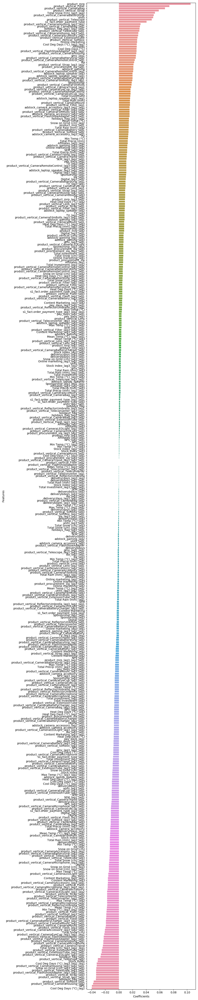

In [336]:
# Plotting Total Effect in the descending order of their importance
plt.figure(figsize=(10, 50), dpi=100, frameon='True')
sns.barplot(y='Features', x='Coefficients',data=cameraaccessory_dl_add_model_coeff, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()
plt.show()

### Building Linear Regression for Distributive Lag Model(additive) Data of Gaming Accessories

In [337]:
gamingaccessory_dl_add_model = LinearRegression().fit(X_gamingaccessory_dl_add_train, y_gamingaccessory_dl_add_train)
y_gamingaccessory_dl_add_test_pred = gamingaccessory_dl_add_model.predict(X_gamingaccessory_dl_add_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_dl_add_test, y_gamingaccessory_dl_add_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_dl_add_test, y_gamingaccessory_dl_add_test_pred)))

R2 Score: -0.9699781478481879
Mean Squared Error: 1.1806520149530493


- For Gaming R2 is again negative which means model is not able to identify the trend from the data

In [338]:
# Extracting coefficients
gamingaccessory_dl_add_model_coeff = pd.DataFrame(list(zip(X_gamingaccessory_dl_add_test.columns,list(gamingaccessory_dl_add_model.coef_)))).rename(columns= {0:'Features',1: 'Coefficients'})
gamingaccessory_dl_add_model_coeff = gamingaccessory_dl_add_model_coeff.sort_values(by=['Coefficients'], ascending = False)

** Top 5 features which are affecting GMV variables **

In [339]:
gamingaccessory_dl_add_model_coeff.head()

,Features,Coefficients
271,product_vertical_GamingAccessoryKit,0.107794
352,product_vertical_MotionController_lag1,0.062398
305,product_vertical_GamingKeyboard_lag2,0.049467
148,adstock_laptop_speaker_lag3_lag1,0.044506
327,product_vertical_GamingMousePad,0.043505


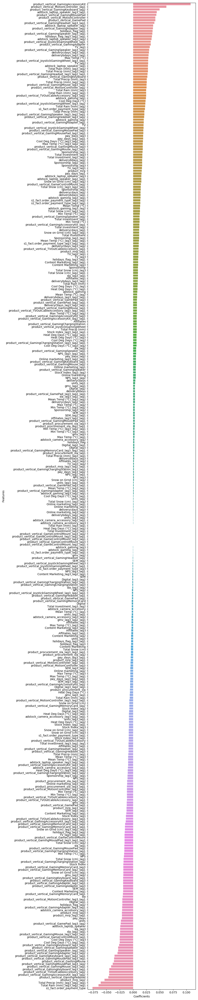

In [340]:
# Plotting Total Effect in the descending order of their importance
plt.figure(figsize=(10, 50), dpi=100, frameon='True')
sns.barplot(y='Features', x='Coefficients',data=gamingaccessory_dl_add_model_coeff, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()
plt.show()

### Building Linear Regression for Distributive Lag Model(additive) Data of Home Audio accessories

In [341]:
homeaudio_dl_add_model = LinearRegression().fit(X_homeaudio_dl_add_train, y_homeaudio_dl_add_train)
y_homeaudio_dl_add_test_pred = homeaudio_dl_add_model.predict(X_homeaudio_dl_add_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_dl_add_test, y_homeaudio_dl_add_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_dl_add_test, y_homeaudio_dl_add_test_pred)))

R2 Score: 0.39952858640555455
Mean Squared Error: 0.2798912020659308


- We got R2 of 0.39 and MSE of 0.277. Eventhough error is quite low but R2 is very less. It is able to explain only 39% of variance from the data

In [342]:
# Extracting coefficients
homeaudio_dl_add_model_coeff = pd.DataFrame(list(zip(X_homeaudio_dl_add_test.columns,list(homeaudio_dl_add_model.coef_)))).rename(columns= {0:'Features',1: 'Coefficients'})
homeaudio_dl_add_model_coeff = homeaudio_dl_add_model_coeff.sort_values(by=['Coefficients'], ascending = False)

** Top 5 features which are affecting GMV variables **

In [343]:
homeaudio_dl_add_model_coeff.head()

,Features,Coefficients
295,product_vertical_HomeAudioSpeaker,0.107389
47,product_mrp,0.081152
166,holidays_flag_lag3_lag2_lag1,0.080629
313,product_vertical_SlingBox_lag2,0.072004
206,Cool Deg Days (°C)_lag3_lag2_lag1,0.055794


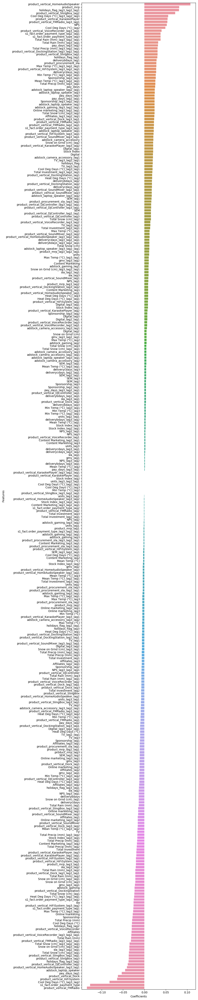

In [344]:
# Plotting Total Effect in the descending order of their importance
plt.figure(figsize=(10, 50), dpi=100, frameon='True')
sns.barplot(y='Features', x='Coefficients',data=homeaudio_dl_add_model_coeff, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()
plt.show()

# Distributive Lag Model(Multiplicative)
The Distributive Lag Model(Additive) helped us capture the not only the current, but also the carry-over effect of all the variables(depedent and independent).

Yt = α+ µ1Yt-1 + µ2Yt-2 + µ3Yt-3 + ....

    + β1X1t + β1X1t-1 + β1X1t-2 + ....

    + β2X2t + β2X2t-1 + β2X2t-2 + ....

    + β3X3t + β3X3t-1 + β3X3t-2 + ....

    + β4X4t + β4X4t-1 + β4X4t-2 + ....

    + β5X5t + β5X5t-1 + β5X5t-2 + ....

    + ϵ

Now the Distributive Lag Model(Multiplicative) will help us capture the interactions between current and carry over effects of the KPIs.

To fit a multiplicative model, take logarithms of the data(on both sides of the model), then analyse the log data as before.

Yt = α+ µ1ln(Yt-1) + µ2ln(Yt-2) + µ3ln(Yt-3) + ....

    + β1ln(X1t) + β1ln(X1t-1) + β1ln(X1t-2) + ....

    + β2ln(X2t) + β2ln(X2t-1) + β2ln(X2t-2) + ....

    + β3ln(X3t) + β3ln(X3t-1) + β3ln(X3t-2) + ....

    + β4ln(X4t) + β4ln(X4t-1) + β4ln(X4t-2) + ....

    + β5ln(X5t) + β5ln(X5t-1) + β5ln(X5t-2) + ....

    + ϵ'

In [345]:
# Taking copy of original dataframes
cameraaccessory_dl_mul_df = camera.copy()
gamingaccessory_dl_mul_df = gaming.copy()
homeaudio_dl_mul_df = homeaudio.copy()

### Creating 3 weeks, 2 weeks and 1 week Lag variables for all independent and dependent variables

**Creating 3 weeks lag of independent and dependent variables **

In [346]:
cameraaccessory_dl_mul_df = lag_variables(cameraaccessory_dl_mul_df,cameraaccessory_dl_mul_df.columns,3)
gamingaccessory_dl_mul_df = lag_variables(gamingaccessory_dl_mul_df,gamingaccessory_dl_mul_df.columns,3)
homeaudio_dl_mul_df = lag_variables(homeaudio_dl_mul_df,homeaudio_dl_mul_df.columns,3)

In [347]:
cameraaccessory_dl_mul_df.head()

,gmv,gmv_lag3,units,units_lag3,deliverybdays,deliverybdays_lag3,deliverycdays,deliverycdays_lag3,s1_fact.order_payment_type,s1_fact.order_payment_type_lag3,sla,sla_lag3,product_mrp,product_mrp_lag3,product_procurement_sla,product_procurement_sla_lag3,Total Investment,Total Investment_lag3,TV,TV_lag3,Digital,Digital_lag3,Sponsorship,Sponsorship_lag3,Content Marketing,Content Marketing_lag3,Online marketing,Online marketing_lag3,Affiliates,Affiliates_lag3,SEM,SEM_lag3,adstock_camera_accessory,adstock_camera_accessory_lag3,adstock_gaming,adstock_gaming_lag3,adstock_laptop_speaker,adstock_laptop_speaker_lag3,pay_days,pay_days_lag3,holidays_flag,holidays_flag_lag3,Max Temp (°C),Max Temp (°C)_lag3,Min Temp (°C),Min Temp (°C)_lag3,Mean Temp (°C),Mean Temp (°C)_lag3,Heat Deg Days (°C),Heat Deg Days (°C)_lag3,Cool Deg Days (°C),Cool Deg Days (°C)_lag3,Total Rain (mm),Total Rain (mm)_lag3,Total Snow (cm),Total Snow (cm)_lag3,Total Precip (mm),Total Precip (mm)_lag3,Snow on Grnd (cm),Snow on Grnd (cm)_lag3,NPS,NPS_lag3,Stock Index,Stock Index_lag3,product_vertical_CameraAccessory,product_vertical_CameraAccessory_lag3,product_vertical_CameraBag,product_vertical_CameraBag_lag3,product_vertical_CameraBattery,product_vertical_CameraBattery_lag3,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryCharger_lag3,product_vertical_CameraBatteryGrip,product_vertical_CameraBatteryGrip_lag3,product_vertical_CameraEyeCup,product_vertical_CameraEyeCup_lag3,product_vertical_CameraFilmRolls,product_vertical_CameraFilmRolls_lag3,product_vertical_CameraHousing,product_vertical_CameraHousing_lag3,product_vertical_CameraLEDLight,product_vertical_CameraLEDLight_lag3,product_vertical_CameraMicrophone,product_vertical_CameraMicrophone_lag3,product_vertical_CameraMount,product_vertical_CameraMount_lag3,product_vertical_CameraRemoteControl,product_vertical_CameraRemoteControl_lag3,product_vertical_CameraTripod,product_vertical_CameraTripod_lag3,product_vertical_ExtensionTube,product_vertical_ExtensionTube_lag3,product_vertical_Filter,product_vertical_Filter_lag3,product_vertical_Flash,product_vertical_Flash_lag3,product_vertical_FlashShoeAdapter,product_vertical_FlashShoeAdapter_lag3,product_vertical_Lens,product_vertical_Lens_lag3,product_vertical_ReflectorUmbrella,product_vertical_ReflectorUmbrella_lag3,product_vertical_Softbox,product_vertical_Softbox_lag3,product_vertical_Strap,product_vertical_Strap_lag3,product_vertical_Teleconverter,product_vertical_Teleconverter_lag3,product_vertical_Telescope,product_vertical_Telescope_lag3
week_number,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,962.074839,NaN,1.023873,NaN,0.000000,NaN,0.000000,NaN,0.809397,NaN,5.934824,NaN,1772.414172,NaN,2.881394,NaN,74.196,NaN,4.380000,NaN,0.456000,NaN,4.200000,NaN,0.900000,NaN,22.900000,NaN,7.370000,NaN,4.20000,NaN,0.787864,NaN,10.978516,NaN,6.593653e+06,NaN,0.000000,NaN,0.000000,NaN,16.237401,NaN,5.697423,NaN,11.499602,NaN,6.500398,NaN,0.0,NaN,2.234786,NaN,0.672414,NaN,2.907200,NaN,0.000000,NaN,47.0930,NaN,1052.0,NaN,0.009094,NaN,0.053050,NaN,0.109890,NaN,0.049451,NaN,0.000568,NaN,0.000568,NaN,0.005873,NaN,0.0,NaN,0.000189,NaN,0.00000,NaN,0.005684,NaN,0.016673,NaN,0.147025,NaN,0.000379,NaN,0.039977,NaN,0.383100,NaN,0.0,NaN,0.120121,NaN,0.0,NaN,0.0,NaN,0.004926,NaN,0.0,NaN,0.005873,NaN
2,1143.933543,NaN,1.019623,NaN,0.002616,NaN,0.002878,NaN,0.784929,NaN,6.630822,NaN,2037.649398,NaN,2.663004,NaN,74.196,NaN,4.380000,NaN,0.456000,NaN,4.200000,NaN,0.900000,NaN,22.900000,NaN,7.370000,NaN,4.20000,NaN,0.787864,NaN,10.978516,NaN,6.593653e+06,NaN,0.126897,NaN,0.000000,NaN,12.188645,NaN,2.458791,NaN,7.773548,NaN,10.226452,NaN,0.0,NaN,0.964417,NaN,0.000000,NaN,0.964417,NaN,4.276033,NaN,47.0930,NaN,1052.0,NaN,0.012559,NaN,0.069074,NaN,0.122449,NaN,0.060178,NaN,0.001832,NaN,0.000523,NaN,0.010466,NaN,0.0,NaN,0.000000,NaN,0.00000,NaN,0.005495,NaN,0.019885,NaN,0.151491,NaN,0.000523,NaN,0.057038,NaN,0.287023,NaN,0.0,

**Creating 2 weeks lag of independent and dependent variables **

In [348]:
cameraaccessory_dl_mul_df = lag_variables(cameraaccessory_dl_mul_df,cameraaccessory_dl_mul_df.columns,2)
gamingaccessory_dl_mul_df = lag_variables(gamingaccessory_dl_mul_df,gamingaccessory_dl_mul_df.columns,2)
homeaudio_dl_mul_df = lag_variables(homeaudio_dl_mul_df,homeaudio_dl_mul_df.columns,2)

In [349]:
cameraaccessory_dl_mul_df.head()

,gmv,gmv_lag2,gmv_lag3,gmv_lag3_lag2,units,units_lag2,units_lag3,units_lag3_lag2,deliverybdays,deliverybdays_lag2,deliverybdays_lag3,deliverybdays_lag3_lag2,deliverycdays,deliverycdays_lag2,deliverycdays_lag3,deliverycdays_lag3_lag2,s1_fact.order_payment_type,s1_fact.order_payment_type_lag2,s1_fact.order_payment_type_lag3,s1_fact.order_payment_type_lag3_lag2,sla,sla_lag2,sla_lag3,sla_lag3_lag2,product_mrp,product_mrp_lag2,product_mrp_lag3,product_mrp_lag3_lag2,product_procurement_sla,product_procurement_sla_lag2,product_procurement_sla_lag3,product_procurement_sla_lag3_lag2,Total Investment,Total Investment_lag2,Total Investment_lag3,Total Investment_lag3_lag2,TV,TV_lag2,TV_lag3,TV_lag3_lag2,Digital,Digital_lag2,Digital_lag3,Digital_lag3_lag2,Sponsorship,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_lag3_lag2,Content Marketing,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_lag3_lag2,Online marketing,Online marketing_lag2,Online marketing_lag3,Online marketing_lag3_lag2,Affiliates,Affiliates_lag2,Affiliates_lag3,Affiliates_lag3_lag2,SEM,SEM_lag2,SEM_lag3,SEM_lag3_lag2,adstock_camera_accessory,adstock_camera_accessory_lag2,adstock_camera_accessory_lag3,adstock_camera_accessory_lag3_lag2,adstock_gaming,adstock_gaming_lag2,adstock_gaming_lag3,adstock_gaming_lag3_lag2,adstock_laptop_speaker,adstock_laptop_speaker_lag2,adstock_laptop_speaker_lag3,adstock_laptop_speaker_lag3_lag2,pay_days,pay_days_lag2,pay_days_lag3,pay_days_lag3_lag2,holidays_flag,holidays_flag_lag2,holidays_flag_lag3,holidays_flag_lag3_lag2,Max Temp (°C),Max Temp (°C)_lag2,Max Temp (°C)_lag3,Max Temp (°C)_lag3_lag2,Min Temp (°C),Min Temp (°C)_lag2,Min Temp (°C)_lag3,Min Temp (°C)_lag3_lag2,Mean Temp (°C),Mean Temp (°C)_lag2,Mean Temp (°C)_lag3,Mean Temp (°C)_lag3_lag2,Heat Deg Days (°C),Heat Deg Days (°C)_lag2,Heat Deg Days (°C)_lag3,Heat Deg Days (°C)_lag3_lag2,Cool Deg Days (°C),Cool Deg Days (°C)_lag2,Cool Deg Days (°C)_lag3,Cool Deg Days (°C)_lag3_lag2,Total Rain (mm),Total Rain (mm)_lag2,Total Rain (mm)_lag3,Total Rain (mm)_lag3_lag2,Total Snow (cm),Total Snow (cm)_lag2,Total Snow (cm)_lag3,Total Snow (cm)_lag3_lag2,Total Precip (mm),Total Precip (mm)_lag2,Total Precip (mm)_lag3,Total Precip (mm)_lag3_lag2,Snow on Grnd (cm),Snow on Grnd (cm)_lag2,Snow on Grnd (cm)_lag3,Snow on Grnd (cm)_lag3_lag2,NPS,NPS_lag2,NPS_lag3,NPS_lag3_lag2,Stock Index,Stock Index_lag2,Stock Index_lag3,Stock Index_lag3_lag2,product_vertical_CameraAccessory,product_vertical_CameraAccessory_lag2,product_vertical_CameraAccessory_lag3,product_vertical_CameraAccessory_lag3_lag2,product_vertical_CameraBag,product_vertical_CameraBag_lag2,product_vertical_CameraBag_lag3,product_vertical_CameraBag_lag3_lag2,product_vertical_CameraBattery,product_vertical_CameraBattery_lag2,product_vertical_CameraBattery_lag3,product_vertical_CameraBattery_lag3_lag2,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryCharger_lag2,product_vertical_CameraBatteryCharger_lag3,product_vertical_CameraBatteryCharger_lag3_lag2,product_vertical_CameraBatteryGrip,product_vertical_CameraBatteryGrip_lag2,product_vertical_CameraBatteryGrip_lag3,product_vertical_CameraBatteryGrip_lag3_lag2,product_vertical_CameraEyeCup,product_vertical_CameraEyeCup_lag2,product_vertical_CameraEyeCup_lag3,product_vertical_CameraEyeCup_lag3_lag2,product_vertical_CameraFilmRolls,product_vertical_CameraFilmRolls_lag2,product_vertical_CameraFilmRolls_lag3,product_vertical_CameraFilmRolls_lag3_lag2,product_vertical_CameraHousing,product_vertical_CameraHousing_lag2,product_vertical_CameraHousing_lag3,product_vertical_CameraHousing_lag3_lag2,product_vertical_CameraLEDLight,product_vertical_CameraLEDLight_lag2,product_vertical_CameraLEDLight_lag3,product_vertical_CameraLEDLight_lag3_lag2,product_vertical_CameraMicrophone,product_vertical_CameraMicrophone_lag2,product_vertical_CameraMicrophone_lag3,product_vertical_CameraMicrophone_lag3_lag2,product_vertical_CameraMount,product_vertical_CameraMount_lag2,product_vertical

**Creating 1 week lag of independent and dependent variables **

In [350]:
cameraaccessory_dl_mul_df = lag_variables(cameraaccessory_dl_mul_df,cameraaccessory_dl_mul_df.columns,1)
gamingaccessory_dl_mul_df = lag_variables(gamingaccessory_dl_mul_df,gamingaccessory_dl_mul_df.columns,1)
homeaudio_dl_mul_df = lag_variables(homeaudio_dl_mul_df,homeaudio_dl_mul_df.columns,1)

In [351]:
cameraaccessory_dl_mul_df.head()

,gmv,gmv_lag1,gmv_lag2,gmv_lag2_lag1,gmv_lag3,gmv_lag3_lag1,gmv_lag3_lag2,gmv_lag3_lag2_lag1,units,units_lag1,units_lag2,units_lag2_lag1,units_lag3,units_lag3_lag1,units_lag3_lag2,units_lag3_lag2_lag1,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag2_lag1,deliverybdays_lag3,deliverybdays_lag3_lag1,deliverybdays_lag3_lag2,deliverybdays_lag3_lag2_lag1,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag2_lag1,deliverycdays_lag3,deliverycdays_lag3_lag1,deliverycdays_lag3_lag2,deliverycdays_lag3_lag2_lag1,s1_fact.order_payment_type,s1_fact.order_payment_type_lag1,s1_fact.order_payment_type_lag2,s1_fact.order_payment_type_lag2_lag1,s1_fact.order_payment_type_lag3,s1_fact.order_payment_type_lag3_lag1,s1_fact.order_payment_type_lag3_lag2,s1_fact.order_payment_type_lag3_lag2_lag1,sla,sla_lag1,sla_lag2,sla_lag2_lag1,sla_lag3,sla_lag3_lag1,sla_lag3_lag2,sla_lag3_lag2_lag1,product_mrp,product_mrp_lag1,product_mrp_lag2,product_mrp_lag2_lag1,product_mrp_lag3,product_mrp_lag3_lag1,product_mrp_lag3_lag2,product_mrp_lag3_lag2_lag1,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag2_lag1,product_procurement_sla_lag3,product_procurement_sla_lag3_lag1,product_procurement_sla_lag3_lag2,product_procurement_sla_lag3_lag2_lag1,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag2_lag1,Total Investment_lag3,Total Investment_lag3_lag1,Total Investment_lag3_lag2,Total Investment_lag3_lag2_lag1,TV,TV_lag1,TV_lag2,TV_lag2_lag1,TV_lag3,TV_lag3_lag1,TV_lag3_lag2,TV_lag3_lag2_lag1,Digital,Digital_lag1,Digital_lag2,Digital_lag2_lag1,Digital_lag3,Digital_lag3_lag1,Digital_lag3_lag2,Digital_lag3_lag2_lag1,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag2_lag1,Sponsorship_lag3,Sponsorship_lag3_lag1,Sponsorship_lag3_lag2,Sponsorship_lag3_lag2_lag1,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag2_lag1,Content Marketing_lag3,Content Marketing_lag3_lag1,Content Marketing_lag3_lag2,Content Marketing_lag3_lag2_lag1,Online marketing,Online marketing_lag1,Online marketing_lag2,Online marketing_lag2_lag1,Online marketing_lag3,Online marketing_lag3_lag1,Online marketing_lag3_lag2,Online marketing_lag3_lag2_lag1,Affiliates,Affiliates_lag1,Affiliates_lag2,Affiliates_lag2_lag1,Affiliates_lag3,Affiliates_lag3_lag1,Affiliates_lag3_lag2,Affiliates_lag3_lag2_lag1,SEM,SEM_lag1,SEM_lag2,SEM_lag2_lag1,SEM_lag3,SEM_lag3_lag1,SEM_lag3_lag2,SEM_lag3_lag2_lag1,adstock_camera_accessory,adstock_camera_accessory_lag1,adstock_camera_accessory_lag2,adstock_camera_accessory_lag2_lag1,adstock_camera_accessory_lag3,adstock_camera_accessory_lag3_lag1,adstock_camera_accessory_lag3_lag2,adstock_camera_accessory_lag3_lag2_lag1,adstock_gaming,adstock_gaming_lag1,adstock_gaming_lag2,adstock_gaming_lag2_lag1,adstock_gaming_lag3,adstock_gaming_lag3_lag1,adstock_gaming_lag3_lag2,adstock_gaming_lag3_lag2_lag1,adstock_laptop_speaker,adstock_laptop_speaker_lag1,adstock_laptop_speaker_lag2,adstock_laptop_speaker_lag2_lag1,adstock_laptop_speaker_lag3,adstock_laptop_speaker_lag3_lag1,adstock_laptop_speaker_lag3_lag2,adstock_laptop_speaker_lag3_lag2_lag1,pay_days,pay_days_lag1,pay_days_lag2,pay_days_lag2_lag1,pay_days_lag3,pay_days_lag3_lag1,pay_days_lag3_lag2,pay_days_lag3_lag2_lag1,holidays_flag,holidays_flag_lag1,holidays_flag_lag2,holidays_flag_lag2_lag1,holidays_flag_lag3,holidays_flag_lag3_lag1,holidays_flag_lag3_lag2,holidays_flag_lag3_lag2_lag1,Max Temp (°C),Max Temp (°C)_lag1,Max Temp (°C)_lag2,Max Temp (°C)_lag2_lag1,Max Temp (°C)_lag3,Max Temp (°C)_lag3_lag1,Max Temp (°C)_lag3_lag2,Max Temp (°C)_lag3_lag2_lag1,Min Temp (°C),Min Temp (°C)_lag1,Min Temp (°C)_lag2,Min Temp (°C)_lag2_lag1,Min Temp (°C)_lag3,Min Temp (°C)_lag3_lag1,Min Temp (°C)_lag3_lag2,Min Temp (°C)_lag3_lag2_lag1,Mean Temp (°C),Mean Temp (°C)_lag1,Mean Temp (°C)_lag2,Mean Temp (°C)_lag2_lag1,Mean Temp (°C)_lag3,Mean Temp (°C)_lag3_lag1,Mean Temp (°C)_lag3_la

In [352]:
# Replacing all null values with 0
cameraaccessory_dl_mul_df = cameraaccessory_dl_mul_df.fillna(0)
gamingaccessory_dl_mul_df = gamingaccessory_dl_mul_df.fillna(0)
homeaudio_dl_mul_df = homeaudio_dl_mul_df.fillna(0)

### Applying Logarithm on both independent and dependent variables

After taking log, all 0 values will be transformed to infinity. So, retransforming these values to 0.

In [353]:
cameraaccessory_dl_mul_df = cameraaccessory_dl_mul_df.applymap(lambda x: np.log(x))
cameraaccessory_dl_mul_df = cameraaccessory_dl_mul_df.replace([np.inf, -np.inf], 0)
cameraaccessory_dl_mul_df = cameraaccessory_dl_mul_df.replace(np.nan, 0)

gamingaccessory_dl_mul_df = gamingaccessory_dl_mul_df.applymap(lambda x: np.log(x))
gamingaccessory_dl_mul_df = gamingaccessory_dl_mul_df.replace([np.inf, -np.inf], 0)
gamingaccessory_dl_mul_df = gamingaccessory_dl_mul_df.replace(np.nan, 0)

homeaudio_dl_mul_df = homeaudio_dl_mul_df.applymap(lambda x: np.log(x))
homeaudio_dl_mul_df = homeaudio_dl_mul_df.replace([np.inf, -np.inf], 0)
homeaudio_dl_mul_df = homeaudio_dl_mul_df.replace(np.nan, 0)

In [354]:
cameraaccessory_dl_mul_df.head()

,gmv,gmv_lag1,gmv_lag2,gmv_lag2_lag1,gmv_lag3,gmv_lag3_lag1,gmv_lag3_lag2,gmv_lag3_lag2_lag1,units,units_lag1,units_lag2,units_lag2_lag1,units_lag3,units_lag3_lag1,units_lag3_lag2,units_lag3_lag2_lag1,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag2_lag1,deliverybdays_lag3,deliverybdays_lag3_lag1,deliverybdays_lag3_lag2,deliverybdays_lag3_lag2_lag1,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag2_lag1,deliverycdays_lag3,deliverycdays_lag3_lag1,deliverycdays_lag3_lag2,deliverycdays_lag3_lag2_lag1,s1_fact.order_payment_type,s1_fact.order_payment_type_lag1,s1_fact.order_payment_type_lag2,s1_fact.order_payment_type_lag2_lag1,s1_fact.order_payment_type_lag3,s1_fact.order_payment_type_lag3_lag1,s1_fact.order_payment_type_lag3_lag2,s1_fact.order_payment_type_lag3_lag2_lag1,sla,sla_lag1,sla_lag2,sla_lag2_lag1,sla_lag3,sla_lag3_lag1,sla_lag3_lag2,sla_lag3_lag2_lag1,product_mrp,product_mrp_lag1,product_mrp_lag2,product_mrp_lag2_lag1,product_mrp_lag3,product_mrp_lag3_lag1,product_mrp_lag3_lag2,product_mrp_lag3_lag2_lag1,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag2_lag1,product_procurement_sla_lag3,product_procurement_sla_lag3_lag1,product_procurement_sla_lag3_lag2,product_procurement_sla_lag3_lag2_lag1,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag2_lag1,Total Investment_lag3,Total Investment_lag3_lag1,Total Investment_lag3_lag2,Total Investment_lag3_lag2_lag1,TV,TV_lag1,TV_lag2,TV_lag2_lag1,TV_lag3,TV_lag3_lag1,TV_lag3_lag2,TV_lag3_lag2_lag1,Digital,Digital_lag1,Digital_lag2,Digital_lag2_lag1,Digital_lag3,Digital_lag3_lag1,Digital_lag3_lag2,Digital_lag3_lag2_lag1,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag2_lag1,Sponsorship_lag3,Sponsorship_lag3_lag1,Sponsorship_lag3_lag2,Sponsorship_lag3_lag2_lag1,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag2_lag1,Content Marketing_lag3,Content Marketing_lag3_lag1,Content Marketing_lag3_lag2,Content Marketing_lag3_lag2_lag1,Online marketing,Online marketing_lag1,Online marketing_lag2,Online marketing_lag2_lag1,Online marketing_lag3,Online marketing_lag3_lag1,Online marketing_lag3_lag2,Online marketing_lag3_lag2_lag1,Affiliates,Affiliates_lag1,Affiliates_lag2,Affiliates_lag2_lag1,Affiliates_lag3,Affiliates_lag3_lag1,Affiliates_lag3_lag2,Affiliates_lag3_lag2_lag1,SEM,SEM_lag1,SEM_lag2,SEM_lag2_lag1,SEM_lag3,SEM_lag3_lag1,SEM_lag3_lag2,SEM_lag3_lag2_lag1,adstock_camera_accessory,adstock_camera_accessory_lag1,adstock_camera_accessory_lag2,adstock_camera_accessory_lag2_lag1,adstock_camera_accessory_lag3,adstock_camera_accessory_lag3_lag1,adstock_camera_accessory_lag3_lag2,adstock_camera_accessory_lag3_lag2_lag1,adstock_gaming,adstock_gaming_lag1,adstock_gaming_lag2,adstock_gaming_lag2_lag1,adstock_gaming_lag3,adstock_gaming_lag3_lag1,adstock_gaming_lag3_lag2,adstock_gaming_lag3_lag2_lag1,adstock_laptop_speaker,adstock_laptop_speaker_lag1,adstock_laptop_speaker_lag2,adstock_laptop_speaker_lag2_lag1,adstock_laptop_speaker_lag3,adstock_laptop_speaker_lag3_lag1,adstock_laptop_speaker_lag3_lag2,adstock_laptop_speaker_lag3_lag2_lag1,pay_days,pay_days_lag1,pay_days_lag2,pay_days_lag2_lag1,pay_days_lag3,pay_days_lag3_lag1,pay_days_lag3_lag2,pay_days_lag3_lag2_lag1,holidays_flag,holidays_flag_lag1,holidays_flag_lag2,holidays_flag_lag2_lag1,holidays_flag_lag3,holidays_flag_lag3_lag1,holidays_flag_lag3_lag2,holidays_flag_lag3_lag2_lag1,Max Temp (°C),Max Temp (°C)_lag1,Max Temp (°C)_lag2,Max Temp (°C)_lag2_lag1,Max Temp (°C)_lag3,Max Temp (°C)_lag3_lag1,Max Temp (°C)_lag3_lag2,Max Temp (°C)_lag3_lag2_lag1,Min Temp (°C),Min Temp (°C)_lag1,Min Temp (°C)_lag2,Min Temp (°C)_lag2_lag1,Min Temp (°C)_lag3,Min Temp (°C)_lag3_lag1,Min Temp (°C)_lag3_lag2,Min Temp (°C)_lag3_lag2_lag1,Mean Temp (°C),Mean Temp (°C)_lag1,Mean Temp (°C)_lag2,Mean Temp (°C)_lag2_lag1,Mean Temp (°C)_lag3,Mean Temp (°C)_lag3_lag1,Mean Temp (°C)_lag3_la

In [355]:
# Scaling the variables 
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

cameraaccessory_dl_mul_df[cameraaccessory_dl_mul_df.columns]=scaler.fit_transform(cameraaccessory_dl_mul_df[cameraaccessory_dl_mul_df.columns])
gamingaccessory_dl_mul_df[gamingaccessory_dl_mul_df.columns]=scaler.fit_transform(gamingaccessory_dl_mul_df[gamingaccessory_dl_mul_df.columns])
homeaudio_dl_mul_df[homeaudio_dl_mul_df.columns]=scaler.fit_transform(homeaudio_dl_mul_df[homeaudio_dl_mul_df.columns])

In [356]:
# Train and test splitting
cameraaccessory_dl_mul_train, cameraaccessory_dl_mul_test = train_test_split(cameraaccessory_dl_mul_df, test_size = 0.3, random_state = 2)

gamingaccessory_dl_mul_train, gamingaccessory_dl_mul_test = train_test_split(gamingaccessory_dl_mul_df, test_size = 0.3, random_state = 2)

homeaudio_dl_mul_train, homeaudio_dl_mul_test = train_test_split(homeaudio_dl_mul_df, test_size = 0.3, random_state = 2)


In [357]:
# Separating X and y variables
# For train
y_cameraaccessory_dl_mul_train = cameraaccessory_dl_mul_train.pop('gmv')
X_cameraaccessory_dl_mul_train = cameraaccessory_dl_mul_train

y_gamingaccessory_dl_mul_train = gamingaccessory_dl_mul_train.pop('gmv')
X_gamingaccessory_dl_mul_train = gamingaccessory_dl_mul_train

y_homeaudio_dl_mul_train = homeaudio_dl_mul_train.pop('gmv')
X_homeaudio_dl_mul_train = homeaudio_dl_mul_train

# For test
y_cameraaccessory_dl_mul_test = cameraaccessory_dl_mul_test.pop('gmv')
X_cameraaccessory_dl_mul_test = cameraaccessory_dl_mul_test

y_gamingaccessory_dl_mul_test = gamingaccessory_dl_mul_test.pop('gmv')
X_gamingaccessory_dl_mul_test = gamingaccessory_dl_mul_test

y_homeaudio_dl_mul_test = homeaudio_dl_mul_test.pop('gmv')
X_homeaudio_dl_mul_test = homeaudio_dl_mul_test

### Building Linear Regression for the Distributed Lag Multiplicative camera accessories dataset

In [358]:
cameraaccessory_dl_mul_model = LinearRegression().fit(X_cameraaccessory_dl_mul_train, y_cameraaccessory_dl_mul_train)
y_cameraaccessory_dl_mul_test_pred = cameraaccessory_dl_mul_model.predict(X_cameraaccessory_dl_mul_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_dl_mul_test, y_cameraaccessory_dl_mul_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_dl_mul_test, y_cameraaccessory_dl_mul_test_pred)))

R2 Score: 0.7449483995391778
Mean Squared Error: 0.37390272853394463


- We got R2 of 0.74 which is very good and MSE also 0.37. So overall it is very good

In [359]:
# Extracting coefficients
cameraaccessory_dl_mul_model_coeff = pd.DataFrame(list(zip(X_cameraaccessory_dl_mul_test.columns,list(cameraaccessory_dl_mul_model.coef_)))).rename(columns= {0:'Features',1: 'Coefficients'})
cameraaccessory_dl_mul_model_coeff = cameraaccessory_dl_mul_model_coeff.sort_values(by=['Coefficients'], ascending = False)

** Top 5 features which are affecting GMV variable **

In [372]:
cameraaccessory_dl_mul_model_coeff.head(10)

,Features,Coefficients
47,product_mrp,0.086679
334,product_vertical_CameraMicrophone_lag3_lag2_lag1,0.049275
7,units,0.047077
329,product_vertical_CameraMicrophone_lag2,0.044809
204,Cool Deg Days (°C)_lag3_lag1,0.039406
390,product_vertical_FlashShoeAdapter_lag3_lag2_lag1,0.037748
221,Total Snow (cm)_lag3_lag2,0.036413
161,holidays_flag_lag2,0.035290
297,product_vertical_CameraEyeCup_lag2,0.034917
412,product_vertical_Softbox_lag3_lag1,0.033135


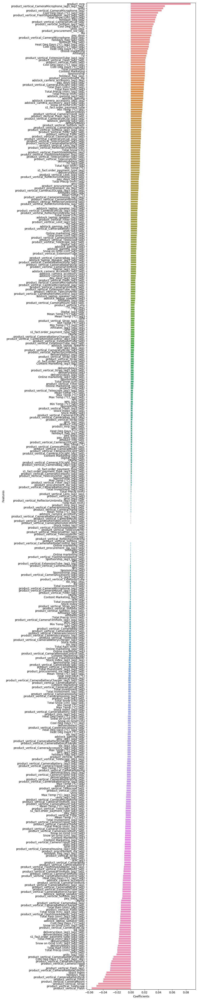

In [361]:
# Plotting Total Effect in the descending order of their importance
plt.figure(figsize=(10, 50), dpi=100, frameon='True')
sns.barplot(y='Features', x='Coefficients',data=cameraaccessory_dl_mul_model_coeff, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()
plt.show()

### Building Linear Regression for the Distributed Lag Multiplicative Gaming accessories dataset

In [362]:
gamingaccessory_dl_mul_model = LinearRegression().fit(X_gamingaccessory_dl_mul_train, y_gamingaccessory_dl_mul_train)
y_gamingaccessory_dl_mul_test_pred = gamingaccessory_dl_mul_model.predict(X_gamingaccessory_dl_mul_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_dl_mul_test, y_gamingaccessory_dl_mul_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_dl_mul_test, y_gamingaccessory_dl_mul_test_pred)))

R2 Score: -1.6827238072195962
Mean Squared Error: 1.0128373789889789


- Even this Distributed Lag Model with Multiplicative also not able to identify the pattern from gaming data. So we are getting negative R2 value

In [363]:
# Extracting coefficients
gamingaccessory_dl_mul_model_coeff = pd.DataFrame(list(zip(X_gamingaccessory_dl_mul_test.columns,list(gamingaccessory_dl_mul_model.coef_)))).rename(columns= {0:'Features',1: 'Coefficients'})
gamingaccessory_dl_mul_model_coeff = gamingaccessory_dl_mul_model_coeff.sort_values(by=['Coefficients'], ascending = False)

**Top 5 features which are affecting GMV variable**

In [364]:
gamingaccessory_dl_mul_model_coeff.head()

,Features,Coefficients
263,product_vertical_GamePad,0.071426
47,product_mrp,0.054910
9,units_lag2,0.054296
165,holidays_flag_lag3_lag2,0.046868
256,product_vertical_GameControlMount_lag1,0.044005


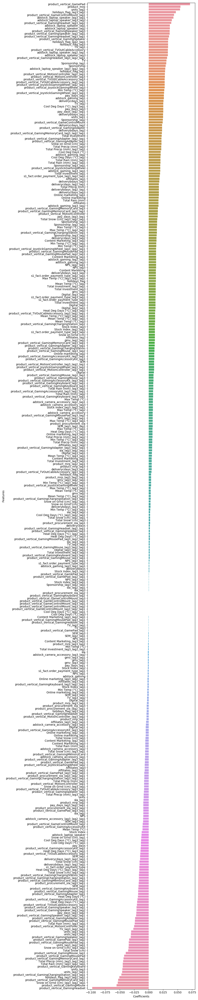

In [365]:
# Plotting Total Effect in the descending order of their importance
plt.figure(figsize=(10, 50), dpi=100, frameon='True')
sns.barplot(y='Features', x='Coefficients',data=gamingaccessory_dl_mul_model_coeff, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()
plt.show()

### Building Linear Regression for the Distributed Lag Multiplicative Home Audio accessories dataset

In [366]:
homeaudio_dl_mul_model = LinearRegression().fit(X_homeaudio_dl_mul_train, y_homeaudio_dl_mul_train)
y_homeaudio_dl_mul_test_pred = homeaudio_dl_mul_model.predict(X_homeaudio_dl_mul_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_dl_mul_test, y_homeaudio_dl_mul_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_dl_mul_test, y_homeaudio_dl_mul_test_pred)))

R2 Score: 0.48758741632000413
Mean Squared Error: 0.2666062738326423


- We got R2 of 0.48 which means it is able to explain only 48% of the variance from the data which is really poor but the error is less only.

In [367]:
# Extracting coefficients
homeaudio_dl_mul_model_coeff = pd.DataFrame(list(zip(X_homeaudio_dl_mul_test.columns,list(homeaudio_dl_mul_model.coef_)))).rename(columns= {0:'Features',1: 'Coefficients'})
homeaudio_dl_mul_model_coeff = homeaudio_dl_mul_model_coeff.sort_values(by=['Coefficients'], ascending = False)

**Top 5 features which are affecting GMV variable**

In [368]:
homeaudio_dl_mul_model_coeff.head()

,Features,Coefficients
295,product_vertical_HomeAudioSpeaker,0.117173
47,product_mrp,0.101108
287,product_vertical_HiFiSystem,0.090613
263,product_vertical_Dock,0.078597
255,product_vertical_DJController,0.047431


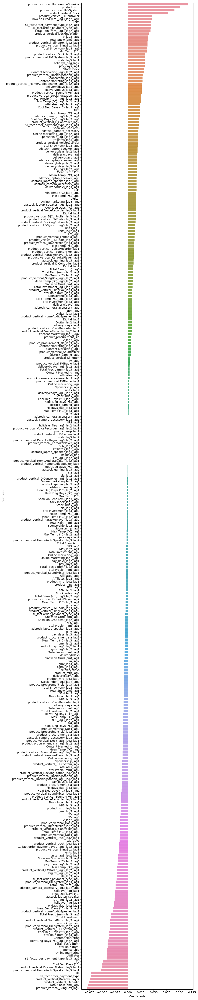

In [369]:
# Plotting Total Effect in the descending order of their importance
plt.figure(figsize=(10, 50), dpi=100, frameon='True')
sns.barplot(y='Features', x='Coefficients',data=homeaudio_dl_mul_model_coeff, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()
plt.show()

# Summary Results of the above Models:

### We have implemented Linear Regression by using :
    i.    Additive 
    ii.   Multipliative 
    iii.  Koyck 
    iv.   Distributive Lag Model(additive) and 
    v.    Distributive Lag Model(Multiplicative)

|Linear Regression Model|Category of Product|R2|MSE|
|------|------|------|------|
|Additive  |Camera Accessories  |0.16  | 86795.12 |
|Multiplicative  |Camera Accessories |0.55 | 0.726 |
|Koyck  |Camera Accessories |0.55|0.15 |
|Distributive Lag Model(additive)  |Camera Accessories  |0.69| 0.36 |
|Distributive Lag Model(multiplicative)  |Camera Accessories  |0.74  | 0.37 |
|------|------|------|------|
|Additive  |Gaming Accessories  |-159.98  | 4666678.82 |
|Multiplicative  |Gaming Accessories |-0.584 | 3.182 |
|Koyck  |Gaming Accessories |-51.51|30.43 |
|Distributive Lag Model(additive)  |Gaming Accessories  |-0.96| 1.18 |
|Distributive Lag Model(multiplicative)  |Gaming Accessories  |-1.68  | 1.01 |
|------|------|------|------|
|Additive  |Home Audio Accessories  |-4.6738  | 39930.97 |
|Multiplicative  |Home Audio Accessories |-3.48 | 1.77 |
|Koyck  |Home Audio Accessories |-9.8|2.7 |
|Distributive Lag Model(additive)  |Home Audio Accessories  |0.39| 0.27 |
|Distributive Lag Model(multiplicative)  |Home Audio Accessories  |0.48  | 0.26 |

## Selecting Best Model for Each Products:



### Camera Accessories:
 - Distributive Lag Model(multiplicative) is giving R2 of 0.74 and MSE of 0.37
 - It means, 74 % of the variance from the data is able to explain by the model with mean squared error of 0.37
 
  **Best Equation with Top 5 Products: **
  
  Revenue(GMV) = (0.08) * product_mrp + (0.04) * product_vertical_CameraMicrophone +(0.04) * units + (0.03) * Cool Deg Days (°C) + (0.037) * product_vertical_FlashShoeAdapter
 
### Gaming Accessories:
- Distributive Lag Model(multiplicative) is giving R2 of -1.68 and MSE of 1.01.
- Actually all the above implemented models has been not able to explain the good amount of variance from the gaming accessories dataset. Eventhough we got the less error but the model is not able to identify the variance properly and here R2 is negative which signifies that the chosen model does not follow the trend of the data, so it fits worse than a horizontal line. It simply means the chosen model (with its constraints) fits the data really poor.

  **Best Equation with Top 5 Products: **

  Revenue(GMV) = (0.07) * product_vertical_GamePad +(0.05) *product_mrp + (0.054)*units +(0.04) * holidays_flag +(0.044) * product_vertical_GameControlMount

### Home Audio Accessories
- Distributive Lag Model(multiplicative) is giving R2 of 0.48 and MSE of 0.26
- It means 48% of the variance from the data is able to explain by this model with mean squared error of 0.26
- Eventhough the R2 is very less but it is comparably high with other models.

  **Best Equation with Top 5 Products: **

  Revenue(GMV) =  (0.11)* product_vertical_HomeAudioSpeaker + (0.10) * product_mrp + (0.090) * product_vertical_HiFiSystem+(0.078) * product_vertical_Dock+  (0.047) * product_vertical_DJController

# Recommendations to the ElecKart Firm based on above results

### For Camera Accessories:
- Company should take product_mrp into consideration. Since 1 unit increase in product_mrp by keeping other variables constant would lead to increase revenue by 0.08 times
- Apart from that company should focus on product_vertical_CameraMicrophone , units, Cool Deg Days (°C) and product_vertical_FlashShoeAdapter features to increase revenue

### For Gaming Accessories:
- Company should take product_vertical_GamePad into consideration. Since 1 unit increase in product_mrp by keeping other variables constant would lead to increase revenue by 0.07 times
- Apart from that company should focus on product_mrp ,units ,holidays_flag  and product_vertical_GameControlMount to increase revenue

### For Home  Audio Accessories:
- Company should take  product_vertical_HomeAudioSpeaker  into consideration. Since 1 unit increase in product_mrp by keeping other variables constant would lead to increase revenue by 0.11 times
- Apart from that company should focus on product_mrp , product_vertical_HiFiSystem, product_vertical_Dock and product_vertical_DJController to increase revenue